<a href="https://colab.research.google.com/github/encinas88/fashionML/blob/master/fashion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

In [0]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()
x_train = x_train/127.5-1
x_train = np.expand_dims(x_train, axis=3)

In [0]:
def create_generator():
  model = Sequential()

  model.add(Dense(256, input_dim=100))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))
  
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(1024))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(np.prod((28, 28, 1)), activation='tanh'))
  model.add(Reshape((28, 28, 1)))

  model.summary()

  noise = Input(shape=(100,))
  img = model(noise)

  return Model(noise, img)

generator = create_generator()
z = Input(shape=(100,))
img = generator(z)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 256)               1024      
_________________________________________________________________
dense_9 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 512)               2048      
_________________________________________________________________
dense_10 (Dense)             (None, 1024)             

In [0]:
def create_discriminator():
  model = Sequential()

  model.add(Flatten(input_shape=(28, 28, 1)))
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(Dense(256))
  model.add(LeakyReLU(0.2))
  model.add(Dense(1, activation='sigmoid'))
  model.summary()

  img = Input(shape=(28, 28, 1))
  validity = model(img)

  return Model(img, validity)

discriminator = create_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
discriminator.trainable = False

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

In [0]:
validity = discriminator(img)
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

In [0]:
def sample_images(epoch):
  r, c = 5, 5
  noise = np.random.normal(0, 1, (r*c, 100))
  gen_imgs = generator.predict(noise)

  # Rescale images 0 - 1
  gen_imgs = 0.5*gen_imgs+0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
    for j in range(c):
      axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
      axs[i, j].axis('off')
      cnt += 1
  #fig.savefig("images/%d.png" % epoch)
  plt.show()
  plt.close()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.706712, acc.: 42.19%] [G loss: 0.793666]


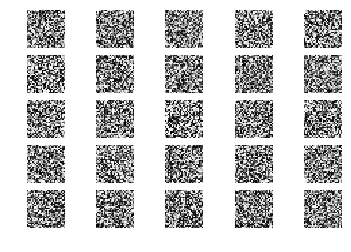

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.435867, acc.: 75.00%] [G loss: 0.801466]
2 [D loss: 0.346943, acc.: 84.38%] [G loss: 0.883395]
3 [D loss: 0.284196, acc.: 96.88%] [G loss: 1.025293]
4 [D loss: 0.275739, acc.: 98.44%] [G loss: 1.100944]
5 [D loss: 0.229353, acc.: 98.44%] [G loss: 1.223957]
6 [D loss: 0.211627, acc.: 100.00%] [G loss: 1.356611]
7 [D loss: 0.186845, acc.: 100.00%] [G loss: 1.418444]
8 [D loss: 0.173618, acc.: 98.44%] [G loss: 1.549696]
9 [D loss: 0.148653, acc.: 98.44%] [G loss: 1.600216]
10 [D loss: 0.128835, acc.: 100.00%] [G loss: 1.713860]
11 [D loss: 0.141617, acc.: 100.00%] [G loss: 1.719360]
12 [D loss: 0.119428, acc.: 100.00%] [G loss: 1.824593]
13 [D loss: 0.108433, acc.: 100.00%] [G loss: 1.958944]
14 [D loss: 0.104218, acc.: 100.00%] [G loss: 1.992478]
15 [D loss: 0.094143, acc.: 100.00%] [G loss: 2.086207]
16 [D loss: 0.099605, acc.: 100.00%] [G loss: 2.124576]
17 [D loss: 0.082831, acc.: 100.00%] [G loss: 2.219743]
18 [D loss: 0.078441, acc.: 100.00%] [G loss: 2.329344]
19 [D lo

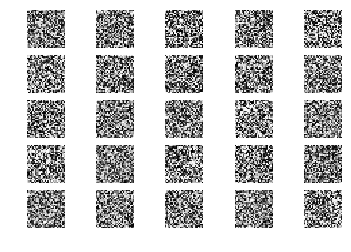

51 [D loss: 0.023021, acc.: 100.00%] [G loss: 3.540974]
52 [D loss: 0.022028, acc.: 100.00%] [G loss: 3.572751]
53 [D loss: 0.028999, acc.: 100.00%] [G loss: 3.526002]
54 [D loss: 0.021189, acc.: 100.00%] [G loss: 3.661662]
55 [D loss: 0.021896, acc.: 100.00%] [G loss: 3.734328]
56 [D loss: 0.020101, acc.: 100.00%] [G loss: 3.689013]
57 [D loss: 0.019945, acc.: 100.00%] [G loss: 3.786223]
58 [D loss: 0.025282, acc.: 100.00%] [G loss: 3.717244]
59 [D loss: 0.020001, acc.: 100.00%] [G loss: 3.848914]
60 [D loss: 0.018852, acc.: 100.00%] [G loss: 3.689095]
61 [D loss: 0.018322, acc.: 100.00%] [G loss: 3.866994]
62 [D loss: 0.018062, acc.: 100.00%] [G loss: 3.755012]
63 [D loss: 0.021359, acc.: 100.00%] [G loss: 3.968242]
64 [D loss: 0.018196, acc.: 100.00%] [G loss: 3.949188]
65 [D loss: 0.018280, acc.: 100.00%] [G loss: 3.879135]
66 [D loss: 0.020026, acc.: 100.00%] [G loss: 3.922134]
67 [D loss: 0.017079, acc.: 100.00%] [G loss: 3.812996]
68 [D loss: 0.036569, acc.: 98.44%] [G loss: 3.8

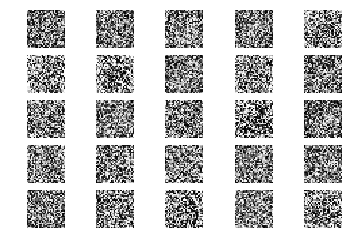

101 [D loss: 0.012532, acc.: 100.00%] [G loss: 4.438493]
102 [D loss: 0.019412, acc.: 100.00%] [G loss: 4.558269]
103 [D loss: 0.023661, acc.: 100.00%] [G loss: 4.539253]
104 [D loss: 0.021090, acc.: 100.00%] [G loss: 4.481571]
105 [D loss: 0.022390, acc.: 100.00%] [G loss: 4.427072]
106 [D loss: 0.013661, acc.: 100.00%] [G loss: 4.488647]
107 [D loss: 0.050770, acc.: 100.00%] [G loss: 4.564705]
108 [D loss: 0.018765, acc.: 100.00%] [G loss: 4.664335]
109 [D loss: 0.019089, acc.: 100.00%] [G loss: 4.783444]
110 [D loss: 0.012648, acc.: 100.00%] [G loss: 4.652745]
111 [D loss: 0.019577, acc.: 100.00%] [G loss: 4.775392]
112 [D loss: 0.015592, acc.: 100.00%] [G loss: 4.676232]
113 [D loss: 0.022637, acc.: 100.00%] [G loss: 4.667640]
114 [D loss: 0.026052, acc.: 100.00%] [G loss: 4.607102]
115 [D loss: 0.018779, acc.: 100.00%] [G loss: 4.835620]
116 [D loss: 0.021282, acc.: 100.00%] [G loss: 4.687419]
117 [D loss: 0.018776, acc.: 100.00%] [G loss: 4.797170]
118 [D loss: 0.015434, acc.: 10

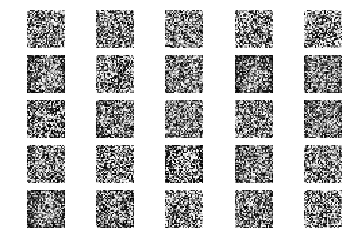

151 [D loss: 0.026315, acc.: 100.00%] [G loss: 4.806970]
152 [D loss: 0.058523, acc.: 98.44%] [G loss: 4.688468]
153 [D loss: 0.024433, acc.: 100.00%] [G loss: 4.594773]
154 [D loss: 0.035842, acc.: 100.00%] [G loss: 4.895951]
155 [D loss: 0.037305, acc.: 100.00%] [G loss: 4.741346]
156 [D loss: 0.065313, acc.: 96.88%] [G loss: 4.883038]
157 [D loss: 0.061876, acc.: 96.88%] [G loss: 5.292478]
158 [D loss: 0.110226, acc.: 98.44%] [G loss: 4.512763]
159 [D loss: 0.058222, acc.: 98.44%] [G loss: 4.643564]
160 [D loss: 0.074689, acc.: 98.44%] [G loss: 4.190643]
161 [D loss: 0.049076, acc.: 100.00%] [G loss: 4.566976]
162 [D loss: 0.039753, acc.: 98.44%] [G loss: 5.057399]
163 [D loss: 0.072943, acc.: 98.44%] [G loss: 4.715408]
164 [D loss: 0.023475, acc.: 100.00%] [G loss: 4.768502]
165 [D loss: 0.071048, acc.: 98.44%] [G loss: 4.870324]
166 [D loss: 0.010808, acc.: 100.00%] [G loss: 4.916914]
167 [D loss: 0.063821, acc.: 96.88%] [G loss: 4.733357]
168 [D loss: 0.075847, acc.: 93.75%] [G l

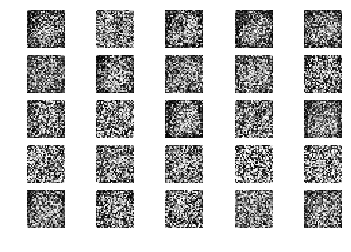

201 [D loss: 0.184306, acc.: 90.62%] [G loss: 4.166188]
202 [D loss: 0.201518, acc.: 92.19%] [G loss: 4.117902]
203 [D loss: 0.063760, acc.: 100.00%] [G loss: 4.072780]
204 [D loss: 0.153063, acc.: 93.75%] [G loss: 4.004447]
205 [D loss: 0.071138, acc.: 98.44%] [G loss: 4.515731]
206 [D loss: 0.101461, acc.: 98.44%] [G loss: 4.607682]
207 [D loss: 0.069128, acc.: 98.44%] [G loss: 4.709876]
208 [D loss: 0.234666, acc.: 96.88%] [G loss: 3.630631]
209 [D loss: 0.036564, acc.: 100.00%] [G loss: 3.546650]
210 [D loss: 0.148108, acc.: 95.31%] [G loss: 3.773285]
211 [D loss: 0.109598, acc.: 98.44%] [G loss: 4.160503]
212 [D loss: 0.082111, acc.: 98.44%] [G loss: 3.935016]
213 [D loss: 0.081652, acc.: 96.88%] [G loss: 4.526502]
214 [D loss: 0.117227, acc.: 95.31%] [G loss: 4.115891]
215 [D loss: 0.145836, acc.: 92.19%] [G loss: 4.091370]
216 [D loss: 0.057680, acc.: 100.00%] [G loss: 4.745678]
217 [D loss: 0.076603, acc.: 96.88%] [G loss: 4.018411]
218 [D loss: 0.189606, acc.: 93.75%] [G loss:

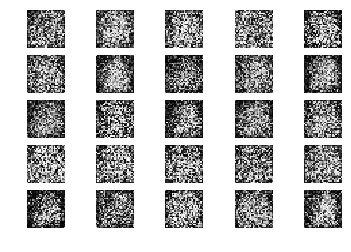

251 [D loss: 0.174648, acc.: 92.19%] [G loss: 3.487710]
252 [D loss: 0.303264, acc.: 85.94%] [G loss: 3.504455]
253 [D loss: 0.163223, acc.: 92.19%] [G loss: 4.115390]
254 [D loss: 0.119045, acc.: 96.88%] [G loss: 3.956928]
255 [D loss: 0.067525, acc.: 100.00%] [G loss: 3.873169]
256 [D loss: 0.203032, acc.: 92.19%] [G loss: 4.267967]
257 [D loss: 0.170368, acc.: 96.88%] [G loss: 3.933130]
258 [D loss: 0.185929, acc.: 92.19%] [G loss: 3.136441]
259 [D loss: 0.226330, acc.: 93.75%] [G loss: 3.708363]
260 [D loss: 0.311150, acc.: 85.94%] [G loss: 3.534562]
261 [D loss: 0.203018, acc.: 93.75%] [G loss: 3.832296]
262 [D loss: 0.350298, acc.: 82.81%] [G loss: 4.210848]
263 [D loss: 0.167785, acc.: 93.75%] [G loss: 3.853831]
264 [D loss: 0.412605, acc.: 71.88%] [G loss: 4.554477]
265 [D loss: 0.187264, acc.: 95.31%] [G loss: 4.263748]
266 [D loss: 0.381475, acc.: 79.69%] [G loss: 3.834914]
267 [D loss: 0.179393, acc.: 95.31%] [G loss: 3.638599]
268 [D loss: 0.064792, acc.: 98.44%] [G loss: 4

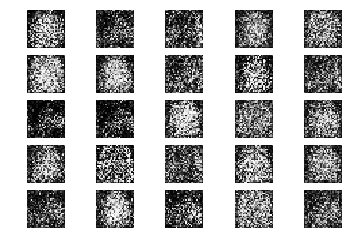

301 [D loss: 0.565892, acc.: 68.75%] [G loss: 3.155366]
302 [D loss: 0.347188, acc.: 89.06%] [G loss: 3.634909]
303 [D loss: 0.294231, acc.: 90.62%] [G loss: 2.835135]
304 [D loss: 0.324289, acc.: 81.25%] [G loss: 4.242046]
305 [D loss: 0.556253, acc.: 76.56%] [G loss: 3.407813]
306 [D loss: 0.405848, acc.: 84.38%] [G loss: 3.346362]
307 [D loss: 0.303172, acc.: 82.81%] [G loss: 4.249623]
308 [D loss: 0.341903, acc.: 90.62%] [G loss: 3.015966]
309 [D loss: 0.260502, acc.: 90.62%] [G loss: 3.231695]
310 [D loss: 0.606684, acc.: 70.31%] [G loss: 2.796209]
311 [D loss: 0.220616, acc.: 92.19%] [G loss: 3.609006]
312 [D loss: 0.365201, acc.: 90.62%] [G loss: 3.523932]
313 [D loss: 0.383433, acc.: 81.25%] [G loss: 3.276917]
314 [D loss: 0.171118, acc.: 92.19%] [G loss: 2.967445]
315 [D loss: 0.316833, acc.: 84.38%] [G loss: 2.755407]
316 [D loss: 0.173429, acc.: 93.75%] [G loss: 3.422264]
317 [D loss: 0.530355, acc.: 75.00%] [G loss: 2.559936]
318 [D loss: 0.383067, acc.: 85.94%] [G loss: 3.

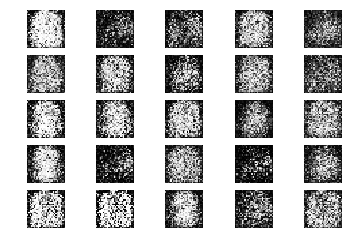

351 [D loss: 0.481875, acc.: 76.56%] [G loss: 2.531406]
352 [D loss: 0.606644, acc.: 81.25%] [G loss: 2.551629]
353 [D loss: 0.401707, acc.: 89.06%] [G loss: 2.394978]
354 [D loss: 0.399815, acc.: 85.94%] [G loss: 2.416465]
355 [D loss: 0.608118, acc.: 65.62%] [G loss: 2.286222]
356 [D loss: 0.312637, acc.: 93.75%] [G loss: 2.483654]
357 [D loss: 0.389919, acc.: 82.81%] [G loss: 2.358826]
358 [D loss: 0.470853, acc.: 82.81%] [G loss: 2.519548]
359 [D loss: 0.342586, acc.: 92.19%] [G loss: 2.983148]
360 [D loss: 0.546161, acc.: 76.56%] [G loss: 2.047858]
361 [D loss: 0.359885, acc.: 85.94%] [G loss: 2.206567]
362 [D loss: 0.517427, acc.: 73.44%] [G loss: 2.343133]
363 [D loss: 0.476007, acc.: 76.56%] [G loss: 2.561251]
364 [D loss: 0.455545, acc.: 78.12%] [G loss: 2.366014]
365 [D loss: 0.649138, acc.: 70.31%] [G loss: 2.284559]
366 [D loss: 0.404670, acc.: 75.00%] [G loss: 2.562214]
367 [D loss: 0.521359, acc.: 78.12%] [G loss: 2.234205]
368 [D loss: 0.427721, acc.: 79.69%] [G loss: 2.

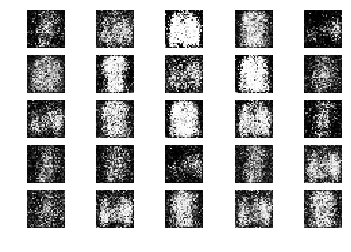

401 [D loss: 0.668757, acc.: 57.81%] [G loss: 1.759137]
402 [D loss: 0.676970, acc.: 71.88%] [G loss: 1.700923]
403 [D loss: 0.442027, acc.: 79.69%] [G loss: 1.960873]
404 [D loss: 0.658843, acc.: 64.06%] [G loss: 1.819005]
405 [D loss: 0.453684, acc.: 81.25%] [G loss: 1.915940]
406 [D loss: 0.489611, acc.: 73.44%] [G loss: 2.054081]
407 [D loss: 0.337394, acc.: 85.94%] [G loss: 2.470516]
408 [D loss: 0.733150, acc.: 65.62%] [G loss: 1.547290]
409 [D loss: 0.620951, acc.: 73.44%] [G loss: 1.790438]
410 [D loss: 0.760866, acc.: 54.69%] [G loss: 1.822793]
411 [D loss: 0.621321, acc.: 67.19%] [G loss: 1.875893]
412 [D loss: 0.544211, acc.: 71.88%] [G loss: 2.021770]
413 [D loss: 0.524149, acc.: 79.69%] [G loss: 2.020879]
414 [D loss: 0.742714, acc.: 67.19%] [G loss: 1.753151]
415 [D loss: 0.638737, acc.: 71.88%] [G loss: 1.517833]
416 [D loss: 0.424822, acc.: 81.25%] [G loss: 1.867322]
417 [D loss: 0.673137, acc.: 64.06%] [G loss: 1.637209]
418 [D loss: 0.572326, acc.: 75.00%] [G loss: 1.

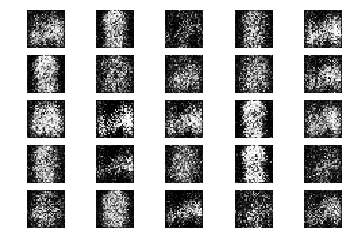

451 [D loss: 0.566174, acc.: 84.38%] [G loss: 1.501736]
452 [D loss: 0.576425, acc.: 73.44%] [G loss: 1.280113]
453 [D loss: 0.504790, acc.: 82.81%] [G loss: 1.268260]
454 [D loss: 0.618020, acc.: 71.88%] [G loss: 1.474064]
455 [D loss: 0.803534, acc.: 48.44%] [G loss: 1.383705]
456 [D loss: 0.561486, acc.: 73.44%] [G loss: 1.590807]
457 [D loss: 0.818747, acc.: 57.81%] [G loss: 1.221397]
458 [D loss: 0.610068, acc.: 64.06%] [G loss: 1.532368]
459 [D loss: 0.765164, acc.: 60.94%] [G loss: 1.226140]
460 [D loss: 0.569394, acc.: 75.00%] [G loss: 1.460065]
461 [D loss: 0.560594, acc.: 71.88%] [G loss: 1.574898]
462 [D loss: 0.763801, acc.: 65.62%] [G loss: 1.289590]
463 [D loss: 0.580696, acc.: 70.31%] [G loss: 1.412398]
464 [D loss: 0.650766, acc.: 65.62%] [G loss: 1.548749]
465 [D loss: 0.625158, acc.: 71.88%] [G loss: 1.267589]
466 [D loss: 0.514479, acc.: 73.44%] [G loss: 1.402074]
467 [D loss: 0.520137, acc.: 76.56%] [G loss: 1.398651]
468 [D loss: 0.623846, acc.: 70.31%] [G loss: 1.

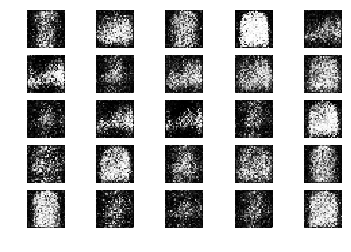

501 [D loss: 0.628008, acc.: 65.62%] [G loss: 1.200394]
502 [D loss: 0.615767, acc.: 67.19%] [G loss: 1.192120]
503 [D loss: 0.537230, acc.: 79.69%] [G loss: 1.279209]
504 [D loss: 0.725751, acc.: 54.69%] [G loss: 1.019328]
505 [D loss: 0.549640, acc.: 76.56%] [G loss: 1.097538]
506 [D loss: 0.636917, acc.: 57.81%] [G loss: 1.205602]
507 [D loss: 0.616217, acc.: 68.75%] [G loss: 0.997685]
508 [D loss: 0.587079, acc.: 70.31%] [G loss: 1.115398]
509 [D loss: 0.527987, acc.: 76.56%] [G loss: 1.245340]
510 [D loss: 0.609502, acc.: 67.19%] [G loss: 1.411896]
511 [D loss: 0.604781, acc.: 68.75%] [G loss: 1.147396]
512 [D loss: 0.771149, acc.: 64.06%] [G loss: 1.080240]
513 [D loss: 0.574079, acc.: 67.19%] [G loss: 1.161068]
514 [D loss: 0.714926, acc.: 68.75%] [G loss: 1.075486]
515 [D loss: 0.611274, acc.: 71.88%] [G loss: 1.012299]
516 [D loss: 0.614780, acc.: 62.50%] [G loss: 1.020382]
517 [D loss: 0.553717, acc.: 84.38%] [G loss: 1.164752]
518 [D loss: 0.586517, acc.: 62.50%] [G loss: 1.

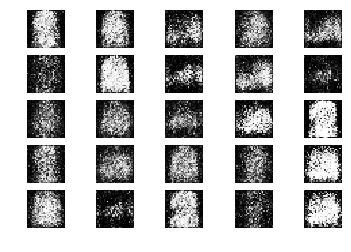

551 [D loss: 0.499622, acc.: 78.12%] [G loss: 1.280051]
552 [D loss: 0.582191, acc.: 76.56%] [G loss: 1.219852]
553 [D loss: 0.611562, acc.: 67.19%] [G loss: 1.085166]
554 [D loss: 0.596418, acc.: 71.88%] [G loss: 1.158902]
555 [D loss: 0.547570, acc.: 70.31%] [G loss: 1.210695]
556 [D loss: 0.529230, acc.: 71.88%] [G loss: 1.301906]
557 [D loss: 0.613894, acc.: 73.44%] [G loss: 1.211344]
558 [D loss: 0.611142, acc.: 65.62%] [G loss: 1.174345]
559 [D loss: 0.639313, acc.: 67.19%] [G loss: 1.161329]
560 [D loss: 0.618238, acc.: 60.94%] [G loss: 1.224892]
561 [D loss: 0.646026, acc.: 64.06%] [G loss: 1.022598]
562 [D loss: 0.677245, acc.: 64.06%] [G loss: 0.913175]
563 [D loss: 0.593841, acc.: 62.50%] [G loss: 0.979861]
564 [D loss: 0.692698, acc.: 62.50%] [G loss: 0.976154]
565 [D loss: 0.562565, acc.: 67.19%] [G loss: 1.060284]
566 [D loss: 0.608617, acc.: 62.50%] [G loss: 1.090199]
567 [D loss: 0.600746, acc.: 64.06%] [G loss: 1.068344]
568 [D loss: 0.693430, acc.: 64.06%] [G loss: 1.

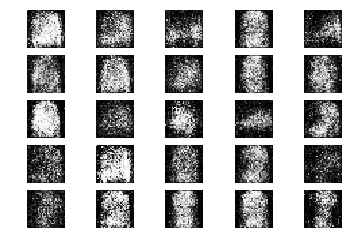

601 [D loss: 0.688769, acc.: 62.50%] [G loss: 1.101124]
602 [D loss: 0.615159, acc.: 64.06%] [G loss: 0.966544]
603 [D loss: 0.625327, acc.: 68.75%] [G loss: 0.941089]
604 [D loss: 0.647774, acc.: 59.38%] [G loss: 1.000532]
605 [D loss: 0.573865, acc.: 68.75%] [G loss: 1.143239]
606 [D loss: 0.607076, acc.: 75.00%] [G loss: 1.184564]
607 [D loss: 0.694699, acc.: 62.50%] [G loss: 1.059791]
608 [D loss: 0.652015, acc.: 65.62%] [G loss: 0.970629]
609 [D loss: 0.618603, acc.: 70.31%] [G loss: 1.025947]
610 [D loss: 0.687662, acc.: 62.50%] [G loss: 1.092949]
611 [D loss: 0.546333, acc.: 78.12%] [G loss: 1.047742]
612 [D loss: 0.652321, acc.: 67.19%] [G loss: 0.977017]
613 [D loss: 0.575364, acc.: 70.31%] [G loss: 1.030133]
614 [D loss: 0.643156, acc.: 75.00%] [G loss: 1.041350]
615 [D loss: 0.628273, acc.: 68.75%] [G loss: 0.939607]
616 [D loss: 0.590412, acc.: 75.00%] [G loss: 1.085743]
617 [D loss: 0.570674, acc.: 71.88%] [G loss: 1.112362]
618 [D loss: 0.636797, acc.: 62.50%] [G loss: 1.

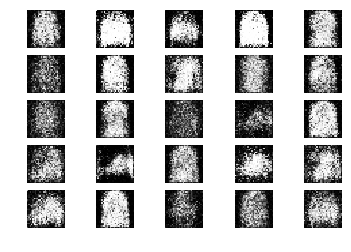

651 [D loss: 0.556099, acc.: 70.31%] [G loss: 0.994699]
652 [D loss: 0.651303, acc.: 64.06%] [G loss: 0.983020]
653 [D loss: 0.588820, acc.: 67.19%] [G loss: 1.041267]
654 [D loss: 0.682124, acc.: 60.94%] [G loss: 1.061078]
655 [D loss: 0.543022, acc.: 81.25%] [G loss: 1.086197]
656 [D loss: 0.706037, acc.: 56.25%] [G loss: 0.985586]
657 [D loss: 0.701466, acc.: 56.25%] [G loss: 0.978341]
658 [D loss: 0.616706, acc.: 70.31%] [G loss: 0.993598]
659 [D loss: 0.611572, acc.: 71.88%] [G loss: 0.948685]
660 [D loss: 0.643817, acc.: 60.94%] [G loss: 0.935752]
661 [D loss: 0.642962, acc.: 67.19%] [G loss: 0.923208]
662 [D loss: 0.620146, acc.: 70.31%] [G loss: 0.994536]
663 [D loss: 0.539001, acc.: 71.88%] [G loss: 0.964655]
664 [D loss: 0.646415, acc.: 59.38%] [G loss: 1.085958]
665 [D loss: 0.594393, acc.: 65.62%] [G loss: 1.011223]
666 [D loss: 0.630017, acc.: 62.50%] [G loss: 0.936794]
667 [D loss: 0.684414, acc.: 59.38%] [G loss: 1.136010]
668 [D loss: 0.561727, acc.: 70.31%] [G loss: 1.

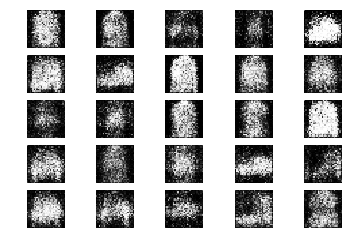

701 [D loss: 0.585499, acc.: 70.31%] [G loss: 0.939988]
702 [D loss: 0.651603, acc.: 67.19%] [G loss: 0.927302]
703 [D loss: 0.655009, acc.: 59.38%] [G loss: 0.936125]
704 [D loss: 0.610204, acc.: 68.75%] [G loss: 0.980119]
705 [D loss: 0.618584, acc.: 67.19%] [G loss: 1.060274]
706 [D loss: 0.648484, acc.: 56.25%] [G loss: 0.909786]
707 [D loss: 0.588642, acc.: 71.88%] [G loss: 1.018998]
708 [D loss: 0.552682, acc.: 76.56%] [G loss: 0.964088]
709 [D loss: 0.564749, acc.: 76.56%] [G loss: 0.924632]
710 [D loss: 0.552098, acc.: 76.56%] [G loss: 0.968012]
711 [D loss: 0.512347, acc.: 79.69%] [G loss: 1.136811]
712 [D loss: 0.640585, acc.: 62.50%] [G loss: 1.005993]
713 [D loss: 0.506296, acc.: 78.12%] [G loss: 1.078358]
714 [D loss: 0.620980, acc.: 67.19%] [G loss: 1.092986]
715 [D loss: 0.646639, acc.: 67.19%] [G loss: 1.142711]
716 [D loss: 0.653225, acc.: 57.81%] [G loss: 1.029152]
717 [D loss: 0.637895, acc.: 62.50%] [G loss: 0.937957]
718 [D loss: 0.623576, acc.: 65.62%] [G loss: 0.

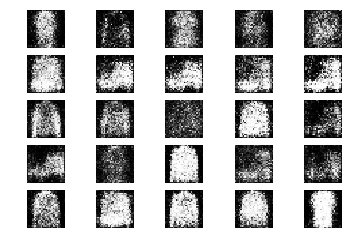

751 [D loss: 0.538804, acc.: 81.25%] [G loss: 0.928865]
752 [D loss: 0.637651, acc.: 67.19%] [G loss: 0.891326]
753 [D loss: 0.583049, acc.: 67.19%] [G loss: 0.945686]
754 [D loss: 0.598701, acc.: 68.75%] [G loss: 0.912055]
755 [D loss: 0.565773, acc.: 68.75%] [G loss: 1.028338]
756 [D loss: 0.567679, acc.: 71.88%] [G loss: 0.979353]
757 [D loss: 0.584478, acc.: 70.31%] [G loss: 0.990135]
758 [D loss: 0.511301, acc.: 82.81%] [G loss: 1.190803]
759 [D loss: 0.504857, acc.: 71.88%] [G loss: 1.053376]
760 [D loss: 0.632681, acc.: 62.50%] [G loss: 1.068921]
761 [D loss: 0.690221, acc.: 54.69%] [G loss: 1.110437]
762 [D loss: 0.545597, acc.: 71.88%] [G loss: 1.063824]
763 [D loss: 0.593682, acc.: 65.62%] [G loss: 1.026838]
764 [D loss: 0.598029, acc.: 59.38%] [G loss: 1.034485]
765 [D loss: 0.631958, acc.: 64.06%] [G loss: 0.928916]
766 [D loss: 0.581803, acc.: 73.44%] [G loss: 0.982393]
767 [D loss: 0.558101, acc.: 76.56%] [G loss: 0.979358]
768 [D loss: 0.527435, acc.: 82.81%] [G loss: 1.

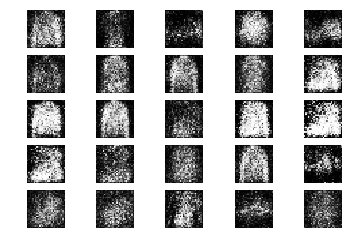

801 [D loss: 0.535697, acc.: 76.56%] [G loss: 1.006969]
802 [D loss: 0.631578, acc.: 57.81%] [G loss: 0.971711]
803 [D loss: 0.596290, acc.: 65.62%] [G loss: 0.944378]
804 [D loss: 0.548745, acc.: 76.56%] [G loss: 1.004579]
805 [D loss: 0.585703, acc.: 71.88%] [G loss: 0.988421]
806 [D loss: 0.631969, acc.: 60.94%] [G loss: 1.024779]
807 [D loss: 0.599185, acc.: 71.88%] [G loss: 0.990941]
808 [D loss: 0.629753, acc.: 60.94%] [G loss: 1.003094]
809 [D loss: 0.614589, acc.: 67.19%] [G loss: 1.000731]
810 [D loss: 0.590842, acc.: 67.19%] [G loss: 0.999247]
811 [D loss: 0.636993, acc.: 75.00%] [G loss: 0.940743]
812 [D loss: 0.572693, acc.: 71.88%] [G loss: 0.997247]
813 [D loss: 0.547049, acc.: 71.88%] [G loss: 0.974947]
814 [D loss: 0.560524, acc.: 68.75%] [G loss: 1.068098]
815 [D loss: 0.588427, acc.: 76.56%] [G loss: 1.083225]
816 [D loss: 0.502600, acc.: 76.56%] [G loss: 1.071786]
817 [D loss: 0.568619, acc.: 68.75%] [G loss: 1.103681]
818 [D loss: 0.581972, acc.: 65.62%] [G loss: 0.

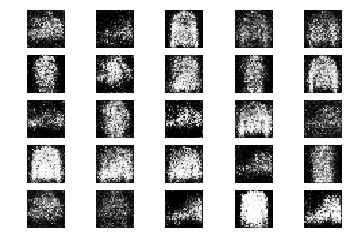

851 [D loss: 0.528715, acc.: 73.44%] [G loss: 0.928201]
852 [D loss: 0.575194, acc.: 73.44%] [G loss: 0.971823]
853 [D loss: 0.611083, acc.: 59.38%] [G loss: 0.939373]
854 [D loss: 0.557286, acc.: 75.00%] [G loss: 0.949757]
855 [D loss: 0.504424, acc.: 84.38%] [G loss: 1.013072]
856 [D loss: 0.565745, acc.: 71.88%] [G loss: 0.958761]
857 [D loss: 0.483941, acc.: 81.25%] [G loss: 0.991366]
858 [D loss: 0.578500, acc.: 73.44%] [G loss: 0.948724]
859 [D loss: 0.550982, acc.: 70.31%] [G loss: 1.007612]
860 [D loss: 0.535003, acc.: 76.56%] [G loss: 1.039994]
861 [D loss: 0.667264, acc.: 57.81%] [G loss: 1.010870]
862 [D loss: 0.617249, acc.: 65.62%] [G loss: 1.129207]
863 [D loss: 0.642214, acc.: 64.06%] [G loss: 0.959379]
864 [D loss: 0.552093, acc.: 70.31%] [G loss: 1.065604]
865 [D loss: 0.553313, acc.: 68.75%] [G loss: 0.952007]
866 [D loss: 0.610430, acc.: 71.88%] [G loss: 0.995916]
867 [D loss: 0.554397, acc.: 70.31%] [G loss: 1.021536]
868 [D loss: 0.604070, acc.: 64.06%] [G loss: 0.

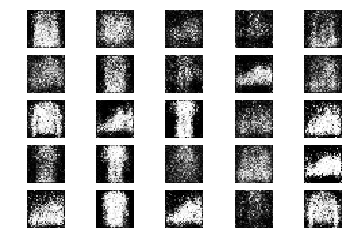

901 [D loss: 0.590737, acc.: 71.88%] [G loss: 0.966924]
902 [D loss: 0.602378, acc.: 68.75%] [G loss: 1.022787]
903 [D loss: 0.539501, acc.: 73.44%] [G loss: 0.986001]
904 [D loss: 0.599787, acc.: 70.31%] [G loss: 0.973596]
905 [D loss: 0.580977, acc.: 64.06%] [G loss: 0.985890]
906 [D loss: 0.615274, acc.: 65.62%] [G loss: 0.934665]
907 [D loss: 0.591926, acc.: 70.31%] [G loss: 1.092842]
908 [D loss: 0.548628, acc.: 75.00%] [G loss: 1.011089]
909 [D loss: 0.585205, acc.: 71.88%] [G loss: 1.031342]
910 [D loss: 0.652159, acc.: 56.25%] [G loss: 0.988885]
911 [D loss: 0.530255, acc.: 79.69%] [G loss: 1.000921]
912 [D loss: 0.600240, acc.: 65.62%] [G loss: 0.974757]
913 [D loss: 0.550161, acc.: 73.44%] [G loss: 0.938152]
914 [D loss: 0.560844, acc.: 75.00%] [G loss: 1.009769]
915 [D loss: 0.606214, acc.: 71.88%] [G loss: 1.149805]
916 [D loss: 0.585701, acc.: 64.06%] [G loss: 1.123952]
917 [D loss: 0.601490, acc.: 68.75%] [G loss: 1.099879]
918 [D loss: 0.551169, acc.: 75.00%] [G loss: 1.

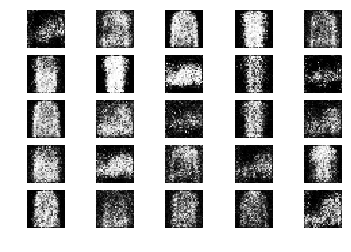

951 [D loss: 0.587422, acc.: 70.31%] [G loss: 0.935966]
952 [D loss: 0.537580, acc.: 71.88%] [G loss: 1.043453]
953 [D loss: 0.612962, acc.: 67.19%] [G loss: 1.069287]
954 [D loss: 0.582794, acc.: 67.19%] [G loss: 0.971833]
955 [D loss: 0.643034, acc.: 68.75%] [G loss: 0.927615]
956 [D loss: 0.663343, acc.: 64.06%] [G loss: 0.972059]
957 [D loss: 0.540059, acc.: 75.00%] [G loss: 1.057431]
958 [D loss: 0.586837, acc.: 70.31%] [G loss: 0.885316]
959 [D loss: 0.597709, acc.: 67.19%] [G loss: 0.944189]
960 [D loss: 0.694234, acc.: 62.50%] [G loss: 0.898182]
961 [D loss: 0.610829, acc.: 65.62%] [G loss: 0.977756]
962 [D loss: 0.670596, acc.: 62.50%] [G loss: 0.910457]
963 [D loss: 0.645093, acc.: 59.38%] [G loss: 0.994259]
964 [D loss: 0.620787, acc.: 70.31%] [G loss: 0.969663]
965 [D loss: 0.657661, acc.: 60.94%] [G loss: 0.984069]
966 [D loss: 0.544351, acc.: 79.69%] [G loss: 1.016666]
967 [D loss: 0.603669, acc.: 65.62%] [G loss: 1.035281]
968 [D loss: 0.608620, acc.: 65.62%] [G loss: 0.

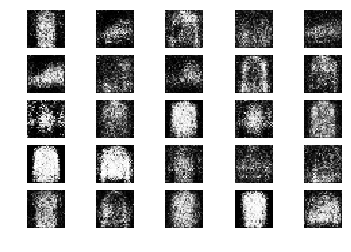

1001 [D loss: 0.643398, acc.: 64.06%] [G loss: 0.789591]
1002 [D loss: 0.613055, acc.: 62.50%] [G loss: 0.915050]
1003 [D loss: 0.539399, acc.: 78.12%] [G loss: 0.860939]
1004 [D loss: 0.568984, acc.: 71.88%] [G loss: 0.990435]
1005 [D loss: 0.585618, acc.: 70.31%] [G loss: 1.080061]
1006 [D loss: 0.651323, acc.: 65.62%] [G loss: 0.992018]
1007 [D loss: 0.609324, acc.: 64.06%] [G loss: 0.956984]
1008 [D loss: 0.618777, acc.: 70.31%] [G loss: 0.992801]
1009 [D loss: 0.632045, acc.: 57.81%] [G loss: 0.991101]
1010 [D loss: 0.664106, acc.: 57.81%] [G loss: 0.940121]
1011 [D loss: 0.634310, acc.: 67.19%] [G loss: 0.923891]
1012 [D loss: 0.529067, acc.: 71.88%] [G loss: 1.042161]
1013 [D loss: 0.687606, acc.: 67.19%] [G loss: 0.960431]
1014 [D loss: 0.643429, acc.: 56.25%] [G loss: 1.001738]
1015 [D loss: 0.564021, acc.: 71.88%] [G loss: 1.009502]
1016 [D loss: 0.657560, acc.: 68.75%] [G loss: 0.942034]
1017 [D loss: 0.561024, acc.: 68.75%] [G loss: 0.894184]
1018 [D loss: 0.578774, acc.: 7

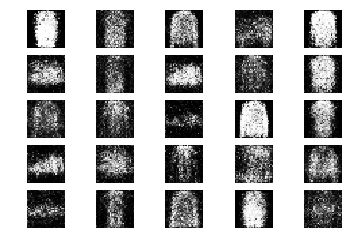

1051 [D loss: 0.608294, acc.: 68.75%] [G loss: 0.932331]
1052 [D loss: 0.682741, acc.: 54.69%] [G loss: 0.900468]
1053 [D loss: 0.645943, acc.: 60.94%] [G loss: 0.918990]
1054 [D loss: 0.535513, acc.: 81.25%] [G loss: 1.067804]
1055 [D loss: 0.665517, acc.: 62.50%] [G loss: 0.884224]
1056 [D loss: 0.675450, acc.: 59.38%] [G loss: 0.888819]
1057 [D loss: 0.567251, acc.: 70.31%] [G loss: 0.963129]
1058 [D loss: 0.647705, acc.: 57.81%] [G loss: 0.908367]
1059 [D loss: 0.589341, acc.: 70.31%] [G loss: 0.997399]
1060 [D loss: 0.585999, acc.: 68.75%] [G loss: 0.965813]
1061 [D loss: 0.654046, acc.: 57.81%] [G loss: 0.947127]
1062 [D loss: 0.655609, acc.: 64.06%] [G loss: 1.002024]
1063 [D loss: 0.647689, acc.: 64.06%] [G loss: 0.884413]
1064 [D loss: 0.598465, acc.: 70.31%] [G loss: 0.863213]
1065 [D loss: 0.659343, acc.: 65.62%] [G loss: 0.912359]
1066 [D loss: 0.626618, acc.: 67.19%] [G loss: 0.900195]
1067 [D loss: 0.649821, acc.: 59.38%] [G loss: 0.866750]
1068 [D loss: 0.618921, acc.: 6

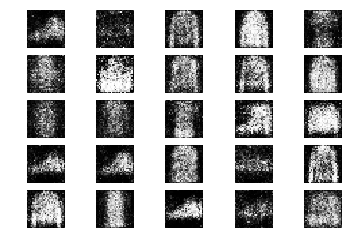

1101 [D loss: 0.576654, acc.: 64.06%] [G loss: 0.967867]
1102 [D loss: 0.555548, acc.: 71.88%] [G loss: 1.003309]
1103 [D loss: 0.541185, acc.: 71.88%] [G loss: 0.996099]
1104 [D loss: 0.609612, acc.: 62.50%] [G loss: 0.935492]
1105 [D loss: 0.618823, acc.: 62.50%] [G loss: 1.041645]
1106 [D loss: 0.616488, acc.: 64.06%] [G loss: 0.914146]
1107 [D loss: 0.699229, acc.: 57.81%] [G loss: 0.928578]
1108 [D loss: 0.569439, acc.: 73.44%] [G loss: 0.976913]
1109 [D loss: 0.652061, acc.: 65.62%] [G loss: 1.010086]
1110 [D loss: 0.651066, acc.: 62.50%] [G loss: 0.932705]
1111 [D loss: 0.616123, acc.: 60.94%] [G loss: 0.860232]
1112 [D loss: 0.588449, acc.: 67.19%] [G loss: 0.889797]
1113 [D loss: 0.655501, acc.: 54.69%] [G loss: 0.993913]
1114 [D loss: 0.628768, acc.: 59.38%] [G loss: 0.971978]
1115 [D loss: 0.634901, acc.: 57.81%] [G loss: 1.056045]
1116 [D loss: 0.621589, acc.: 65.62%] [G loss: 0.959911]
1117 [D loss: 0.690768, acc.: 56.25%] [G loss: 0.935515]
1118 [D loss: 0.593663, acc.: 7

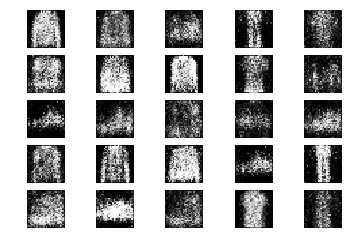

1151 [D loss: 0.647253, acc.: 60.94%] [G loss: 0.944356]
1152 [D loss: 0.583107, acc.: 71.88%] [G loss: 0.943682]
1153 [D loss: 0.602888, acc.: 65.62%] [G loss: 0.932775]
1154 [D loss: 0.542008, acc.: 78.12%] [G loss: 0.962757]
1155 [D loss: 0.731088, acc.: 60.94%] [G loss: 1.009075]
1156 [D loss: 0.626100, acc.: 67.19%] [G loss: 0.974792]
1157 [D loss: 0.607889, acc.: 62.50%] [G loss: 0.977050]
1158 [D loss: 0.653142, acc.: 67.19%] [G loss: 0.909704]
1159 [D loss: 0.630010, acc.: 65.62%] [G loss: 0.989482]
1160 [D loss: 0.670343, acc.: 62.50%] [G loss: 0.992866]
1161 [D loss: 0.576728, acc.: 78.12%] [G loss: 0.942075]
1162 [D loss: 0.666757, acc.: 62.50%] [G loss: 0.874953]
1163 [D loss: 0.611752, acc.: 65.62%] [G loss: 0.902546]
1164 [D loss: 0.654860, acc.: 54.69%] [G loss: 0.986604]
1165 [D loss: 0.607219, acc.: 67.19%] [G loss: 0.963915]
1166 [D loss: 0.659386, acc.: 56.25%] [G loss: 0.928150]
1167 [D loss: 0.594560, acc.: 68.75%] [G loss: 0.955923]
1168 [D loss: 0.580975, acc.: 6

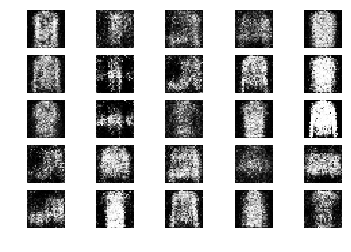

1201 [D loss: 0.604361, acc.: 70.31%] [G loss: 0.958251]
1202 [D loss: 0.617433, acc.: 70.31%] [G loss: 0.998800]
1203 [D loss: 0.578866, acc.: 68.75%] [G loss: 1.052193]
1204 [D loss: 0.673323, acc.: 59.38%] [G loss: 0.903213]
1205 [D loss: 0.629711, acc.: 62.50%] [G loss: 0.951783]
1206 [D loss: 0.639329, acc.: 54.69%] [G loss: 0.865448]
1207 [D loss: 0.688307, acc.: 56.25%] [G loss: 0.974828]
1208 [D loss: 0.584850, acc.: 65.62%] [G loss: 0.907167]
1209 [D loss: 0.604692, acc.: 71.88%] [G loss: 0.965925]
1210 [D loss: 0.597915, acc.: 67.19%] [G loss: 0.953235]
1211 [D loss: 0.655350, acc.: 60.94%] [G loss: 0.889839]
1212 [D loss: 0.641841, acc.: 59.38%] [G loss: 0.882880]
1213 [D loss: 0.647315, acc.: 62.50%] [G loss: 0.883220]
1214 [D loss: 0.630373, acc.: 67.19%] [G loss: 0.940411]
1215 [D loss: 0.725454, acc.: 48.44%] [G loss: 0.820129]
1216 [D loss: 0.651626, acc.: 62.50%] [G loss: 0.939812]
1217 [D loss: 0.689126, acc.: 60.94%] [G loss: 0.859393]
1218 [D loss: 0.598390, acc.: 7

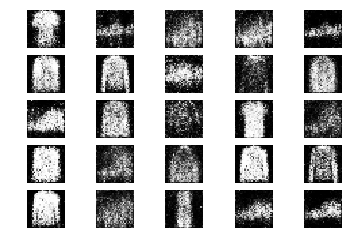

1251 [D loss: 0.648302, acc.: 59.38%] [G loss: 0.925950]
1252 [D loss: 0.605727, acc.: 68.75%] [G loss: 0.931449]
1253 [D loss: 0.632424, acc.: 62.50%] [G loss: 0.925823]
1254 [D loss: 0.650793, acc.: 56.25%] [G loss: 0.881150]
1255 [D loss: 0.627001, acc.: 64.06%] [G loss: 0.985005]
1256 [D loss: 0.564651, acc.: 67.19%] [G loss: 0.922436]
1257 [D loss: 0.587411, acc.: 71.88%] [G loss: 0.893534]
1258 [D loss: 0.594237, acc.: 68.75%] [G loss: 0.930275]
1259 [D loss: 0.596032, acc.: 71.88%] [G loss: 0.908907]
1260 [D loss: 0.534185, acc.: 73.44%] [G loss: 1.007798]
1261 [D loss: 0.609600, acc.: 67.19%] [G loss: 0.979022]
1262 [D loss: 0.557413, acc.: 68.75%] [G loss: 0.926394]
1263 [D loss: 0.647412, acc.: 71.88%] [G loss: 1.020284]
1264 [D loss: 0.650611, acc.: 57.81%] [G loss: 0.944865]
1265 [D loss: 0.610531, acc.: 62.50%] [G loss: 0.896201]
1266 [D loss: 0.591154, acc.: 71.88%] [G loss: 0.995649]
1267 [D loss: 0.567335, acc.: 75.00%] [G loss: 0.900720]
1268 [D loss: 0.699506, acc.: 5

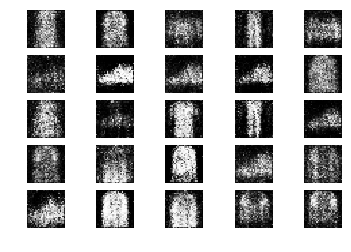

1301 [D loss: 0.571470, acc.: 73.44%] [G loss: 0.911147]
1302 [D loss: 0.595569, acc.: 73.44%] [G loss: 0.919608]
1303 [D loss: 0.590867, acc.: 68.75%] [G loss: 0.945617]
1304 [D loss: 0.598901, acc.: 78.12%] [G loss: 0.954303]
1305 [D loss: 0.580296, acc.: 70.31%] [G loss: 0.924021]
1306 [D loss: 0.673119, acc.: 57.81%] [G loss: 0.863890]
1307 [D loss: 0.580793, acc.: 65.62%] [G loss: 0.956915]
1308 [D loss: 0.662575, acc.: 65.62%] [G loss: 0.879089]
1309 [D loss: 0.674716, acc.: 59.38%] [G loss: 0.924101]
1310 [D loss: 0.703251, acc.: 54.69%] [G loss: 0.951166]
1311 [D loss: 0.650504, acc.: 54.69%] [G loss: 0.893871]
1312 [D loss: 0.645038, acc.: 62.50%] [G loss: 0.878291]
1313 [D loss: 0.657514, acc.: 65.62%] [G loss: 0.950961]
1314 [D loss: 0.595168, acc.: 65.62%] [G loss: 0.944984]
1315 [D loss: 0.582085, acc.: 68.75%] [G loss: 0.906496]
1316 [D loss: 0.604757, acc.: 64.06%] [G loss: 0.938377]
1317 [D loss: 0.631342, acc.: 64.06%] [G loss: 0.870229]
1318 [D loss: 0.644486, acc.: 5

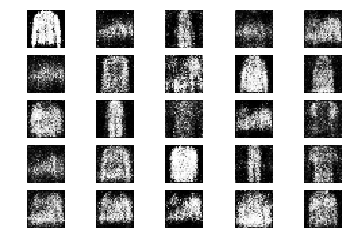

1351 [D loss: 0.643991, acc.: 64.06%] [G loss: 0.963388]
1352 [D loss: 0.640680, acc.: 70.31%] [G loss: 0.941243]
1353 [D loss: 0.592167, acc.: 70.31%] [G loss: 0.911069]
1354 [D loss: 0.689441, acc.: 51.56%] [G loss: 0.881868]
1355 [D loss: 0.626579, acc.: 68.75%] [G loss: 0.939332]
1356 [D loss: 0.534210, acc.: 81.25%] [G loss: 0.970909]
1357 [D loss: 0.779950, acc.: 50.00%] [G loss: 0.884636]
1358 [D loss: 0.527839, acc.: 85.94%] [G loss: 0.949646]
1359 [D loss: 0.648137, acc.: 59.38%] [G loss: 0.942804]
1360 [D loss: 0.526204, acc.: 78.12%] [G loss: 0.880469]
1361 [D loss: 0.588025, acc.: 70.31%] [G loss: 0.855340]
1362 [D loss: 0.633651, acc.: 56.25%] [G loss: 0.936552]
1363 [D loss: 0.636355, acc.: 60.94%] [G loss: 0.941851]
1364 [D loss: 0.664026, acc.: 54.69%] [G loss: 0.857568]
1365 [D loss: 0.560323, acc.: 71.88%] [G loss: 0.916227]
1366 [D loss: 0.584590, acc.: 78.12%] [G loss: 0.977460]
1367 [D loss: 0.622509, acc.: 64.06%] [G loss: 0.884904]
1368 [D loss: 0.617338, acc.: 6

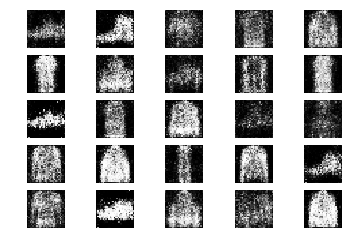

1401 [D loss: 0.580797, acc.: 75.00%] [G loss: 0.981356]
1402 [D loss: 0.607983, acc.: 70.31%] [G loss: 0.963915]
1403 [D loss: 0.654389, acc.: 60.94%] [G loss: 0.874820]
1404 [D loss: 0.641831, acc.: 60.94%] [G loss: 0.880951]
1405 [D loss: 0.626188, acc.: 70.31%] [G loss: 0.894525]
1406 [D loss: 0.647708, acc.: 60.94%] [G loss: 0.936510]
1407 [D loss: 0.606547, acc.: 68.75%] [G loss: 0.914921]
1408 [D loss: 0.541049, acc.: 71.88%] [G loss: 0.972813]
1409 [D loss: 0.570853, acc.: 67.19%] [G loss: 0.917120]
1410 [D loss: 0.635346, acc.: 57.81%] [G loss: 0.864524]
1411 [D loss: 0.586072, acc.: 64.06%] [G loss: 0.963204]
1412 [D loss: 0.523721, acc.: 75.00%] [G loss: 0.953300]
1413 [D loss: 0.664062, acc.: 60.94%] [G loss: 0.948580]
1414 [D loss: 0.644270, acc.: 56.25%] [G loss: 0.889987]
1415 [D loss: 0.649486, acc.: 57.81%] [G loss: 0.917601]
1416 [D loss: 0.614791, acc.: 67.19%] [G loss: 0.817818]
1417 [D loss: 0.608022, acc.: 70.31%] [G loss: 0.841605]
1418 [D loss: 0.617736, acc.: 6

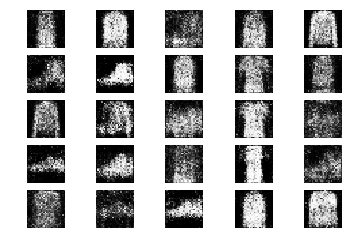

1451 [D loss: 0.589577, acc.: 73.44%] [G loss: 0.887602]
1452 [D loss: 0.601379, acc.: 68.75%] [G loss: 0.947559]
1453 [D loss: 0.599546, acc.: 68.75%] [G loss: 0.852827]
1454 [D loss: 0.629866, acc.: 60.94%] [G loss: 0.860419]
1455 [D loss: 0.586113, acc.: 70.31%] [G loss: 0.929048]
1456 [D loss: 0.684783, acc.: 57.81%] [G loss: 0.997443]
1457 [D loss: 0.547350, acc.: 70.31%] [G loss: 1.033159]
1458 [D loss: 0.604167, acc.: 70.31%] [G loss: 0.933767]
1459 [D loss: 0.621804, acc.: 67.19%] [G loss: 0.870433]
1460 [D loss: 0.610563, acc.: 70.31%] [G loss: 0.785638]
1461 [D loss: 0.622017, acc.: 68.75%] [G loss: 0.979358]
1462 [D loss: 0.565787, acc.: 76.56%] [G loss: 0.966178]
1463 [D loss: 0.644793, acc.: 65.62%] [G loss: 0.877116]
1464 [D loss: 0.641230, acc.: 70.31%] [G loss: 0.929348]
1465 [D loss: 0.594236, acc.: 65.62%] [G loss: 0.897210]
1466 [D loss: 0.686118, acc.: 59.38%] [G loss: 0.911471]
1467 [D loss: 0.617126, acc.: 67.19%] [G loss: 0.900725]
1468 [D loss: 0.565314, acc.: 7

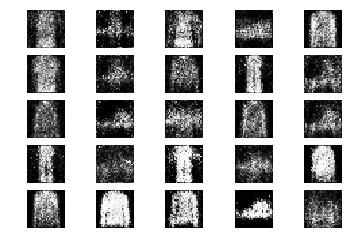

1501 [D loss: 0.623246, acc.: 65.62%] [G loss: 0.928178]
1502 [D loss: 0.536596, acc.: 78.12%] [G loss: 0.853847]
1503 [D loss: 0.612385, acc.: 68.75%] [G loss: 0.968915]
1504 [D loss: 0.591496, acc.: 64.06%] [G loss: 0.980111]
1505 [D loss: 0.597438, acc.: 73.44%] [G loss: 0.857667]
1506 [D loss: 0.665869, acc.: 57.81%] [G loss: 0.920692]
1507 [D loss: 0.635232, acc.: 64.06%] [G loss: 1.011068]
1508 [D loss: 0.701048, acc.: 53.12%] [G loss: 0.950452]
1509 [D loss: 0.567789, acc.: 76.56%] [G loss: 1.016164]
1510 [D loss: 0.616377, acc.: 65.62%] [G loss: 0.967376]
1511 [D loss: 0.569203, acc.: 67.19%] [G loss: 0.889398]
1512 [D loss: 0.660353, acc.: 56.25%] [G loss: 0.897570]
1513 [D loss: 0.602998, acc.: 68.75%] [G loss: 0.827270]
1514 [D loss: 0.625053, acc.: 62.50%] [G loss: 0.810678]
1515 [D loss: 0.653246, acc.: 60.94%] [G loss: 0.910631]
1516 [D loss: 0.622707, acc.: 62.50%] [G loss: 0.928723]
1517 [D loss: 0.617001, acc.: 62.50%] [G loss: 0.917471]
1518 [D loss: 0.678040, acc.: 5

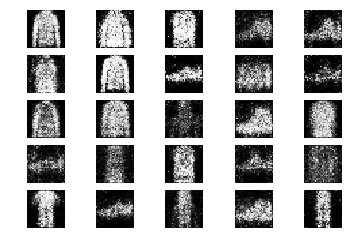

1551 [D loss: 0.576647, acc.: 68.75%] [G loss: 0.926265]
1552 [D loss: 0.564749, acc.: 65.62%] [G loss: 1.038023]
1553 [D loss: 0.619298, acc.: 62.50%] [G loss: 1.027600]
1554 [D loss: 0.560870, acc.: 71.88%] [G loss: 0.978707]
1555 [D loss: 0.649786, acc.: 56.25%] [G loss: 0.894086]
1556 [D loss: 0.607930, acc.: 67.19%] [G loss: 0.950380]
1557 [D loss: 0.603617, acc.: 65.62%] [G loss: 0.900983]
1558 [D loss: 0.649889, acc.: 71.88%] [G loss: 0.965517]
1559 [D loss: 0.637623, acc.: 62.50%] [G loss: 1.016038]
1560 [D loss: 0.552807, acc.: 76.56%] [G loss: 0.924594]
1561 [D loss: 0.649015, acc.: 65.62%] [G loss: 0.821297]
1562 [D loss: 0.617408, acc.: 64.06%] [G loss: 0.867725]
1563 [D loss: 0.607307, acc.: 68.75%] [G loss: 0.851388]
1564 [D loss: 0.639129, acc.: 57.81%] [G loss: 0.843503]
1565 [D loss: 0.649734, acc.: 60.94%] [G loss: 0.927202]
1566 [D loss: 0.637136, acc.: 62.50%] [G loss: 0.968951]
1567 [D loss: 0.579813, acc.: 68.75%] [G loss: 0.874953]
1568 [D loss: 0.612325, acc.: 7

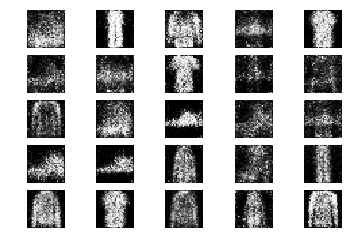

1601 [D loss: 0.569355, acc.: 71.88%] [G loss: 0.962920]
1602 [D loss: 0.593829, acc.: 75.00%] [G loss: 0.926963]
1603 [D loss: 0.618002, acc.: 71.88%] [G loss: 0.937499]
1604 [D loss: 0.604240, acc.: 67.19%] [G loss: 0.908517]
1605 [D loss: 0.627317, acc.: 76.56%] [G loss: 0.810282]
1606 [D loss: 0.630000, acc.: 59.38%] [G loss: 0.862568]
1607 [D loss: 0.566623, acc.: 71.88%] [G loss: 0.917308]
1608 [D loss: 0.619242, acc.: 59.38%] [G loss: 0.958197]
1609 [D loss: 0.662007, acc.: 60.94%] [G loss: 0.886274]
1610 [D loss: 0.662200, acc.: 60.94%] [G loss: 0.968033]
1611 [D loss: 0.610283, acc.: 68.75%] [G loss: 1.035696]
1612 [D loss: 0.590595, acc.: 67.19%] [G loss: 0.814901]
1613 [D loss: 0.635689, acc.: 73.44%] [G loss: 0.930593]
1614 [D loss: 0.616576, acc.: 73.44%] [G loss: 0.905980]
1615 [D loss: 0.562745, acc.: 71.88%] [G loss: 0.936863]
1616 [D loss: 0.605136, acc.: 73.44%] [G loss: 0.937961]
1617 [D loss: 0.562813, acc.: 75.00%] [G loss: 0.883288]
1618 [D loss: 0.627830, acc.: 6

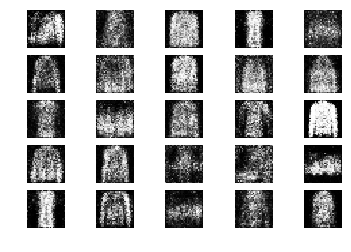

1651 [D loss: 0.604906, acc.: 68.75%] [G loss: 0.878100]
1652 [D loss: 0.514581, acc.: 73.44%] [G loss: 0.932242]
1653 [D loss: 0.561439, acc.: 75.00%] [G loss: 0.952365]
1654 [D loss: 0.624627, acc.: 60.94%] [G loss: 0.948188]
1655 [D loss: 0.611051, acc.: 65.62%] [G loss: 0.875259]
1656 [D loss: 0.559254, acc.: 71.88%] [G loss: 1.002372]
1657 [D loss: 0.595960, acc.: 68.75%] [G loss: 0.870157]
1658 [D loss: 0.587806, acc.: 71.88%] [G loss: 0.806189]
1659 [D loss: 0.640822, acc.: 62.50%] [G loss: 0.954521]
1660 [D loss: 0.613006, acc.: 64.06%] [G loss: 0.938377]
1661 [D loss: 0.599755, acc.: 60.94%] [G loss: 0.913691]
1662 [D loss: 0.653198, acc.: 57.81%] [G loss: 0.960736]
1663 [D loss: 0.531168, acc.: 82.81%] [G loss: 0.944019]
1664 [D loss: 0.584216, acc.: 70.31%] [G loss: 0.978321]
1665 [D loss: 0.637589, acc.: 68.75%] [G loss: 0.920345]
1666 [D loss: 0.635944, acc.: 60.94%] [G loss: 0.979487]
1667 [D loss: 0.641757, acc.: 64.06%] [G loss: 0.966425]
1668 [D loss: 0.581673, acc.: 6

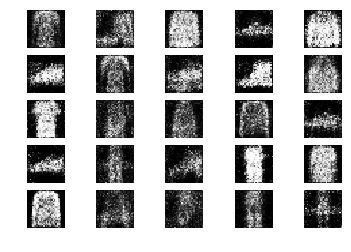

1701 [D loss: 0.594745, acc.: 67.19%] [G loss: 0.898178]
1702 [D loss: 0.588000, acc.: 68.75%] [G loss: 0.931785]
1703 [D loss: 0.532380, acc.: 71.88%] [G loss: 0.893353]
1704 [D loss: 0.617845, acc.: 56.25%] [G loss: 0.971708]
1705 [D loss: 0.588377, acc.: 71.88%] [G loss: 0.935782]
1706 [D loss: 0.630777, acc.: 64.06%] [G loss: 0.914472]
1707 [D loss: 0.650578, acc.: 56.25%] [G loss: 0.899905]
1708 [D loss: 0.570699, acc.: 70.31%] [G loss: 0.889283]
1709 [D loss: 0.594221, acc.: 75.00%] [G loss: 0.928831]
1710 [D loss: 0.645096, acc.: 62.50%] [G loss: 0.920553]
1711 [D loss: 0.612595, acc.: 62.50%] [G loss: 0.890319]
1712 [D loss: 0.603208, acc.: 68.75%] [G loss: 0.970160]
1713 [D loss: 0.646408, acc.: 60.94%] [G loss: 0.921500]
1714 [D loss: 0.562283, acc.: 73.44%] [G loss: 0.960636]
1715 [D loss: 0.586076, acc.: 71.88%] [G loss: 0.922422]
1716 [D loss: 0.659353, acc.: 54.69%] [G loss: 0.919086]
1717 [D loss: 0.610556, acc.: 65.62%] [G loss: 0.841677]
1718 [D loss: 0.590446, acc.: 7

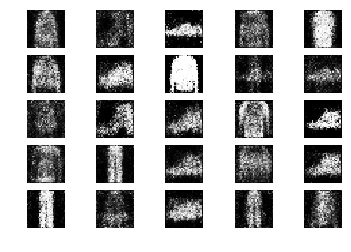

1751 [D loss: 0.565539, acc.: 70.31%] [G loss: 1.063492]
1752 [D loss: 0.614417, acc.: 70.31%] [G loss: 0.994034]
1753 [D loss: 0.610954, acc.: 73.44%] [G loss: 0.922058]
1754 [D loss: 0.577973, acc.: 71.88%] [G loss: 1.006287]
1755 [D loss: 0.616837, acc.: 65.62%] [G loss: 0.941534]
1756 [D loss: 0.632507, acc.: 67.19%] [G loss: 0.933564]
1757 [D loss: 0.591818, acc.: 67.19%] [G loss: 0.875770]
1758 [D loss: 0.577905, acc.: 70.31%] [G loss: 0.907175]
1759 [D loss: 0.569825, acc.: 64.06%] [G loss: 0.953522]
1760 [D loss: 0.655260, acc.: 65.62%] [G loss: 0.835830]
1761 [D loss: 0.564804, acc.: 68.75%] [G loss: 0.845060]
1762 [D loss: 0.589298, acc.: 71.88%] [G loss: 0.980921]
1763 [D loss: 0.635415, acc.: 64.06%] [G loss: 1.140439]
1764 [D loss: 0.565066, acc.: 75.00%] [G loss: 0.940142]
1765 [D loss: 0.537056, acc.: 75.00%] [G loss: 0.984108]
1766 [D loss: 0.623569, acc.: 67.19%] [G loss: 0.997177]
1767 [D loss: 0.701528, acc.: 51.56%] [G loss: 0.939538]
1768 [D loss: 0.644581, acc.: 5

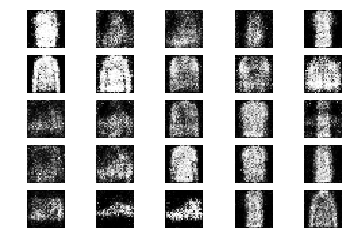

1801 [D loss: 0.600904, acc.: 68.75%] [G loss: 0.911731]
1802 [D loss: 0.657045, acc.: 59.38%] [G loss: 0.969237]
1803 [D loss: 0.614823, acc.: 67.19%] [G loss: 0.891954]
1804 [D loss: 0.613781, acc.: 68.75%] [G loss: 1.012814]
1805 [D loss: 0.605419, acc.: 60.94%] [G loss: 0.911367]
1806 [D loss: 0.583689, acc.: 70.31%] [G loss: 0.890397]
1807 [D loss: 0.607833, acc.: 70.31%] [G loss: 0.932655]
1808 [D loss: 0.572875, acc.: 75.00%] [G loss: 0.954180]
1809 [D loss: 0.657350, acc.: 56.25%] [G loss: 0.914575]
1810 [D loss: 0.613805, acc.: 62.50%] [G loss: 0.922828]
1811 [D loss: 0.611562, acc.: 68.75%] [G loss: 0.920947]
1812 [D loss: 0.600257, acc.: 65.62%] [G loss: 0.897340]
1813 [D loss: 0.668035, acc.: 59.38%] [G loss: 0.981572]
1814 [D loss: 0.626064, acc.: 64.06%] [G loss: 0.951141]
1815 [D loss: 0.585401, acc.: 68.75%] [G loss: 0.908640]
1816 [D loss: 0.629117, acc.: 65.62%] [G loss: 0.971252]
1817 [D loss: 0.613170, acc.: 64.06%] [G loss: 1.016999]
1818 [D loss: 0.581347, acc.: 7

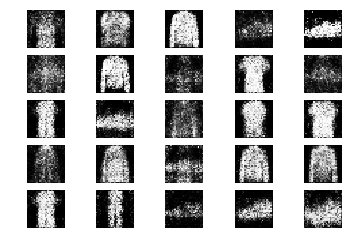

1851 [D loss: 0.674234, acc.: 56.25%] [G loss: 0.962999]
1852 [D loss: 0.590534, acc.: 65.62%] [G loss: 0.909925]
1853 [D loss: 0.592807, acc.: 73.44%] [G loss: 0.856781]
1854 [D loss: 0.619277, acc.: 64.06%] [G loss: 0.837698]
1855 [D loss: 0.657027, acc.: 62.50%] [G loss: 0.910140]
1856 [D loss: 0.611298, acc.: 65.62%] [G loss: 1.006220]
1857 [D loss: 0.576298, acc.: 71.88%] [G loss: 0.924909]
1858 [D loss: 0.683213, acc.: 51.56%] [G loss: 1.046551]
1859 [D loss: 0.600550, acc.: 68.75%] [G loss: 0.985382]
1860 [D loss: 0.593628, acc.: 71.88%] [G loss: 0.947176]
1861 [D loss: 0.567849, acc.: 70.31%] [G loss: 0.918673]
1862 [D loss: 0.628032, acc.: 70.31%] [G loss: 1.065743]
1863 [D loss: 0.594007, acc.: 65.62%] [G loss: 0.964527]
1864 [D loss: 0.586620, acc.: 68.75%] [G loss: 0.877862]
1865 [D loss: 0.680243, acc.: 68.75%] [G loss: 0.911706]
1866 [D loss: 0.576889, acc.: 73.44%] [G loss: 0.850734]
1867 [D loss: 0.583465, acc.: 76.56%] [G loss: 0.995490]
1868 [D loss: 0.550268, acc.: 7

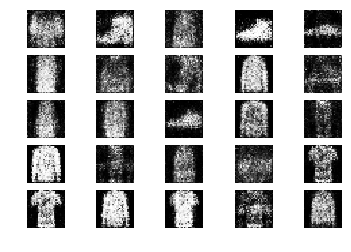

1901 [D loss: 0.614996, acc.: 67.19%] [G loss: 1.005345]
1902 [D loss: 0.587413, acc.: 71.88%] [G loss: 1.036615]
1903 [D loss: 0.597853, acc.: 64.06%] [G loss: 0.961379]
1904 [D loss: 0.550012, acc.: 68.75%] [G loss: 0.984322]
1905 [D loss: 0.621500, acc.: 57.81%] [G loss: 1.003637]
1906 [D loss: 0.668704, acc.: 62.50%] [G loss: 0.986111]
1907 [D loss: 0.643328, acc.: 60.94%] [G loss: 0.939741]
1908 [D loss: 0.595465, acc.: 60.94%] [G loss: 0.975878]
1909 [D loss: 0.558469, acc.: 75.00%] [G loss: 0.881818]
1910 [D loss: 0.555488, acc.: 71.88%] [G loss: 0.908092]
1911 [D loss: 0.620033, acc.: 60.94%] [G loss: 0.898679]
1912 [D loss: 0.562390, acc.: 73.44%] [G loss: 0.952326]
1913 [D loss: 0.524010, acc.: 71.88%] [G loss: 1.061698]
1914 [D loss: 0.645353, acc.: 62.50%] [G loss: 0.885476]
1915 [D loss: 0.620781, acc.: 60.94%] [G loss: 0.927022]
1916 [D loss: 0.626812, acc.: 68.75%] [G loss: 0.974013]
1917 [D loss: 0.521332, acc.: 76.56%] [G loss: 0.987879]
1918 [D loss: 0.598502, acc.: 6

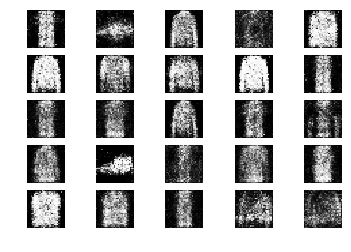

1951 [D loss: 0.584220, acc.: 76.56%] [G loss: 0.890991]
1952 [D loss: 0.668502, acc.: 59.38%] [G loss: 0.908982]
1953 [D loss: 0.603066, acc.: 64.06%] [G loss: 0.861013]
1954 [D loss: 0.626679, acc.: 67.19%] [G loss: 0.873243]
1955 [D loss: 0.645521, acc.: 56.25%] [G loss: 0.935329]
1956 [D loss: 0.636994, acc.: 67.19%] [G loss: 0.967275]
1957 [D loss: 0.621467, acc.: 68.75%] [G loss: 1.010801]
1958 [D loss: 0.589077, acc.: 67.19%] [G loss: 1.090355]
1959 [D loss: 0.568947, acc.: 65.62%] [G loss: 1.089693]
1960 [D loss: 0.599580, acc.: 68.75%] [G loss: 0.916715]
1961 [D loss: 0.617538, acc.: 64.06%] [G loss: 1.010403]
1962 [D loss: 0.625908, acc.: 65.62%] [G loss: 0.986637]
1963 [D loss: 0.598279, acc.: 71.88%] [G loss: 0.938771]
1964 [D loss: 0.638481, acc.: 57.81%] [G loss: 1.014432]
1965 [D loss: 0.633229, acc.: 54.69%] [G loss: 0.983160]
1966 [D loss: 0.589238, acc.: 67.19%] [G loss: 0.920991]
1967 [D loss: 0.670120, acc.: 50.00%] [G loss: 0.982272]
1968 [D loss: 0.568889, acc.: 7

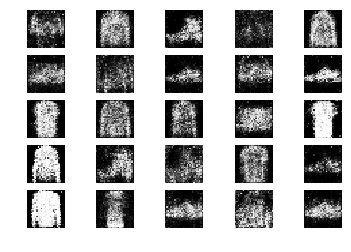

2001 [D loss: 0.621876, acc.: 57.81%] [G loss: 0.913280]
2002 [D loss: 0.589134, acc.: 64.06%] [G loss: 0.909050]
2003 [D loss: 0.585131, acc.: 68.75%] [G loss: 0.964680]
2004 [D loss: 0.587440, acc.: 73.44%] [G loss: 0.849421]
2005 [D loss: 0.632240, acc.: 70.31%] [G loss: 0.938134]
2006 [D loss: 0.571389, acc.: 75.00%] [G loss: 1.045144]
2007 [D loss: 0.630123, acc.: 64.06%] [G loss: 0.962518]
2008 [D loss: 0.649295, acc.: 67.19%] [G loss: 0.889345]
2009 [D loss: 0.609114, acc.: 68.75%] [G loss: 0.882237]
2010 [D loss: 0.621849, acc.: 67.19%] [G loss: 0.960394]
2011 [D loss: 0.624893, acc.: 64.06%] [G loss: 1.030887]
2012 [D loss: 0.629676, acc.: 62.50%] [G loss: 0.851816]
2013 [D loss: 0.639948, acc.: 62.50%] [G loss: 0.922902]
2014 [D loss: 0.592937, acc.: 65.62%] [G loss: 0.860225]
2015 [D loss: 0.677390, acc.: 56.25%] [G loss: 0.797283]
2016 [D loss: 0.646606, acc.: 62.50%] [G loss: 0.825565]
2017 [D loss: 0.588347, acc.: 73.44%] [G loss: 0.948871]
2018 [D loss: 0.688933, acc.: 5

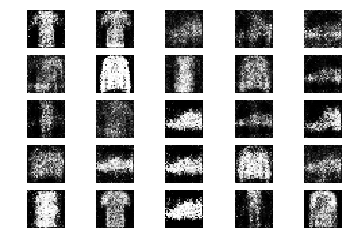

2051 [D loss: 0.581700, acc.: 65.62%] [G loss: 0.868482]
2052 [D loss: 0.603422, acc.: 62.50%] [G loss: 1.034761]
2053 [D loss: 0.648735, acc.: 64.06%] [G loss: 0.898062]
2054 [D loss: 0.609530, acc.: 59.38%] [G loss: 1.111051]
2055 [D loss: 0.582933, acc.: 68.75%] [G loss: 0.924755]
2056 [D loss: 0.625133, acc.: 65.62%] [G loss: 0.945196]
2057 [D loss: 0.590603, acc.: 73.44%] [G loss: 0.887908]
2058 [D loss: 0.647918, acc.: 62.50%] [G loss: 0.859548]
2059 [D loss: 0.585408, acc.: 68.75%] [G loss: 0.810769]
2060 [D loss: 0.627649, acc.: 57.81%] [G loss: 0.820726]
2061 [D loss: 0.663229, acc.: 68.75%] [G loss: 0.960489]
2062 [D loss: 0.575713, acc.: 64.06%] [G loss: 0.894070]
2063 [D loss: 0.661340, acc.: 64.06%] [G loss: 0.959986]
2064 [D loss: 0.595086, acc.: 65.62%] [G loss: 1.069961]
2065 [D loss: 0.631040, acc.: 68.75%] [G loss: 0.859505]
2066 [D loss: 0.677199, acc.: 59.38%] [G loss: 1.013002]
2067 [D loss: 0.627365, acc.: 65.62%] [G loss: 0.974067]
2068 [D loss: 0.585699, acc.: 6

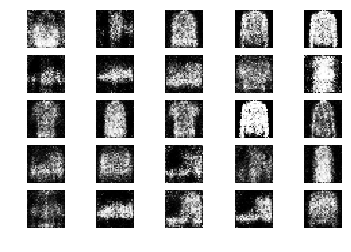

2101 [D loss: 0.624299, acc.: 65.62%] [G loss: 0.869515]
2102 [D loss: 0.598374, acc.: 67.19%] [G loss: 0.950546]
2103 [D loss: 0.608785, acc.: 68.75%] [G loss: 0.931357]
2104 [D loss: 0.595179, acc.: 62.50%] [G loss: 0.871815]
2105 [D loss: 0.598363, acc.: 68.75%] [G loss: 0.897696]
2106 [D loss: 0.594932, acc.: 71.88%] [G loss: 0.918961]
2107 [D loss: 0.584655, acc.: 73.44%] [G loss: 0.885768]
2108 [D loss: 0.587052, acc.: 68.75%] [G loss: 0.899738]
2109 [D loss: 0.607034, acc.: 67.19%] [G loss: 0.851584]
2110 [D loss: 0.593135, acc.: 70.31%] [G loss: 0.931228]
2111 [D loss: 0.602152, acc.: 65.62%] [G loss: 0.856725]
2112 [D loss: 0.572724, acc.: 64.06%] [G loss: 0.965507]
2113 [D loss: 0.640572, acc.: 57.81%] [G loss: 0.865206]
2114 [D loss: 0.578373, acc.: 67.19%] [G loss: 0.911656]
2115 [D loss: 0.514906, acc.: 76.56%] [G loss: 1.029010]
2116 [D loss: 0.669458, acc.: 57.81%] [G loss: 0.977035]
2117 [D loss: 0.578905, acc.: 67.19%] [G loss: 0.968956]
2118 [D loss: 0.615491, acc.: 6

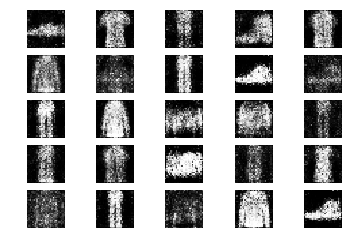

2151 [D loss: 0.572487, acc.: 76.56%] [G loss: 0.849077]
2152 [D loss: 0.580231, acc.: 62.50%] [G loss: 0.871888]
2153 [D loss: 0.633095, acc.: 70.31%] [G loss: 0.909658]
2154 [D loss: 0.550569, acc.: 78.12%] [G loss: 1.006953]
2155 [D loss: 0.648159, acc.: 57.81%] [G loss: 0.924876]
2156 [D loss: 0.651947, acc.: 62.50%] [G loss: 0.900909]
2157 [D loss: 0.668870, acc.: 51.56%] [G loss: 0.958681]
2158 [D loss: 0.566604, acc.: 71.88%] [G loss: 0.964543]
2159 [D loss: 0.724393, acc.: 50.00%] [G loss: 0.969357]
2160 [D loss: 0.632747, acc.: 60.94%] [G loss: 0.952270]
2161 [D loss: 0.639724, acc.: 65.62%] [G loss: 1.011367]
2162 [D loss: 0.586534, acc.: 68.75%] [G loss: 0.936624]
2163 [D loss: 0.629980, acc.: 60.94%] [G loss: 0.904765]
2164 [D loss: 0.573956, acc.: 67.19%] [G loss: 0.929090]
2165 [D loss: 0.555698, acc.: 70.31%] [G loss: 0.964347]
2166 [D loss: 0.592973, acc.: 65.62%] [G loss: 0.978423]
2167 [D loss: 0.689343, acc.: 64.06%] [G loss: 0.904002]
2168 [D loss: 0.579979, acc.: 6

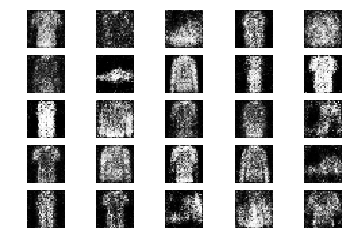

2201 [D loss: 0.552427, acc.: 71.88%] [G loss: 0.899582]
2202 [D loss: 0.640514, acc.: 59.38%] [G loss: 0.979822]
2203 [D loss: 0.668605, acc.: 60.94%] [G loss: 0.883212]
2204 [D loss: 0.685343, acc.: 59.38%] [G loss: 1.033498]
2205 [D loss: 0.584551, acc.: 62.50%] [G loss: 0.882615]
2206 [D loss: 0.651184, acc.: 57.81%] [G loss: 0.873329]
2207 [D loss: 0.661217, acc.: 59.38%] [G loss: 0.894400]
2208 [D loss: 0.688789, acc.: 56.25%] [G loss: 0.937411]
2209 [D loss: 0.597993, acc.: 65.62%] [G loss: 0.955253]
2210 [D loss: 0.633635, acc.: 62.50%] [G loss: 0.807468]
2211 [D loss: 0.610521, acc.: 70.31%] [G loss: 0.854027]
2212 [D loss: 0.696865, acc.: 57.81%] [G loss: 0.855055]
2213 [D loss: 0.646847, acc.: 65.62%] [G loss: 0.856855]
2214 [D loss: 0.646492, acc.: 60.94%] [G loss: 0.867736]
2215 [D loss: 0.624630, acc.: 70.31%] [G loss: 0.885907]
2216 [D loss: 0.585804, acc.: 70.31%] [G loss: 1.051691]
2217 [D loss: 0.585612, acc.: 73.44%] [G loss: 1.004418]
2218 [D loss: 0.699511, acc.: 4

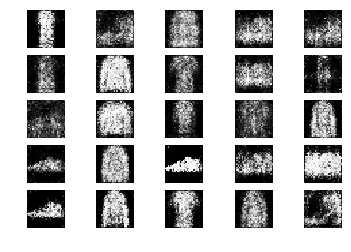

2251 [D loss: 0.663114, acc.: 65.62%] [G loss: 0.990431]
2252 [D loss: 0.658309, acc.: 68.75%] [G loss: 0.908977]
2253 [D loss: 0.596931, acc.: 75.00%] [G loss: 1.004534]
2254 [D loss: 0.504083, acc.: 76.56%] [G loss: 0.957039]
2255 [D loss: 0.610828, acc.: 62.50%] [G loss: 0.953658]
2256 [D loss: 0.540413, acc.: 78.12%] [G loss: 1.012326]
2257 [D loss: 0.625328, acc.: 64.06%] [G loss: 1.099407]
2258 [D loss: 0.664544, acc.: 57.81%] [G loss: 0.960286]
2259 [D loss: 0.604578, acc.: 65.62%] [G loss: 0.929668]
2260 [D loss: 0.649909, acc.: 67.19%] [G loss: 0.988661]
2261 [D loss: 0.629479, acc.: 64.06%] [G loss: 0.979715]
2262 [D loss: 0.641633, acc.: 62.50%] [G loss: 0.875519]
2263 [D loss: 0.633910, acc.: 60.94%] [G loss: 0.914192]
2264 [D loss: 0.598063, acc.: 65.62%] [G loss: 0.883937]
2265 [D loss: 0.593979, acc.: 67.19%] [G loss: 0.873993]
2266 [D loss: 0.633342, acc.: 64.06%] [G loss: 0.874971]
2267 [D loss: 0.596703, acc.: 64.06%] [G loss: 0.867050]
2268 [D loss: 0.566917, acc.: 6

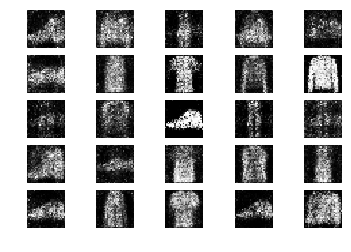

2301 [D loss: 0.617508, acc.: 60.94%] [G loss: 0.929778]
2302 [D loss: 0.593287, acc.: 67.19%] [G loss: 0.994144]
2303 [D loss: 0.619234, acc.: 64.06%] [G loss: 0.966112]
2304 [D loss: 0.663304, acc.: 51.56%] [G loss: 1.067534]
2305 [D loss: 0.561933, acc.: 75.00%] [G loss: 0.968628]
2306 [D loss: 0.603335, acc.: 70.31%] [G loss: 1.035630]
2307 [D loss: 0.736946, acc.: 45.31%] [G loss: 0.901291]
2308 [D loss: 0.642936, acc.: 64.06%] [G loss: 0.885534]
2309 [D loss: 0.541550, acc.: 75.00%] [G loss: 0.953208]
2310 [D loss: 0.640840, acc.: 65.62%] [G loss: 0.905437]
2311 [D loss: 0.614717, acc.: 67.19%] [G loss: 0.906310]
2312 [D loss: 0.611647, acc.: 65.62%] [G loss: 0.908678]
2313 [D loss: 0.608052, acc.: 67.19%] [G loss: 0.947924]
2314 [D loss: 0.794167, acc.: 37.50%] [G loss: 0.866662]
2315 [D loss: 0.647356, acc.: 62.50%] [G loss: 0.860864]
2316 [D loss: 0.628716, acc.: 60.94%] [G loss: 0.841000]
2317 [D loss: 0.609690, acc.: 65.62%] [G loss: 0.905705]
2318 [D loss: 0.576291, acc.: 7

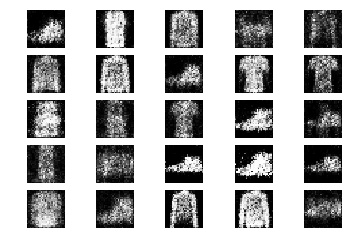

2351 [D loss: 0.675364, acc.: 57.81%] [G loss: 0.992618]
2352 [D loss: 0.600654, acc.: 67.19%] [G loss: 0.900091]
2353 [D loss: 0.639211, acc.: 67.19%] [G loss: 0.898064]
2354 [D loss: 0.571584, acc.: 65.62%] [G loss: 0.891525]
2355 [D loss: 0.627200, acc.: 62.50%] [G loss: 0.887647]
2356 [D loss: 0.651118, acc.: 59.38%] [G loss: 0.995945]
2357 [D loss: 0.543583, acc.: 75.00%] [G loss: 1.055216]
2358 [D loss: 0.638956, acc.: 70.31%] [G loss: 0.948107]
2359 [D loss: 0.625160, acc.: 64.06%] [G loss: 0.830173]
2360 [D loss: 0.642594, acc.: 62.50%] [G loss: 0.929324]
2361 [D loss: 0.632981, acc.: 62.50%] [G loss: 1.052687]
2362 [D loss: 0.668093, acc.: 64.06%] [G loss: 0.891189]
2363 [D loss: 0.658005, acc.: 60.94%] [G loss: 0.911879]
2364 [D loss: 0.613617, acc.: 65.62%] [G loss: 0.924927]
2365 [D loss: 0.704108, acc.: 56.25%] [G loss: 0.952220]
2366 [D loss: 0.610315, acc.: 67.19%] [G loss: 0.968898]
2367 [D loss: 0.588271, acc.: 67.19%] [G loss: 0.910726]
2368 [D loss: 0.632230, acc.: 6

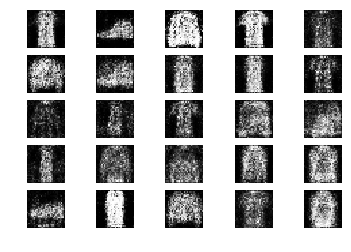

2401 [D loss: 0.625745, acc.: 62.50%] [G loss: 0.905319]
2402 [D loss: 0.593587, acc.: 68.75%] [G loss: 0.933357]
2403 [D loss: 0.618413, acc.: 60.94%] [G loss: 0.950259]
2404 [D loss: 0.597177, acc.: 67.19%] [G loss: 0.902993]
2405 [D loss: 0.622878, acc.: 64.06%] [G loss: 1.012558]
2406 [D loss: 0.606770, acc.: 67.19%] [G loss: 0.869710]
2407 [D loss: 0.615327, acc.: 65.62%] [G loss: 0.858618]
2408 [D loss: 0.642914, acc.: 68.75%] [G loss: 0.876432]
2409 [D loss: 0.612303, acc.: 56.25%] [G loss: 1.107454]
2410 [D loss: 0.662925, acc.: 67.19%] [G loss: 1.166905]
2411 [D loss: 0.645108, acc.: 60.94%] [G loss: 1.039595]
2412 [D loss: 0.618500, acc.: 65.62%] [G loss: 0.974018]
2413 [D loss: 0.575714, acc.: 67.19%] [G loss: 0.874645]
2414 [D loss: 0.595497, acc.: 68.75%] [G loss: 0.931432]
2415 [D loss: 0.648164, acc.: 60.94%] [G loss: 0.854301]
2416 [D loss: 0.595627, acc.: 62.50%] [G loss: 0.961010]
2417 [D loss: 0.625894, acc.: 73.44%] [G loss: 1.034300]
2418 [D loss: 0.646197, acc.: 5

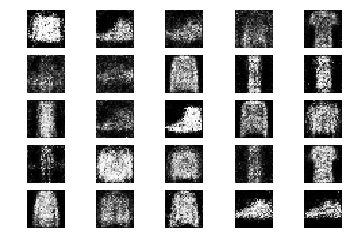

2451 [D loss: 0.616480, acc.: 62.50%] [G loss: 0.936528]
2452 [D loss: 0.568222, acc.: 67.19%] [G loss: 0.993487]
2453 [D loss: 0.618101, acc.: 64.06%] [G loss: 0.872609]
2454 [D loss: 0.645347, acc.: 57.81%] [G loss: 0.908116]
2455 [D loss: 0.617166, acc.: 64.06%] [G loss: 0.920702]
2456 [D loss: 0.636537, acc.: 64.06%] [G loss: 0.886032]
2457 [D loss: 0.657958, acc.: 62.50%] [G loss: 0.940148]
2458 [D loss: 0.562386, acc.: 68.75%] [G loss: 0.882687]
2459 [D loss: 0.679874, acc.: 51.56%] [G loss: 0.908000]
2460 [D loss: 0.597961, acc.: 62.50%] [G loss: 0.856775]
2461 [D loss: 0.544958, acc.: 75.00%] [G loss: 0.894615]
2462 [D loss: 0.654550, acc.: 59.38%] [G loss: 1.053150]
2463 [D loss: 0.675154, acc.: 59.38%] [G loss: 0.982983]
2464 [D loss: 0.584293, acc.: 71.88%] [G loss: 0.946250]
2465 [D loss: 0.636033, acc.: 57.81%] [G loss: 0.885914]
2466 [D loss: 0.694605, acc.: 56.25%] [G loss: 0.875889]
2467 [D loss: 0.610586, acc.: 70.31%] [G loss: 1.004241]
2468 [D loss: 0.652505, acc.: 6

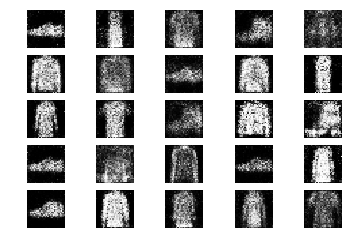

2501 [D loss: 0.622718, acc.: 67.19%] [G loss: 0.925125]
2502 [D loss: 0.633830, acc.: 67.19%] [G loss: 0.911424]
2503 [D loss: 0.613051, acc.: 71.88%] [G loss: 0.958878]
2504 [D loss: 0.594313, acc.: 67.19%] [G loss: 0.870355]
2505 [D loss: 0.627140, acc.: 59.38%] [G loss: 0.932385]
2506 [D loss: 0.654823, acc.: 57.81%] [G loss: 0.895272]
2507 [D loss: 0.580457, acc.: 62.50%] [G loss: 0.847908]
2508 [D loss: 0.643453, acc.: 62.50%] [G loss: 0.876114]
2509 [D loss: 0.650683, acc.: 59.38%] [G loss: 0.946093]
2510 [D loss: 0.642560, acc.: 64.06%] [G loss: 0.888755]
2511 [D loss: 0.637761, acc.: 64.06%] [G loss: 1.036045]
2512 [D loss: 0.637895, acc.: 57.81%] [G loss: 0.956104]
2513 [D loss: 0.599740, acc.: 68.75%] [G loss: 0.997388]
2514 [D loss: 0.579969, acc.: 70.31%] [G loss: 0.957125]
2515 [D loss: 0.694208, acc.: 48.44%] [G loss: 0.892179]
2516 [D loss: 0.598047, acc.: 62.50%] [G loss: 0.951776]
2517 [D loss: 0.624910, acc.: 68.75%] [G loss: 0.948649]
2518 [D loss: 0.652522, acc.: 5

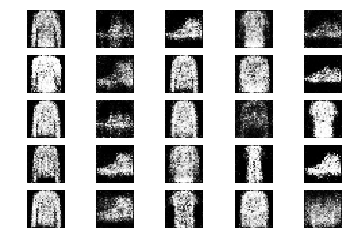

2551 [D loss: 0.642334, acc.: 67.19%] [G loss: 0.866811]
2552 [D loss: 0.650863, acc.: 60.94%] [G loss: 0.946778]
2553 [D loss: 0.638055, acc.: 64.06%] [G loss: 1.004584]
2554 [D loss: 0.578865, acc.: 73.44%] [G loss: 1.000278]
2555 [D loss: 0.579473, acc.: 65.62%] [G loss: 0.951217]
2556 [D loss: 0.657883, acc.: 56.25%] [G loss: 0.950212]
2557 [D loss: 0.616699, acc.: 65.62%] [G loss: 0.905848]
2558 [D loss: 0.672351, acc.: 54.69%] [G loss: 1.054323]
2559 [D loss: 0.605253, acc.: 67.19%] [G loss: 0.911372]
2560 [D loss: 0.689022, acc.: 54.69%] [G loss: 0.890586]
2561 [D loss: 0.636730, acc.: 67.19%] [G loss: 0.898763]
2562 [D loss: 0.627325, acc.: 64.06%] [G loss: 0.981385]
2563 [D loss: 0.630406, acc.: 62.50%] [G loss: 0.964848]
2564 [D loss: 0.617720, acc.: 65.62%] [G loss: 0.981258]
2565 [D loss: 0.642134, acc.: 67.19%] [G loss: 0.931520]
2566 [D loss: 0.627919, acc.: 65.62%] [G loss: 0.879473]
2567 [D loss: 0.643878, acc.: 57.81%] [G loss: 0.958401]
2568 [D loss: 0.641888, acc.: 5

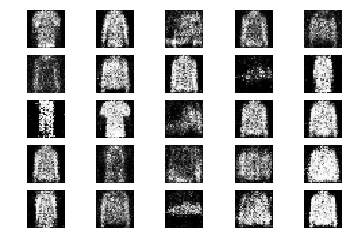

2601 [D loss: 0.643391, acc.: 62.50%] [G loss: 0.990849]
2602 [D loss: 0.535761, acc.: 75.00%] [G loss: 0.938388]
2603 [D loss: 0.594804, acc.: 67.19%] [G loss: 1.044739]
2604 [D loss: 0.569685, acc.: 71.88%] [G loss: 1.029777]
2605 [D loss: 0.626133, acc.: 59.38%] [G loss: 1.029107]
2606 [D loss: 0.677231, acc.: 54.69%] [G loss: 0.912155]
2607 [D loss: 0.620493, acc.: 57.81%] [G loss: 1.013228]
2608 [D loss: 0.628019, acc.: 62.50%] [G loss: 0.932577]
2609 [D loss: 0.603230, acc.: 62.50%] [G loss: 0.848534]
2610 [D loss: 0.692456, acc.: 57.81%] [G loss: 0.887839]
2611 [D loss: 0.574560, acc.: 67.19%] [G loss: 0.932610]
2612 [D loss: 0.699396, acc.: 56.25%] [G loss: 0.952695]
2613 [D loss: 0.598020, acc.: 70.31%] [G loss: 0.927426]
2614 [D loss: 0.574348, acc.: 68.75%] [G loss: 1.087574]
2615 [D loss: 0.576485, acc.: 64.06%] [G loss: 1.048508]
2616 [D loss: 0.686123, acc.: 54.69%] [G loss: 0.989205]
2617 [D loss: 0.591705, acc.: 64.06%] [G loss: 1.010277]
2618 [D loss: 0.644930, acc.: 6

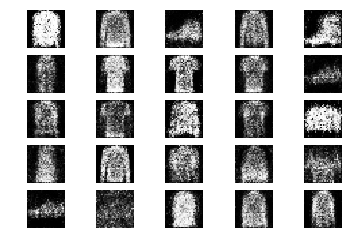

2651 [D loss: 0.602133, acc.: 68.75%] [G loss: 0.906666]
2652 [D loss: 0.590867, acc.: 68.75%] [G loss: 0.963512]
2653 [D loss: 0.651197, acc.: 59.38%] [G loss: 0.912663]
2654 [D loss: 0.602486, acc.: 70.31%] [G loss: 0.883166]
2655 [D loss: 0.577919, acc.: 64.06%] [G loss: 0.913831]
2656 [D loss: 0.638885, acc.: 60.94%] [G loss: 0.974486]
2657 [D loss: 0.581765, acc.: 70.31%] [G loss: 0.834630]
2658 [D loss: 0.629965, acc.: 64.06%] [G loss: 0.922235]
2659 [D loss: 0.687021, acc.: 59.38%] [G loss: 0.918977]
2660 [D loss: 0.613580, acc.: 60.94%] [G loss: 0.800303]
2661 [D loss: 0.652492, acc.: 56.25%] [G loss: 0.909579]
2662 [D loss: 0.592707, acc.: 62.50%] [G loss: 0.860735]
2663 [D loss: 0.631161, acc.: 71.88%] [G loss: 0.835898]
2664 [D loss: 0.673090, acc.: 65.62%] [G loss: 0.863242]
2665 [D loss: 0.663431, acc.: 59.38%] [G loss: 0.900449]
2666 [D loss: 0.606453, acc.: 60.94%] [G loss: 0.933815]
2667 [D loss: 0.629074, acc.: 67.19%] [G loss: 0.993336]
2668 [D loss: 0.545840, acc.: 7

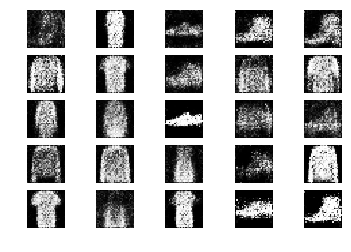

2701 [D loss: 0.652251, acc.: 62.50%] [G loss: 0.977581]
2702 [D loss: 0.601351, acc.: 73.44%] [G loss: 0.950472]
2703 [D loss: 0.623265, acc.: 60.94%] [G loss: 0.889521]
2704 [D loss: 0.620757, acc.: 65.62%] [G loss: 0.947109]
2705 [D loss: 0.648174, acc.: 60.94%] [G loss: 0.943791]
2706 [D loss: 0.663487, acc.: 60.94%] [G loss: 0.978300]
2707 [D loss: 0.593998, acc.: 68.75%] [G loss: 0.963822]
2708 [D loss: 0.648537, acc.: 60.94%] [G loss: 0.835954]
2709 [D loss: 0.599107, acc.: 67.19%] [G loss: 0.926318]
2710 [D loss: 0.582272, acc.: 71.88%] [G loss: 0.933595]
2711 [D loss: 0.637076, acc.: 64.06%] [G loss: 0.991010]
2712 [D loss: 0.628036, acc.: 62.50%] [G loss: 0.927289]
2713 [D loss: 0.647367, acc.: 59.38%] [G loss: 0.965202]
2714 [D loss: 0.645390, acc.: 60.94%] [G loss: 0.985850]
2715 [D loss: 0.692046, acc.: 53.12%] [G loss: 0.929968]
2716 [D loss: 0.653650, acc.: 57.81%] [G loss: 0.855573]
2717 [D loss: 0.591515, acc.: 71.88%] [G loss: 0.972444]
2718 [D loss: 0.618513, acc.: 6

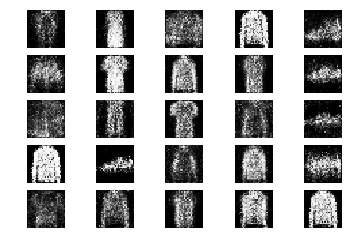

2751 [D loss: 0.614911, acc.: 67.19%] [G loss: 0.960519]
2752 [D loss: 0.589983, acc.: 71.88%] [G loss: 0.936051]
2753 [D loss: 0.623838, acc.: 68.75%] [G loss: 0.948676]
2754 [D loss: 0.635754, acc.: 65.62%] [G loss: 0.978545]
2755 [D loss: 0.617322, acc.: 67.19%] [G loss: 1.022132]
2756 [D loss: 0.599225, acc.: 70.31%] [G loss: 0.971961]
2757 [D loss: 0.707973, acc.: 57.81%] [G loss: 0.952661]
2758 [D loss: 0.599712, acc.: 68.75%] [G loss: 0.964121]
2759 [D loss: 0.597388, acc.: 70.31%] [G loss: 0.894121]
2760 [D loss: 0.675772, acc.: 50.00%] [G loss: 0.964543]
2761 [D loss: 0.568684, acc.: 73.44%] [G loss: 0.839194]
2762 [D loss: 0.686045, acc.: 53.12%] [G loss: 0.917876]
2763 [D loss: 0.619782, acc.: 67.19%] [G loss: 0.868691]
2764 [D loss: 0.579243, acc.: 64.06%] [G loss: 0.959874]
2765 [D loss: 0.609979, acc.: 67.19%] [G loss: 0.906421]
2766 [D loss: 0.592984, acc.: 64.06%] [G loss: 0.920904]
2767 [D loss: 0.635459, acc.: 56.25%] [G loss: 0.848906]
2768 [D loss: 0.675729, acc.: 5

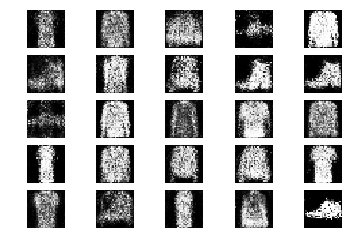

2801 [D loss: 0.600175, acc.: 70.31%] [G loss: 0.901118]
2802 [D loss: 0.650606, acc.: 64.06%] [G loss: 0.897646]
2803 [D loss: 0.566813, acc.: 84.38%] [G loss: 0.901637]
2804 [D loss: 0.657311, acc.: 64.06%] [G loss: 0.913040]
2805 [D loss: 0.642369, acc.: 59.38%] [G loss: 0.967217]
2806 [D loss: 0.596421, acc.: 65.62%] [G loss: 0.934557]
2807 [D loss: 0.602852, acc.: 67.19%] [G loss: 0.990676]
2808 [D loss: 0.619131, acc.: 64.06%] [G loss: 0.952826]
2809 [D loss: 0.576678, acc.: 67.19%] [G loss: 0.855785]
2810 [D loss: 0.609537, acc.: 65.62%] [G loss: 0.984877]
2811 [D loss: 0.615271, acc.: 65.62%] [G loss: 0.871529]
2812 [D loss: 0.668602, acc.: 60.94%] [G loss: 0.949569]
2813 [D loss: 0.591512, acc.: 67.19%] [G loss: 0.961125]
2814 [D loss: 0.673277, acc.: 60.94%] [G loss: 0.868856]
2815 [D loss: 0.621991, acc.: 62.50%] [G loss: 0.899677]
2816 [D loss: 0.613452, acc.: 68.75%] [G loss: 0.887750]
2817 [D loss: 0.575957, acc.: 68.75%] [G loss: 0.904183]
2818 [D loss: 0.618099, acc.: 6

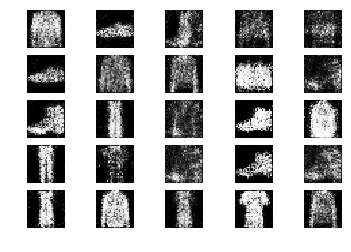

2851 [D loss: 0.655195, acc.: 65.62%] [G loss: 0.969637]
2852 [D loss: 0.563326, acc.: 71.88%] [G loss: 0.886044]
2853 [D loss: 0.584747, acc.: 65.62%] [G loss: 1.004230]
2854 [D loss: 0.631985, acc.: 59.38%] [G loss: 1.007393]
2855 [D loss: 0.653793, acc.: 70.31%] [G loss: 0.972302]
2856 [D loss: 0.669847, acc.: 60.94%] [G loss: 0.883666]
2857 [D loss: 0.666039, acc.: 59.38%] [G loss: 0.917825]
2858 [D loss: 0.679473, acc.: 54.69%] [G loss: 0.977413]
2859 [D loss: 0.647495, acc.: 60.94%] [G loss: 0.768000]
2860 [D loss: 0.652648, acc.: 53.12%] [G loss: 0.887435]
2861 [D loss: 0.628645, acc.: 62.50%] [G loss: 1.019011]
2862 [D loss: 0.660056, acc.: 56.25%] [G loss: 0.895623]
2863 [D loss: 0.606569, acc.: 62.50%] [G loss: 0.889350]
2864 [D loss: 0.641331, acc.: 62.50%] [G loss: 0.843167]
2865 [D loss: 0.625784, acc.: 65.62%] [G loss: 0.869655]
2866 [D loss: 0.626106, acc.: 68.75%] [G loss: 0.893485]
2867 [D loss: 0.618068, acc.: 62.50%] [G loss: 0.962556]
2868 [D loss: 0.638484, acc.: 5

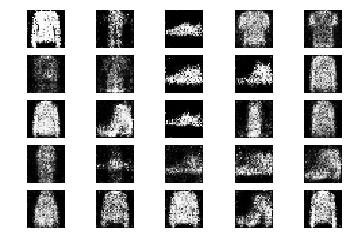

2901 [D loss: 0.724521, acc.: 53.12%] [G loss: 0.905706]
2902 [D loss: 0.595442, acc.: 67.19%] [G loss: 0.936175]
2903 [D loss: 0.646503, acc.: 64.06%] [G loss: 0.842279]
2904 [D loss: 0.664631, acc.: 67.19%] [G loss: 0.941900]
2905 [D loss: 0.611391, acc.: 65.62%] [G loss: 0.919978]
2906 [D loss: 0.662951, acc.: 60.94%] [G loss: 0.907352]
2907 [D loss: 0.613294, acc.: 71.88%] [G loss: 0.860456]
2908 [D loss: 0.576862, acc.: 73.44%] [G loss: 0.887771]
2909 [D loss: 0.590527, acc.: 67.19%] [G loss: 0.865026]
2910 [D loss: 0.557505, acc.: 67.19%] [G loss: 0.891072]
2911 [D loss: 0.637324, acc.: 67.19%] [G loss: 0.935795]
2912 [D loss: 0.564252, acc.: 76.56%] [G loss: 0.977598]
2913 [D loss: 0.580756, acc.: 75.00%] [G loss: 0.961370]
2914 [D loss: 0.662432, acc.: 65.62%] [G loss: 0.939819]
2915 [D loss: 0.610998, acc.: 70.31%] [G loss: 1.012037]
2916 [D loss: 0.537215, acc.: 71.88%] [G loss: 0.969407]
2917 [D loss: 0.666859, acc.: 65.62%] [G loss: 0.980481]
2918 [D loss: 0.693023, acc.: 6

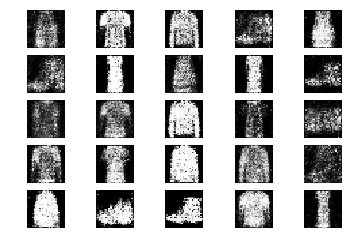

2951 [D loss: 0.568496, acc.: 70.31%] [G loss: 0.928205]
2952 [D loss: 0.670520, acc.: 59.38%] [G loss: 0.998696]
2953 [D loss: 0.611886, acc.: 62.50%] [G loss: 1.111130]
2954 [D loss: 0.610854, acc.: 60.94%] [G loss: 0.965980]
2955 [D loss: 0.645977, acc.: 64.06%] [G loss: 0.937016]
2956 [D loss: 0.607314, acc.: 62.50%] [G loss: 0.941391]
2957 [D loss: 0.585188, acc.: 71.88%] [G loss: 0.865696]
2958 [D loss: 0.605548, acc.: 73.44%] [G loss: 0.859793]
2959 [D loss: 0.569345, acc.: 64.06%] [G loss: 0.868179]
2960 [D loss: 0.667173, acc.: 57.81%] [G loss: 0.905232]
2961 [D loss: 0.689076, acc.: 56.25%] [G loss: 0.868093]
2962 [D loss: 0.600932, acc.: 70.31%] [G loss: 0.975459]
2963 [D loss: 0.620171, acc.: 67.19%] [G loss: 0.905487]
2964 [D loss: 0.617867, acc.: 64.06%] [G loss: 0.939261]
2965 [D loss: 0.590200, acc.: 65.62%] [G loss: 0.950203]
2966 [D loss: 0.551716, acc.: 70.31%] [G loss: 0.860514]
2967 [D loss: 0.607545, acc.: 64.06%] [G loss: 0.995109]
2968 [D loss: 0.705863, acc.: 5

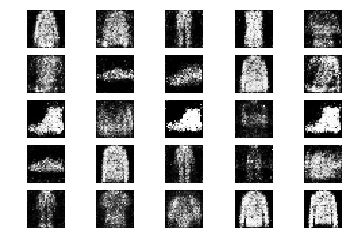

3001 [D loss: 0.603519, acc.: 71.88%] [G loss: 0.879463]
3002 [D loss: 0.618312, acc.: 64.06%] [G loss: 0.887954]
3003 [D loss: 0.570868, acc.: 73.44%] [G loss: 0.955833]
3004 [D loss: 0.618281, acc.: 60.94%] [G loss: 0.932789]
3005 [D loss: 0.711103, acc.: 50.00%] [G loss: 0.848773]
3006 [D loss: 0.633836, acc.: 65.62%] [G loss: 0.913788]
3007 [D loss: 0.652636, acc.: 57.81%] [G loss: 0.819887]
3008 [D loss: 0.583795, acc.: 68.75%] [G loss: 0.805725]
3009 [D loss: 0.625223, acc.: 62.50%] [G loss: 0.882024]
3010 [D loss: 0.595428, acc.: 68.75%] [G loss: 0.882735]
3011 [D loss: 0.627543, acc.: 57.81%] [G loss: 0.935959]
3012 [D loss: 0.636015, acc.: 59.38%] [G loss: 0.904926]
3013 [D loss: 0.725876, acc.: 45.31%] [G loss: 1.024730]
3014 [D loss: 0.623718, acc.: 68.75%] [G loss: 0.984334]
3015 [D loss: 0.629174, acc.: 60.94%] [G loss: 0.904296]
3016 [D loss: 0.670752, acc.: 56.25%] [G loss: 0.822732]
3017 [D loss: 0.596189, acc.: 65.62%] [G loss: 0.972641]
3018 [D loss: 0.684304, acc.: 5

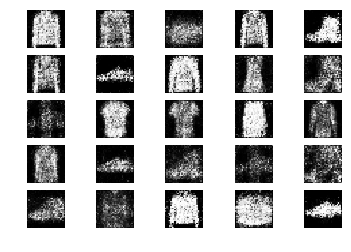

3051 [D loss: 0.613306, acc.: 70.31%] [G loss: 0.897006]
3052 [D loss: 0.613336, acc.: 70.31%] [G loss: 0.826783]
3053 [D loss: 0.592093, acc.: 64.06%] [G loss: 0.936172]
3054 [D loss: 0.665145, acc.: 59.38%] [G loss: 0.888924]
3055 [D loss: 0.662576, acc.: 54.69%] [G loss: 0.916651]
3056 [D loss: 0.598002, acc.: 64.06%] [G loss: 0.947529]
3057 [D loss: 0.615283, acc.: 60.94%] [G loss: 0.890831]
3058 [D loss: 0.682958, acc.: 51.56%] [G loss: 0.979195]
3059 [D loss: 0.621217, acc.: 64.06%] [G loss: 0.998558]
3060 [D loss: 0.638636, acc.: 56.25%] [G loss: 0.951607]
3061 [D loss: 0.576902, acc.: 71.88%] [G loss: 0.924540]
3062 [D loss: 0.561247, acc.: 67.19%] [G loss: 0.909821]
3063 [D loss: 0.597780, acc.: 71.88%] [G loss: 0.937958]
3064 [D loss: 0.609588, acc.: 65.62%] [G loss: 0.902478]
3065 [D loss: 0.637405, acc.: 62.50%] [G loss: 0.884545]
3066 [D loss: 0.633725, acc.: 64.06%] [G loss: 0.839202]
3067 [D loss: 0.691240, acc.: 60.94%] [G loss: 0.916224]
3068 [D loss: 0.564493, acc.: 7

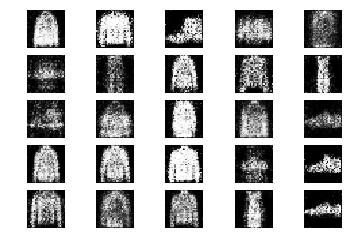

3101 [D loss: 0.614270, acc.: 65.62%] [G loss: 1.019158]
3102 [D loss: 0.565636, acc.: 76.56%] [G loss: 0.975559]
3103 [D loss: 0.613807, acc.: 64.06%] [G loss: 0.906740]
3104 [D loss: 0.624918, acc.: 60.94%] [G loss: 0.919775]
3105 [D loss: 0.663933, acc.: 62.50%] [G loss: 0.878249]
3106 [D loss: 0.658477, acc.: 56.25%] [G loss: 0.890451]
3107 [D loss: 0.619436, acc.: 59.38%] [G loss: 0.998706]
3108 [D loss: 0.621774, acc.: 62.50%] [G loss: 0.983362]
3109 [D loss: 0.613524, acc.: 70.31%] [G loss: 0.966446]
3110 [D loss: 0.559061, acc.: 78.12%] [G loss: 0.907955]
3111 [D loss: 0.678661, acc.: 54.69%] [G loss: 0.912855]
3112 [D loss: 0.585738, acc.: 67.19%] [G loss: 0.898849]
3113 [D loss: 0.625179, acc.: 65.62%] [G loss: 0.936871]
3114 [D loss: 0.589070, acc.: 64.06%] [G loss: 0.956299]
3115 [D loss: 0.649984, acc.: 67.19%] [G loss: 0.933713]
3116 [D loss: 0.617527, acc.: 62.50%] [G loss: 0.930087]
3117 [D loss: 0.667714, acc.: 57.81%] [G loss: 0.926974]
3118 [D loss: 0.624753, acc.: 6

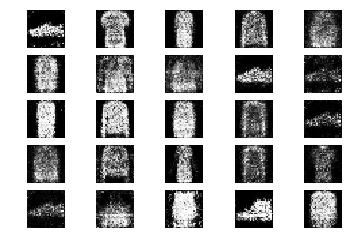

3151 [D loss: 0.647031, acc.: 62.50%] [G loss: 0.950079]
3152 [D loss: 0.534443, acc.: 73.44%] [G loss: 1.012177]
3153 [D loss: 0.705958, acc.: 62.50%] [G loss: 0.957995]
3154 [D loss: 0.643614, acc.: 67.19%] [G loss: 0.960170]
3155 [D loss: 0.594491, acc.: 57.81%] [G loss: 0.885176]
3156 [D loss: 0.601582, acc.: 67.19%] [G loss: 0.906926]
3157 [D loss: 0.560136, acc.: 76.56%] [G loss: 1.071689]
3158 [D loss: 0.650901, acc.: 62.50%] [G loss: 1.042163]
3159 [D loss: 0.665962, acc.: 60.94%] [G loss: 0.990793]
3160 [D loss: 0.573847, acc.: 71.88%] [G loss: 0.883036]
3161 [D loss: 0.622823, acc.: 59.38%] [G loss: 0.942132]
3162 [D loss: 0.636075, acc.: 67.19%] [G loss: 0.897591]
3163 [D loss: 0.615014, acc.: 62.50%] [G loss: 0.932088]
3164 [D loss: 0.560557, acc.: 67.19%] [G loss: 1.044261]
3165 [D loss: 0.598598, acc.: 65.62%] [G loss: 0.953258]
3166 [D loss: 0.672088, acc.: 57.81%] [G loss: 0.833937]
3167 [D loss: 0.576407, acc.: 65.62%] [G loss: 0.869772]
3168 [D loss: 0.602401, acc.: 6

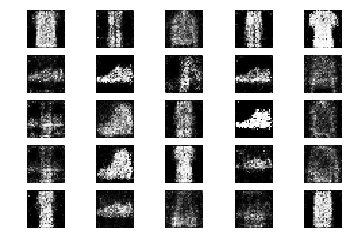

3201 [D loss: 0.715719, acc.: 50.00%] [G loss: 0.888492]
3202 [D loss: 0.611645, acc.: 59.38%] [G loss: 0.900928]
3203 [D loss: 0.540787, acc.: 73.44%] [G loss: 0.929697]
3204 [D loss: 0.646424, acc.: 56.25%] [G loss: 0.990376]
3205 [D loss: 0.616989, acc.: 67.19%] [G loss: 0.955534]
3206 [D loss: 0.708655, acc.: 51.56%] [G loss: 1.002510]
3207 [D loss: 0.635140, acc.: 62.50%] [G loss: 1.008907]
3208 [D loss: 0.630310, acc.: 65.62%] [G loss: 0.835099]
3209 [D loss: 0.617644, acc.: 70.31%] [G loss: 1.026507]
3210 [D loss: 0.612072, acc.: 68.75%] [G loss: 0.953107]
3211 [D loss: 0.559037, acc.: 76.56%] [G loss: 0.986688]
3212 [D loss: 0.606266, acc.: 67.19%] [G loss: 0.939704]
3213 [D loss: 0.686260, acc.: 60.94%] [G loss: 0.987836]
3214 [D loss: 0.699583, acc.: 51.56%] [G loss: 0.947707]
3215 [D loss: 0.707105, acc.: 50.00%] [G loss: 0.947859]
3216 [D loss: 0.598855, acc.: 71.88%] [G loss: 0.888312]
3217 [D loss: 0.596766, acc.: 64.06%] [G loss: 0.927993]
3218 [D loss: 0.625474, acc.: 6

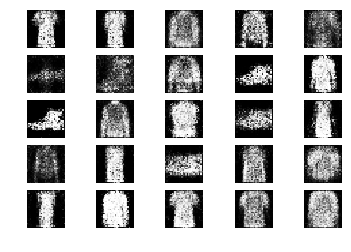

3251 [D loss: 0.606866, acc.: 70.31%] [G loss: 0.954566]
3252 [D loss: 0.552830, acc.: 70.31%] [G loss: 0.944847]
3253 [D loss: 0.587537, acc.: 70.31%] [G loss: 0.995945]
3254 [D loss: 0.593762, acc.: 54.69%] [G loss: 0.887198]
3255 [D loss: 0.557349, acc.: 71.88%] [G loss: 0.876851]
3256 [D loss: 0.583977, acc.: 68.75%] [G loss: 0.896216]
3257 [D loss: 0.612282, acc.: 68.75%] [G loss: 1.014165]
3258 [D loss: 0.692981, acc.: 56.25%] [G loss: 1.032620]
3259 [D loss: 0.579883, acc.: 65.62%] [G loss: 1.059027]
3260 [D loss: 0.546317, acc.: 75.00%] [G loss: 0.998385]
3261 [D loss: 0.632454, acc.: 60.94%] [G loss: 1.029698]
3262 [D loss: 0.638584, acc.: 59.38%] [G loss: 0.923898]
3263 [D loss: 0.576665, acc.: 73.44%] [G loss: 0.913592]
3264 [D loss: 0.593694, acc.: 70.31%] [G loss: 0.972426]
3265 [D loss: 0.672426, acc.: 59.38%] [G loss: 0.947037]
3266 [D loss: 0.638228, acc.: 54.69%] [G loss: 0.843874]
3267 [D loss: 0.671852, acc.: 56.25%] [G loss: 0.951111]
3268 [D loss: 0.609349, acc.: 6

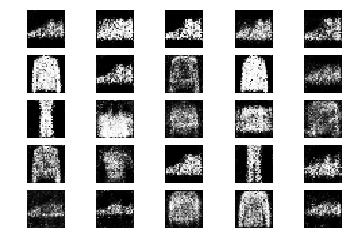

3301 [D loss: 0.604540, acc.: 67.19%] [G loss: 0.909268]
3302 [D loss: 0.606422, acc.: 64.06%] [G loss: 1.012144]
3303 [D loss: 0.596424, acc.: 75.00%] [G loss: 1.020702]
3304 [D loss: 0.646161, acc.: 54.69%] [G loss: 0.955548]
3305 [D loss: 0.566956, acc.: 70.31%] [G loss: 1.009115]
3306 [D loss: 0.699865, acc.: 51.56%] [G loss: 0.947528]
3307 [D loss: 0.629301, acc.: 64.06%] [G loss: 0.995465]
3308 [D loss: 0.570147, acc.: 71.88%] [G loss: 0.999581]
3309 [D loss: 0.614662, acc.: 67.19%] [G loss: 1.072616]
3310 [D loss: 0.609825, acc.: 64.06%] [G loss: 0.978798]
3311 [D loss: 0.700279, acc.: 57.81%] [G loss: 0.920735]
3312 [D loss: 0.625327, acc.: 62.50%] [G loss: 0.816770]
3313 [D loss: 0.663894, acc.: 60.94%] [G loss: 0.867180]
3314 [D loss: 0.557564, acc.: 76.56%] [G loss: 0.934942]
3315 [D loss: 0.585065, acc.: 68.75%] [G loss: 0.873718]
3316 [D loss: 0.620973, acc.: 62.50%] [G loss: 0.956114]
3317 [D loss: 0.582365, acc.: 73.44%] [G loss: 0.883879]
3318 [D loss: 0.685853, acc.: 5

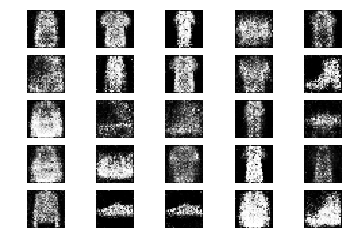

3351 [D loss: 0.617018, acc.: 62.50%] [G loss: 1.016868]
3352 [D loss: 0.589502, acc.: 68.75%] [G loss: 1.035383]
3353 [D loss: 0.574279, acc.: 73.44%] [G loss: 1.008041]
3354 [D loss: 0.607355, acc.: 64.06%] [G loss: 0.971977]
3355 [D loss: 0.637929, acc.: 64.06%] [G loss: 0.895740]
3356 [D loss: 0.566552, acc.: 76.56%] [G loss: 0.976473]
3357 [D loss: 0.605646, acc.: 68.75%] [G loss: 1.012908]
3358 [D loss: 0.558032, acc.: 70.31%] [G loss: 0.891539]
3359 [D loss: 0.677594, acc.: 54.69%] [G loss: 0.917015]
3360 [D loss: 0.600394, acc.: 70.31%] [G loss: 0.987409]
3361 [D loss: 0.619024, acc.: 59.38%] [G loss: 0.883544]
3362 [D loss: 0.646674, acc.: 53.12%] [G loss: 0.960878]
3363 [D loss: 0.611086, acc.: 67.19%] [G loss: 1.021343]
3364 [D loss: 0.574224, acc.: 76.56%] [G loss: 1.070857]
3365 [D loss: 0.564041, acc.: 75.00%] [G loss: 1.052524]
3366 [D loss: 0.650983, acc.: 62.50%] [G loss: 1.073379]
3367 [D loss: 0.647855, acc.: 54.69%] [G loss: 1.008032]
3368 [D loss: 0.720211, acc.: 5

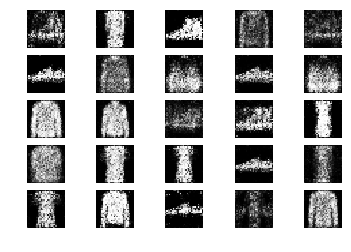

3401 [D loss: 0.646187, acc.: 57.81%] [G loss: 0.946799]
3402 [D loss: 0.589618, acc.: 65.62%] [G loss: 0.948136]
3403 [D loss: 0.539576, acc.: 71.88%] [G loss: 1.001307]
3404 [D loss: 0.668268, acc.: 56.25%] [G loss: 0.985512]
3405 [D loss: 0.622423, acc.: 64.06%] [G loss: 0.985784]
3406 [D loss: 0.556763, acc.: 75.00%] [G loss: 0.993965]
3407 [D loss: 0.612745, acc.: 62.50%] [G loss: 1.049071]
3408 [D loss: 0.561533, acc.: 70.31%] [G loss: 0.981812]
3409 [D loss: 0.604025, acc.: 68.75%] [G loss: 0.932788]
3410 [D loss: 0.648532, acc.: 59.38%] [G loss: 0.972477]
3411 [D loss: 0.599252, acc.: 62.50%] [G loss: 1.030492]
3412 [D loss: 0.646413, acc.: 56.25%] [G loss: 1.129790]
3413 [D loss: 0.681201, acc.: 64.06%] [G loss: 1.062545]
3414 [D loss: 0.538364, acc.: 73.44%] [G loss: 0.974272]
3415 [D loss: 0.564757, acc.: 75.00%] [G loss: 1.072148]
3416 [D loss: 0.602913, acc.: 70.31%] [G loss: 1.061934]
3417 [D loss: 0.582498, acc.: 70.31%] [G loss: 1.004939]
3418 [D loss: 0.614022, acc.: 7

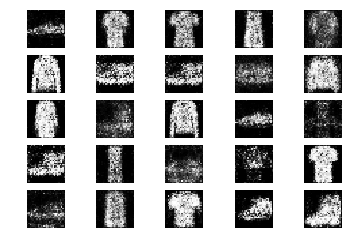

3451 [D loss: 0.649091, acc.: 65.62%] [G loss: 1.000922]
3452 [D loss: 0.567386, acc.: 75.00%] [G loss: 1.004001]
3453 [D loss: 0.644043, acc.: 67.19%] [G loss: 0.877996]
3454 [D loss: 0.538959, acc.: 78.12%] [G loss: 0.971458]
3455 [D loss: 0.596336, acc.: 68.75%] [G loss: 1.008324]
3456 [D loss: 0.580564, acc.: 64.06%] [G loss: 1.048657]
3457 [D loss: 0.621634, acc.: 62.50%] [G loss: 0.931424]
3458 [D loss: 0.583506, acc.: 65.62%] [G loss: 0.942021]
3459 [D loss: 0.715904, acc.: 54.69%] [G loss: 0.982535]
3460 [D loss: 0.623525, acc.: 57.81%] [G loss: 0.988474]
3461 [D loss: 0.649472, acc.: 64.06%] [G loss: 0.874338]
3462 [D loss: 0.550354, acc.: 78.12%] [G loss: 1.001903]
3463 [D loss: 0.578246, acc.: 64.06%] [G loss: 0.983587]
3464 [D loss: 0.594280, acc.: 65.62%] [G loss: 0.956547]
3465 [D loss: 0.608453, acc.: 68.75%] [G loss: 0.949449]
3466 [D loss: 0.616771, acc.: 62.50%] [G loss: 0.929063]
3467 [D loss: 0.614433, acc.: 65.62%] [G loss: 0.857984]
3468 [D loss: 0.556032, acc.: 6

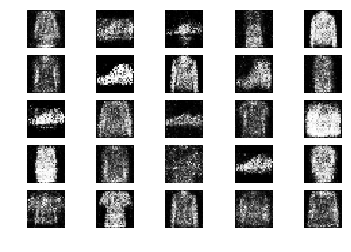

3501 [D loss: 0.644215, acc.: 62.50%] [G loss: 0.923631]
3502 [D loss: 0.616858, acc.: 70.31%] [G loss: 0.941295]
3503 [D loss: 0.640494, acc.: 67.19%] [G loss: 0.910998]
3504 [D loss: 0.656781, acc.: 57.81%] [G loss: 0.921117]
3505 [D loss: 0.678999, acc.: 59.38%] [G loss: 0.991435]
3506 [D loss: 0.595706, acc.: 62.50%] [G loss: 0.993346]
3507 [D loss: 0.571263, acc.: 65.62%] [G loss: 0.975722]
3508 [D loss: 0.657416, acc.: 54.69%] [G loss: 1.009872]
3509 [D loss: 0.658454, acc.: 59.38%] [G loss: 0.973477]
3510 [D loss: 0.619297, acc.: 64.06%] [G loss: 0.877264]
3511 [D loss: 0.703943, acc.: 46.88%] [G loss: 0.893913]
3512 [D loss: 0.626175, acc.: 57.81%] [G loss: 0.924720]
3513 [D loss: 0.592501, acc.: 73.44%] [G loss: 0.924952]
3514 [D loss: 0.517559, acc.: 71.88%] [G loss: 0.877757]
3515 [D loss: 0.633071, acc.: 59.38%] [G loss: 0.969041]
3516 [D loss: 0.720218, acc.: 54.69%] [G loss: 0.919420]
3517 [D loss: 0.613725, acc.: 67.19%] [G loss: 1.025337]
3518 [D loss: 0.616471, acc.: 6

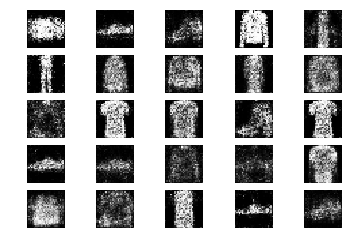

3551 [D loss: 0.580498, acc.: 73.44%] [G loss: 0.879631]
3552 [D loss: 0.631735, acc.: 64.06%] [G loss: 0.988975]
3553 [D loss: 0.630659, acc.: 65.62%] [G loss: 1.002870]
3554 [D loss: 0.655325, acc.: 56.25%] [G loss: 0.960526]
3555 [D loss: 0.598193, acc.: 70.31%] [G loss: 0.902955]
3556 [D loss: 0.602724, acc.: 65.62%] [G loss: 0.885974]
3557 [D loss: 0.625044, acc.: 60.94%] [G loss: 0.922323]
3558 [D loss: 0.627303, acc.: 64.06%] [G loss: 0.985648]
3559 [D loss: 0.564847, acc.: 68.75%] [G loss: 0.928746]
3560 [D loss: 0.610274, acc.: 57.81%] [G loss: 0.917584]
3561 [D loss: 0.580880, acc.: 67.19%] [G loss: 1.022249]
3562 [D loss: 0.667284, acc.: 54.69%] [G loss: 0.971847]
3563 [D loss: 0.580006, acc.: 71.88%] [G loss: 0.925717]
3564 [D loss: 0.633184, acc.: 54.69%] [G loss: 0.983547]
3565 [D loss: 0.663900, acc.: 57.81%] [G loss: 1.112391]
3566 [D loss: 0.554460, acc.: 76.56%] [G loss: 1.013547]
3567 [D loss: 0.594611, acc.: 65.62%] [G loss: 0.981802]
3568 [D loss: 0.615335, acc.: 6

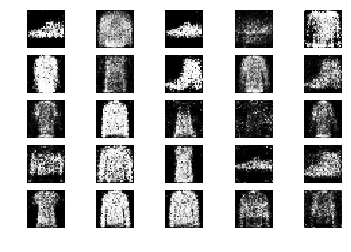

3601 [D loss: 0.625966, acc.: 62.50%] [G loss: 0.960916]
3602 [D loss: 0.669469, acc.: 54.69%] [G loss: 1.012712]
3603 [D loss: 0.528556, acc.: 79.69%] [G loss: 0.996902]
3604 [D loss: 0.563637, acc.: 70.31%] [G loss: 0.963959]
3605 [D loss: 0.575274, acc.: 70.31%] [G loss: 0.930635]
3606 [D loss: 0.658717, acc.: 57.81%] [G loss: 0.996421]
3607 [D loss: 0.617879, acc.: 57.81%] [G loss: 0.974057]
3608 [D loss: 0.645966, acc.: 64.06%] [G loss: 0.940907]
3609 [D loss: 0.635401, acc.: 54.69%] [G loss: 0.934274]
3610 [D loss: 0.612205, acc.: 70.31%] [G loss: 0.908456]
3611 [D loss: 0.588277, acc.: 71.88%] [G loss: 0.925237]
3612 [D loss: 0.671782, acc.: 64.06%] [G loss: 0.930834]
3613 [D loss: 0.627312, acc.: 65.62%] [G loss: 0.982929]
3614 [D loss: 0.654567, acc.: 64.06%] [G loss: 1.009818]
3615 [D loss: 0.601453, acc.: 65.62%] [G loss: 0.994461]
3616 [D loss: 0.635492, acc.: 60.94%] [G loss: 0.949921]
3617 [D loss: 0.582085, acc.: 65.62%] [G loss: 1.020662]
3618 [D loss: 0.581898, acc.: 7

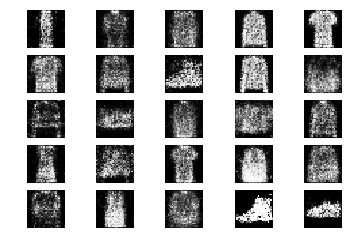

3651 [D loss: 0.573868, acc.: 71.88%] [G loss: 1.037816]
3652 [D loss: 0.648658, acc.: 64.06%] [G loss: 0.982678]
3653 [D loss: 0.676392, acc.: 56.25%] [G loss: 0.879932]
3654 [D loss: 0.562793, acc.: 71.88%] [G loss: 1.013138]
3655 [D loss: 0.672885, acc.: 67.19%] [G loss: 0.930330]
3656 [D loss: 0.655499, acc.: 62.50%] [G loss: 0.885695]
3657 [D loss: 0.665587, acc.: 57.81%] [G loss: 0.954827]
3658 [D loss: 0.570453, acc.: 71.88%] [G loss: 1.004937]
3659 [D loss: 0.599454, acc.: 64.06%] [G loss: 1.037125]
3660 [D loss: 0.628120, acc.: 65.62%] [G loss: 0.992359]
3661 [D loss: 0.652293, acc.: 62.50%] [G loss: 0.950976]
3662 [D loss: 0.597489, acc.: 78.12%] [G loss: 1.010121]
3663 [D loss: 0.669080, acc.: 53.12%] [G loss: 1.017694]
3664 [D loss: 0.601000, acc.: 65.62%] [G loss: 1.045636]
3665 [D loss: 0.637715, acc.: 67.19%] [G loss: 0.956155]
3666 [D loss: 0.590553, acc.: 70.31%] [G loss: 0.943885]
3667 [D loss: 0.687756, acc.: 54.69%] [G loss: 0.928769]
3668 [D loss: 0.600293, acc.: 5

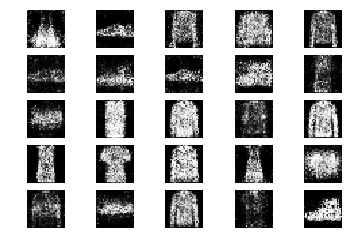

3701 [D loss: 0.558555, acc.: 68.75%] [G loss: 1.049892]
3702 [D loss: 0.635090, acc.: 59.38%] [G loss: 0.958750]
3703 [D loss: 0.673219, acc.: 57.81%] [G loss: 0.923280]
3704 [D loss: 0.617510, acc.: 60.94%] [G loss: 0.973788]
3705 [D loss: 0.575933, acc.: 70.31%] [G loss: 0.983988]
3706 [D loss: 0.617955, acc.: 62.50%] [G loss: 0.946213]
3707 [D loss: 0.602087, acc.: 65.62%] [G loss: 0.992654]
3708 [D loss: 0.594326, acc.: 71.88%] [G loss: 1.021546]
3709 [D loss: 0.610601, acc.: 67.19%] [G loss: 0.921167]
3710 [D loss: 0.652797, acc.: 64.06%] [G loss: 0.962923]
3711 [D loss: 0.587084, acc.: 65.62%] [G loss: 0.893112]
3712 [D loss: 0.577694, acc.: 68.75%] [G loss: 0.877880]
3713 [D loss: 0.597084, acc.: 68.75%] [G loss: 0.931201]
3714 [D loss: 0.705334, acc.: 59.38%] [G loss: 0.898412]
3715 [D loss: 0.724574, acc.: 51.56%] [G loss: 0.940199]
3716 [D loss: 0.708397, acc.: 54.69%] [G loss: 0.917065]
3717 [D loss: 0.553917, acc.: 71.88%] [G loss: 0.958497]
3718 [D loss: 0.603287, acc.: 6

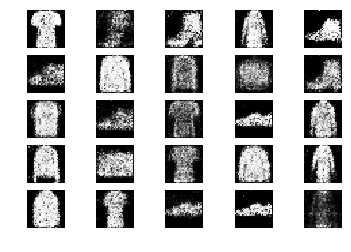

3751 [D loss: 0.687623, acc.: 60.94%] [G loss: 0.958427]
3752 [D loss: 0.666998, acc.: 57.81%] [G loss: 1.065556]
3753 [D loss: 0.585555, acc.: 73.44%] [G loss: 0.950029]
3754 [D loss: 0.644446, acc.: 54.69%] [G loss: 1.019109]
3755 [D loss: 0.674362, acc.: 56.25%] [G loss: 0.908890]
3756 [D loss: 0.591055, acc.: 68.75%] [G loss: 0.920272]
3757 [D loss: 0.594322, acc.: 62.50%] [G loss: 0.883131]
3758 [D loss: 0.665776, acc.: 60.94%] [G loss: 0.963917]
3759 [D loss: 0.609215, acc.: 59.38%] [G loss: 0.998501]
3760 [D loss: 0.630846, acc.: 64.06%] [G loss: 0.926405]
3761 [D loss: 0.686012, acc.: 53.12%] [G loss: 0.922002]
3762 [D loss: 0.637293, acc.: 65.62%] [G loss: 0.850436]
3763 [D loss: 0.674098, acc.: 53.12%] [G loss: 0.894365]
3764 [D loss: 0.614063, acc.: 65.62%] [G loss: 0.791987]
3765 [D loss: 0.663160, acc.: 57.81%] [G loss: 0.826558]
3766 [D loss: 0.646462, acc.: 65.62%] [G loss: 0.969923]
3767 [D loss: 0.723052, acc.: 50.00%] [G loss: 0.893766]
3768 [D loss: 0.683327, acc.: 5

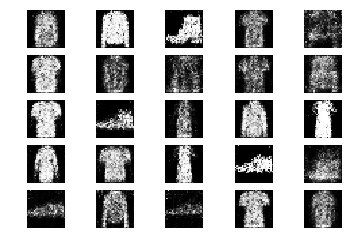

3801 [D loss: 0.616052, acc.: 62.50%] [G loss: 0.935183]
3802 [D loss: 0.623413, acc.: 67.19%] [G loss: 0.939077]
3803 [D loss: 0.637384, acc.: 65.62%] [G loss: 0.949976]
3804 [D loss: 0.616016, acc.: 71.88%] [G loss: 0.910336]
3805 [D loss: 0.654034, acc.: 57.81%] [G loss: 0.875921]
3806 [D loss: 0.628132, acc.: 60.94%] [G loss: 0.987243]
3807 [D loss: 0.679812, acc.: 54.69%] [G loss: 0.892509]
3808 [D loss: 0.635562, acc.: 59.38%] [G loss: 0.953101]
3809 [D loss: 0.631219, acc.: 62.50%] [G loss: 0.918692]
3810 [D loss: 0.586676, acc.: 64.06%] [G loss: 0.946399]
3811 [D loss: 0.558953, acc.: 70.31%] [G loss: 0.972712]
3812 [D loss: 0.625499, acc.: 64.06%] [G loss: 1.004344]
3813 [D loss: 0.629644, acc.: 67.19%] [G loss: 1.008676]
3814 [D loss: 0.625132, acc.: 62.50%] [G loss: 0.909665]
3815 [D loss: 0.626977, acc.: 62.50%] [G loss: 0.988729]
3816 [D loss: 0.585268, acc.: 68.75%] [G loss: 0.907422]
3817 [D loss: 0.589142, acc.: 64.06%] [G loss: 0.937046]
3818 [D loss: 0.670777, acc.: 6

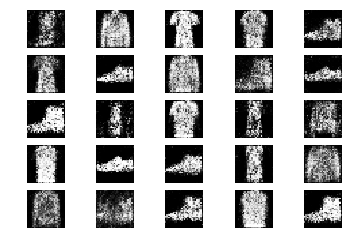

3851 [D loss: 0.564472, acc.: 73.44%] [G loss: 0.993114]
3852 [D loss: 0.693089, acc.: 53.12%] [G loss: 0.960205]
3853 [D loss: 0.587295, acc.: 70.31%] [G loss: 0.990080]
3854 [D loss: 0.591913, acc.: 71.88%] [G loss: 0.971429]
3855 [D loss: 0.645620, acc.: 60.94%] [G loss: 0.974324]
3856 [D loss: 0.638266, acc.: 67.19%] [G loss: 1.002287]
3857 [D loss: 0.696203, acc.: 56.25%] [G loss: 0.825691]
3858 [D loss: 0.595802, acc.: 56.25%] [G loss: 0.922439]
3859 [D loss: 0.704437, acc.: 51.56%] [G loss: 1.019093]
3860 [D loss: 0.598972, acc.: 71.88%] [G loss: 1.041963]
3861 [D loss: 0.686987, acc.: 54.69%] [G loss: 0.947729]
3862 [D loss: 0.638042, acc.: 57.81%] [G loss: 1.012714]
3863 [D loss: 0.577073, acc.: 71.88%] [G loss: 0.967951]
3864 [D loss: 0.655411, acc.: 57.81%] [G loss: 0.972238]
3865 [D loss: 0.621095, acc.: 62.50%] [G loss: 0.827137]
3866 [D loss: 0.602140, acc.: 65.62%] [G loss: 0.910635]
3867 [D loss: 0.635684, acc.: 60.94%] [G loss: 0.885868]
3868 [D loss: 0.657412, acc.: 6

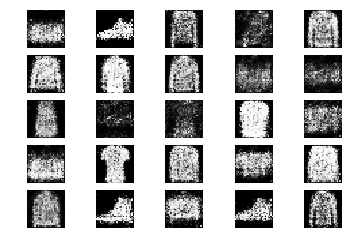

3901 [D loss: 0.557295, acc.: 67.19%] [G loss: 1.006196]
3902 [D loss: 0.597572, acc.: 67.19%] [G loss: 0.972315]
3903 [D loss: 0.553749, acc.: 73.44%] [G loss: 1.014878]
3904 [D loss: 0.642412, acc.: 64.06%] [G loss: 0.911448]
3905 [D loss: 0.616118, acc.: 62.50%] [G loss: 0.969174]
3906 [D loss: 0.602018, acc.: 62.50%] [G loss: 0.849420]
3907 [D loss: 0.633532, acc.: 67.19%] [G loss: 0.896899]
3908 [D loss: 0.589992, acc.: 68.75%] [G loss: 0.859675]
3909 [D loss: 0.691979, acc.: 54.69%] [G loss: 0.918583]
3910 [D loss: 0.675921, acc.: 60.94%] [G loss: 0.948718]
3911 [D loss: 0.572968, acc.: 75.00%] [G loss: 0.981783]
3912 [D loss: 0.671237, acc.: 54.69%] [G loss: 0.937151]
3913 [D loss: 0.682605, acc.: 57.81%] [G loss: 0.983393]
3914 [D loss: 0.611351, acc.: 64.06%] [G loss: 0.927973]
3915 [D loss: 0.539473, acc.: 73.44%] [G loss: 0.934063]
3916 [D loss: 0.679645, acc.: 59.38%] [G loss: 0.832995]
3917 [D loss: 0.670990, acc.: 50.00%] [G loss: 0.932548]
3918 [D loss: 0.602346, acc.: 6

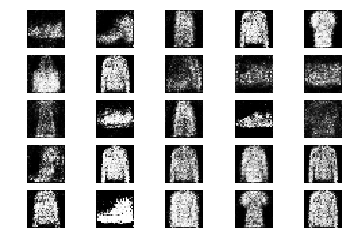

3951 [D loss: 0.617286, acc.: 68.75%] [G loss: 0.902336]
3952 [D loss: 0.586707, acc.: 60.94%] [G loss: 0.955932]
3953 [D loss: 0.593962, acc.: 65.62%] [G loss: 1.060992]
3954 [D loss: 0.646671, acc.: 64.06%] [G loss: 0.926226]
3955 [D loss: 0.627959, acc.: 67.19%] [G loss: 0.903803]
3956 [D loss: 0.589872, acc.: 64.06%] [G loss: 1.020174]
3957 [D loss: 0.666571, acc.: 59.38%] [G loss: 0.932094]
3958 [D loss: 0.682766, acc.: 51.56%] [G loss: 0.944621]
3959 [D loss: 0.572449, acc.: 73.44%] [G loss: 0.925621]
3960 [D loss: 0.681243, acc.: 54.69%] [G loss: 0.938682]
3961 [D loss: 0.700045, acc.: 57.81%] [G loss: 0.798521]
3962 [D loss: 0.597141, acc.: 70.31%] [G loss: 0.811351]
3963 [D loss: 0.670532, acc.: 51.56%] [G loss: 0.960859]
3964 [D loss: 0.677425, acc.: 56.25%] [G loss: 1.017822]
3965 [D loss: 0.692669, acc.: 53.12%] [G loss: 0.996413]
3966 [D loss: 0.624049, acc.: 64.06%] [G loss: 0.827635]
3967 [D loss: 0.610022, acc.: 60.94%] [G loss: 0.917207]
3968 [D loss: 0.638588, acc.: 5

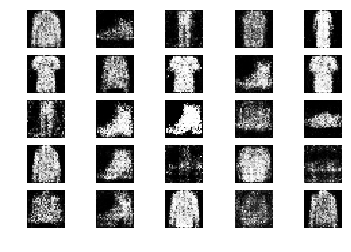

4001 [D loss: 0.634983, acc.: 53.12%] [G loss: 0.952328]
4002 [D loss: 0.607976, acc.: 64.06%] [G loss: 0.911072]
4003 [D loss: 0.647401, acc.: 57.81%] [G loss: 0.881813]
4004 [D loss: 0.666054, acc.: 54.69%] [G loss: 0.931077]
4005 [D loss: 0.607047, acc.: 68.75%] [G loss: 0.919096]
4006 [D loss: 0.594020, acc.: 65.62%] [G loss: 0.933688]
4007 [D loss: 0.660601, acc.: 53.12%] [G loss: 0.958828]
4008 [D loss: 0.566489, acc.: 71.88%] [G loss: 0.924143]
4009 [D loss: 0.609482, acc.: 64.06%] [G loss: 0.981382]
4010 [D loss: 0.595899, acc.: 65.62%] [G loss: 0.876674]
4011 [D loss: 0.592939, acc.: 73.44%] [G loss: 0.956106]
4012 [D loss: 0.613910, acc.: 70.31%] [G loss: 0.974070]
4013 [D loss: 0.646723, acc.: 57.81%] [G loss: 0.867584]
4014 [D loss: 0.662059, acc.: 56.25%] [G loss: 0.860077]
4015 [D loss: 0.604326, acc.: 68.75%] [G loss: 0.909224]
4016 [D loss: 0.702676, acc.: 57.81%] [G loss: 0.959083]
4017 [D loss: 0.596893, acc.: 67.19%] [G loss: 0.900616]
4018 [D loss: 0.580126, acc.: 6

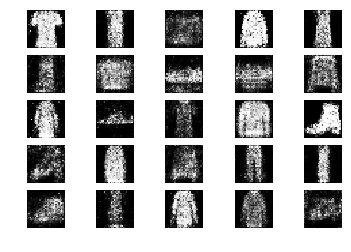

4051 [D loss: 0.679369, acc.: 53.12%] [G loss: 1.043175]
4052 [D loss: 0.581146, acc.: 70.31%] [G loss: 1.006275]
4053 [D loss: 0.578914, acc.: 64.06%] [G loss: 0.946653]
4054 [D loss: 0.720405, acc.: 51.56%] [G loss: 0.952071]
4055 [D loss: 0.581650, acc.: 68.75%] [G loss: 0.890527]
4056 [D loss: 0.648484, acc.: 59.38%] [G loss: 0.865892]
4057 [D loss: 0.548656, acc.: 70.31%] [G loss: 0.896618]
4058 [D loss: 0.648088, acc.: 68.75%] [G loss: 0.969788]
4059 [D loss: 0.644779, acc.: 56.25%] [G loss: 0.967680]
4060 [D loss: 0.671137, acc.: 67.19%] [G loss: 0.985661]
4061 [D loss: 0.609224, acc.: 67.19%] [G loss: 0.871155]
4062 [D loss: 0.620265, acc.: 62.50%] [G loss: 0.837489]
4063 [D loss: 0.702173, acc.: 45.31%] [G loss: 0.824095]
4064 [D loss: 0.648732, acc.: 64.06%] [G loss: 0.897037]
4065 [D loss: 0.560589, acc.: 75.00%] [G loss: 1.048827]
4066 [D loss: 0.636891, acc.: 64.06%] [G loss: 1.036092]
4067 [D loss: 0.595962, acc.: 75.00%] [G loss: 1.052561]
4068 [D loss: 0.631534, acc.: 6

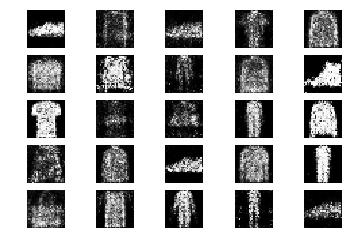

4101 [D loss: 0.585528, acc.: 75.00%] [G loss: 0.982332]
4102 [D loss: 0.651116, acc.: 64.06%] [G loss: 0.897050]
4103 [D loss: 0.664735, acc.: 56.25%] [G loss: 0.919723]
4104 [D loss: 0.663734, acc.: 56.25%] [G loss: 0.887020]
4105 [D loss: 0.594226, acc.: 71.88%] [G loss: 0.903987]
4106 [D loss: 0.622282, acc.: 60.94%] [G loss: 0.921201]
4107 [D loss: 0.621846, acc.: 57.81%] [G loss: 0.964296]
4108 [D loss: 0.614048, acc.: 71.88%] [G loss: 0.921797]
4109 [D loss: 0.560591, acc.: 76.56%] [G loss: 0.877216]
4110 [D loss: 0.587284, acc.: 68.75%] [G loss: 0.981857]
4111 [D loss: 0.617646, acc.: 68.75%] [G loss: 0.907206]
4112 [D loss: 0.631852, acc.: 70.31%] [G loss: 1.003343]
4113 [D loss: 0.639190, acc.: 65.62%] [G loss: 0.893175]
4114 [D loss: 0.700216, acc.: 62.50%] [G loss: 0.898165]
4115 [D loss: 0.632165, acc.: 59.38%] [G loss: 0.887653]
4116 [D loss: 0.632913, acc.: 62.50%] [G loss: 0.987245]
4117 [D loss: 0.567866, acc.: 76.56%] [G loss: 0.961847]
4118 [D loss: 0.616113, acc.: 6

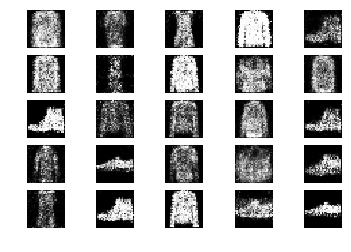

4151 [D loss: 0.599678, acc.: 67.19%] [G loss: 1.004569]
4152 [D loss: 0.636466, acc.: 64.06%] [G loss: 1.033613]
4153 [D loss: 0.621859, acc.: 67.19%] [G loss: 0.940053]
4154 [D loss: 0.668363, acc.: 56.25%] [G loss: 0.975703]
4155 [D loss: 0.646820, acc.: 62.50%] [G loss: 0.934137]
4156 [D loss: 0.654212, acc.: 56.25%] [G loss: 0.938181]
4157 [D loss: 0.604161, acc.: 65.62%] [G loss: 0.900210]
4158 [D loss: 0.650104, acc.: 57.81%] [G loss: 0.883808]
4159 [D loss: 0.686592, acc.: 53.12%] [G loss: 0.922843]
4160 [D loss: 0.638794, acc.: 65.62%] [G loss: 0.942027]
4161 [D loss: 0.714585, acc.: 46.88%] [G loss: 0.820352]
4162 [D loss: 0.718153, acc.: 43.75%] [G loss: 0.885622]
4163 [D loss: 0.674989, acc.: 53.12%] [G loss: 0.961973]
4164 [D loss: 0.597463, acc.: 64.06%] [G loss: 0.972474]
4165 [D loss: 0.624877, acc.: 57.81%] [G loss: 0.970260]
4166 [D loss: 0.675884, acc.: 56.25%] [G loss: 0.931263]
4167 [D loss: 0.633786, acc.: 67.19%] [G loss: 0.903084]
4168 [D loss: 0.633719, acc.: 5

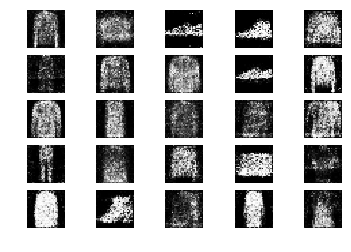

4201 [D loss: 0.682579, acc.: 57.81%] [G loss: 0.950225]
4202 [D loss: 0.642448, acc.: 64.06%] [G loss: 0.839371]
4203 [D loss: 0.594917, acc.: 68.75%] [G loss: 0.861168]
4204 [D loss: 0.663225, acc.: 54.69%] [G loss: 1.059069]
4205 [D loss: 0.644153, acc.: 57.81%] [G loss: 1.001026]
4206 [D loss: 0.622295, acc.: 64.06%] [G loss: 1.053201]
4207 [D loss: 0.667315, acc.: 56.25%] [G loss: 0.928490]
4208 [D loss: 0.664694, acc.: 54.69%] [G loss: 0.871648]
4209 [D loss: 0.634830, acc.: 56.25%] [G loss: 0.960662]
4210 [D loss: 0.588114, acc.: 70.31%] [G loss: 0.929559]
4211 [D loss: 0.594248, acc.: 71.88%] [G loss: 0.953481]
4212 [D loss: 0.646036, acc.: 62.50%] [G loss: 0.862108]
4213 [D loss: 0.595427, acc.: 64.06%] [G loss: 0.937392]
4214 [D loss: 0.590002, acc.: 67.19%] [G loss: 0.965595]
4215 [D loss: 0.627683, acc.: 68.75%] [G loss: 0.999672]
4216 [D loss: 0.628657, acc.: 70.31%] [G loss: 0.908490]
4217 [D loss: 0.638734, acc.: 60.94%] [G loss: 0.880541]
4218 [D loss: 0.614886, acc.: 5

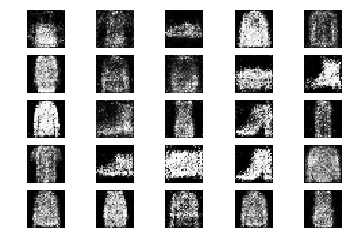

4251 [D loss: 0.647904, acc.: 62.50%] [G loss: 0.964491]
4252 [D loss: 0.584881, acc.: 71.88%] [G loss: 0.892330]
4253 [D loss: 0.637039, acc.: 65.62%] [G loss: 1.005836]
4254 [D loss: 0.671259, acc.: 65.62%] [G loss: 0.985310]
4255 [D loss: 0.614096, acc.: 68.75%] [G loss: 0.904580]
4256 [D loss: 0.610056, acc.: 62.50%] [G loss: 0.919429]
4257 [D loss: 0.640743, acc.: 57.81%] [G loss: 0.913840]
4258 [D loss: 0.626247, acc.: 57.81%] [G loss: 0.924474]
4259 [D loss: 0.653122, acc.: 57.81%] [G loss: 0.897949]
4260 [D loss: 0.654866, acc.: 56.25%] [G loss: 0.868623]
4261 [D loss: 0.532206, acc.: 76.56%] [G loss: 0.946945]
4262 [D loss: 0.630503, acc.: 64.06%] [G loss: 1.006557]
4263 [D loss: 0.665448, acc.: 56.25%] [G loss: 0.953472]
4264 [D loss: 0.619928, acc.: 59.38%] [G loss: 0.968676]
4265 [D loss: 0.637504, acc.: 67.19%] [G loss: 0.913444]
4266 [D loss: 0.610220, acc.: 68.75%] [G loss: 0.962897]
4267 [D loss: 0.682262, acc.: 56.25%] [G loss: 0.923705]
4268 [D loss: 0.615348, acc.: 6

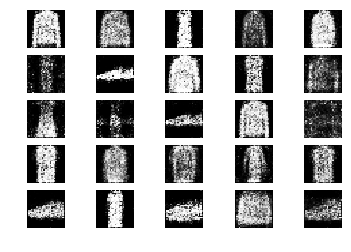

4301 [D loss: 0.673470, acc.: 56.25%] [G loss: 0.884774]
4302 [D loss: 0.658412, acc.: 57.81%] [G loss: 1.010267]
4303 [D loss: 0.685038, acc.: 56.25%] [G loss: 0.994427]
4304 [D loss: 0.640123, acc.: 57.81%] [G loss: 0.942483]
4305 [D loss: 0.629665, acc.: 65.62%] [G loss: 0.923674]
4306 [D loss: 0.627497, acc.: 56.25%] [G loss: 0.912178]
4307 [D loss: 0.553691, acc.: 79.69%] [G loss: 0.953877]
4308 [D loss: 0.641677, acc.: 62.50%] [G loss: 0.958621]
4309 [D loss: 0.621126, acc.: 68.75%] [G loss: 0.926335]
4310 [D loss: 0.616328, acc.: 65.62%] [G loss: 0.905961]
4311 [D loss: 0.647019, acc.: 65.62%] [G loss: 0.975811]
4312 [D loss: 0.642243, acc.: 62.50%] [G loss: 0.956354]
4313 [D loss: 0.643603, acc.: 57.81%] [G loss: 0.845368]
4314 [D loss: 0.583691, acc.: 65.62%] [G loss: 0.907217]
4315 [D loss: 0.596616, acc.: 67.19%] [G loss: 0.947891]
4316 [D loss: 0.706516, acc.: 56.25%] [G loss: 0.902824]
4317 [D loss: 0.619652, acc.: 70.31%] [G loss: 0.936678]
4318 [D loss: 0.675196, acc.: 4

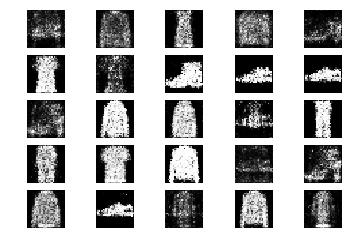

4351 [D loss: 0.623434, acc.: 68.75%] [G loss: 0.871618]
4352 [D loss: 0.572454, acc.: 71.88%] [G loss: 0.905104]
4353 [D loss: 0.688434, acc.: 54.69%] [G loss: 0.878438]
4354 [D loss: 0.636220, acc.: 67.19%] [G loss: 0.971672]
4355 [D loss: 0.638841, acc.: 60.94%] [G loss: 0.946218]
4356 [D loss: 0.681688, acc.: 51.56%] [G loss: 0.880708]
4357 [D loss: 0.667771, acc.: 59.38%] [G loss: 0.841707]
4358 [D loss: 0.601936, acc.: 62.50%] [G loss: 1.008944]
4359 [D loss: 0.554494, acc.: 73.44%] [G loss: 0.995646]
4360 [D loss: 0.593042, acc.: 68.75%] [G loss: 0.970051]
4361 [D loss: 0.579876, acc.: 68.75%] [G loss: 0.879658]
4362 [D loss: 0.648859, acc.: 62.50%] [G loss: 0.920113]
4363 [D loss: 0.641034, acc.: 67.19%] [G loss: 0.987436]
4364 [D loss: 0.536463, acc.: 76.56%] [G loss: 0.910236]
4365 [D loss: 0.568991, acc.: 67.19%] [G loss: 0.912004]
4366 [D loss: 0.550087, acc.: 76.56%] [G loss: 0.947770]
4367 [D loss: 0.666335, acc.: 60.94%] [G loss: 0.994285]
4368 [D loss: 0.693308, acc.: 5

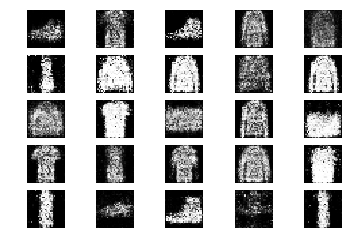

4401 [D loss: 0.634163, acc.: 60.94%] [G loss: 0.995368]
4402 [D loss: 0.605711, acc.: 60.94%] [G loss: 0.881423]
4403 [D loss: 0.641558, acc.: 57.81%] [G loss: 0.955344]
4404 [D loss: 0.624694, acc.: 64.06%] [G loss: 0.933077]
4405 [D loss: 0.608246, acc.: 64.06%] [G loss: 0.914199]
4406 [D loss: 0.603639, acc.: 71.88%] [G loss: 0.944813]
4407 [D loss: 0.600147, acc.: 68.75%] [G loss: 0.959548]
4408 [D loss: 0.630818, acc.: 59.38%] [G loss: 0.944206]
4409 [D loss: 0.658942, acc.: 60.94%] [G loss: 0.966091]
4410 [D loss: 0.650437, acc.: 53.12%] [G loss: 0.994173]
4411 [D loss: 0.564757, acc.: 73.44%] [G loss: 1.042712]
4412 [D loss: 0.623240, acc.: 60.94%] [G loss: 0.959052]
4413 [D loss: 0.602912, acc.: 59.38%] [G loss: 1.066523]
4414 [D loss: 0.737570, acc.: 54.69%] [G loss: 0.984912]
4415 [D loss: 0.584020, acc.: 64.06%] [G loss: 0.908008]
4416 [D loss: 0.634823, acc.: 65.62%] [G loss: 1.056252]
4417 [D loss: 0.652058, acc.: 60.94%] [G loss: 0.930975]
4418 [D loss: 0.641064, acc.: 5

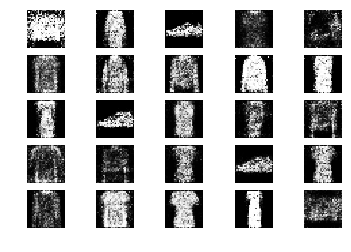

4451 [D loss: 0.663068, acc.: 60.94%] [G loss: 0.964374]
4452 [D loss: 0.615136, acc.: 60.94%] [G loss: 1.045518]
4453 [D loss: 0.660626, acc.: 57.81%] [G loss: 1.082562]
4454 [D loss: 0.709534, acc.: 50.00%] [G loss: 0.943864]
4455 [D loss: 0.714161, acc.: 50.00%] [G loss: 0.903858]
4456 [D loss: 0.682399, acc.: 57.81%] [G loss: 0.884243]
4457 [D loss: 0.645309, acc.: 57.81%] [G loss: 0.961204]
4458 [D loss: 0.524126, acc.: 71.88%] [G loss: 1.067037]
4459 [D loss: 0.624019, acc.: 62.50%] [G loss: 0.921944]
4460 [D loss: 0.559659, acc.: 68.75%] [G loss: 0.950039]
4461 [D loss: 0.601563, acc.: 57.81%] [G loss: 0.958094]
4462 [D loss: 0.661355, acc.: 54.69%] [G loss: 0.923910]
4463 [D loss: 0.679003, acc.: 59.38%] [G loss: 0.916371]
4464 [D loss: 0.597338, acc.: 65.62%] [G loss: 0.944935]
4465 [D loss: 0.626173, acc.: 67.19%] [G loss: 0.945298]
4466 [D loss: 0.637166, acc.: 60.94%] [G loss: 0.934728]
4467 [D loss: 0.631765, acc.: 65.62%] [G loss: 0.909403]
4468 [D loss: 0.654445, acc.: 7

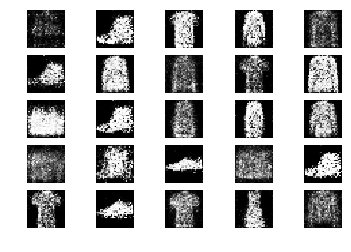

4501 [D loss: 0.649057, acc.: 64.06%] [G loss: 0.957872]
4502 [D loss: 0.597352, acc.: 67.19%] [G loss: 0.959757]
4503 [D loss: 0.593540, acc.: 68.75%] [G loss: 0.912557]
4504 [D loss: 0.611980, acc.: 59.38%] [G loss: 0.892233]
4505 [D loss: 0.689084, acc.: 56.25%] [G loss: 0.928674]
4506 [D loss: 0.608968, acc.: 57.81%] [G loss: 0.915117]
4507 [D loss: 0.640202, acc.: 65.62%] [G loss: 0.970156]
4508 [D loss: 0.602425, acc.: 71.88%] [G loss: 0.941207]
4509 [D loss: 0.577536, acc.: 67.19%] [G loss: 0.937858]
4510 [D loss: 0.601367, acc.: 71.88%] [G loss: 0.928072]
4511 [D loss: 0.631164, acc.: 59.38%] [G loss: 0.913151]
4512 [D loss: 0.631008, acc.: 62.50%] [G loss: 1.022874]
4513 [D loss: 0.625319, acc.: 67.19%] [G loss: 0.894482]
4514 [D loss: 0.665189, acc.: 57.81%] [G loss: 0.908318]
4515 [D loss: 0.615659, acc.: 65.62%] [G loss: 0.940371]
4516 [D loss: 0.620068, acc.: 60.94%] [G loss: 0.866826]
4517 [D loss: 0.612252, acc.: 70.31%] [G loss: 1.010235]
4518 [D loss: 0.563159, acc.: 7

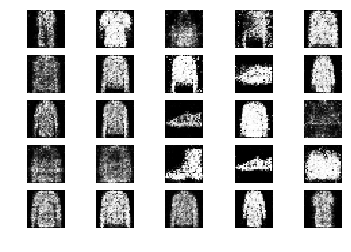

4551 [D loss: 0.661738, acc.: 53.12%] [G loss: 0.946190]
4552 [D loss: 0.620519, acc.: 67.19%] [G loss: 0.922625]
4553 [D loss: 0.524324, acc.: 79.69%] [G loss: 0.989758]
4554 [D loss: 0.718221, acc.: 46.88%] [G loss: 0.949208]
4555 [D loss: 0.639421, acc.: 65.62%] [G loss: 1.045272]
4556 [D loss: 0.598123, acc.: 71.88%] [G loss: 1.047512]
4557 [D loss: 0.638162, acc.: 64.06%] [G loss: 0.967799]
4558 [D loss: 0.633160, acc.: 67.19%] [G loss: 0.898518]
4559 [D loss: 0.674831, acc.: 62.50%] [G loss: 0.945739]
4560 [D loss: 0.664703, acc.: 57.81%] [G loss: 0.922661]
4561 [D loss: 0.593195, acc.: 68.75%] [G loss: 0.954921]
4562 [D loss: 0.586693, acc.: 65.62%] [G loss: 0.785191]
4563 [D loss: 0.559445, acc.: 75.00%] [G loss: 0.831550]
4564 [D loss: 0.779215, acc.: 40.62%] [G loss: 0.824960]
4565 [D loss: 0.552208, acc.: 71.88%] [G loss: 0.829420]
4566 [D loss: 0.646669, acc.: 67.19%] [G loss: 0.922625]
4567 [D loss: 0.648618, acc.: 64.06%] [G loss: 0.968981]
4568 [D loss: 0.663020, acc.: 5

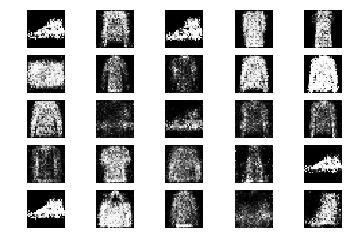

4601 [D loss: 0.691545, acc.: 51.56%] [G loss: 0.923598]
4602 [D loss: 0.704332, acc.: 54.69%] [G loss: 0.875214]
4603 [D loss: 0.613771, acc.: 64.06%] [G loss: 0.942147]
4604 [D loss: 0.597496, acc.: 73.44%] [G loss: 0.959300]
4605 [D loss: 0.629582, acc.: 62.50%] [G loss: 0.977085]
4606 [D loss: 0.639073, acc.: 62.50%] [G loss: 0.900447]
4607 [D loss: 0.599121, acc.: 68.75%] [G loss: 0.952596]
4608 [D loss: 0.632870, acc.: 68.75%] [G loss: 0.870494]
4609 [D loss: 0.746532, acc.: 42.19%] [G loss: 0.989259]
4610 [D loss: 0.647341, acc.: 56.25%] [G loss: 0.887813]
4611 [D loss: 0.714719, acc.: 53.12%] [G loss: 0.922565]
4612 [D loss: 0.650082, acc.: 62.50%] [G loss: 0.917871]
4613 [D loss: 0.628194, acc.: 64.06%] [G loss: 0.997953]
4614 [D loss: 0.594563, acc.: 62.50%] [G loss: 1.027851]
4615 [D loss: 0.670346, acc.: 65.62%] [G loss: 1.033776]
4616 [D loss: 0.666515, acc.: 46.88%] [G loss: 1.010842]
4617 [D loss: 0.636049, acc.: 67.19%] [G loss: 0.922423]
4618 [D loss: 0.612733, acc.: 6

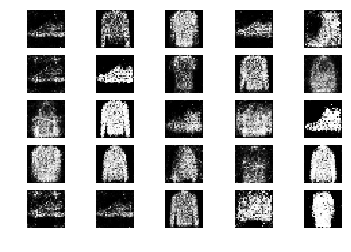

4651 [D loss: 0.649172, acc.: 70.31%] [G loss: 0.935160]
4652 [D loss: 0.639310, acc.: 59.38%] [G loss: 0.969752]
4653 [D loss: 0.631763, acc.: 59.38%] [G loss: 0.909615]
4654 [D loss: 0.617243, acc.: 64.06%] [G loss: 0.841250]
4655 [D loss: 0.656396, acc.: 65.62%] [G loss: 0.841500]
4656 [D loss: 0.704638, acc.: 60.94%] [G loss: 0.887620]
4657 [D loss: 0.609288, acc.: 65.62%] [G loss: 0.896283]
4658 [D loss: 0.608146, acc.: 65.62%] [G loss: 0.973960]
4659 [D loss: 0.652827, acc.: 67.19%] [G loss: 0.988227]
4660 [D loss: 0.603742, acc.: 71.88%] [G loss: 0.999703]
4661 [D loss: 0.654434, acc.: 64.06%] [G loss: 0.919611]
4662 [D loss: 0.582908, acc.: 75.00%] [G loss: 0.918830]
4663 [D loss: 0.677234, acc.: 56.25%] [G loss: 0.912970]
4664 [D loss: 0.643372, acc.: 60.94%] [G loss: 0.875375]
4665 [D loss: 0.606302, acc.: 70.31%] [G loss: 0.951101]
4666 [D loss: 0.672636, acc.: 51.56%] [G loss: 0.938232]
4667 [D loss: 0.656567, acc.: 64.06%] [G loss: 0.974028]
4668 [D loss: 0.590625, acc.: 7

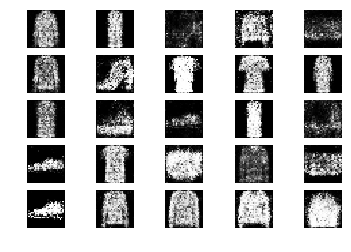

4701 [D loss: 0.594215, acc.: 67.19%] [G loss: 0.962782]
4702 [D loss: 0.607086, acc.: 65.62%] [G loss: 0.950111]
4703 [D loss: 0.616039, acc.: 68.75%] [G loss: 0.953405]
4704 [D loss: 0.653524, acc.: 67.19%] [G loss: 0.906905]
4705 [D loss: 0.582253, acc.: 73.44%] [G loss: 0.869119]
4706 [D loss: 0.588967, acc.: 73.44%] [G loss: 0.839139]
4707 [D loss: 0.573683, acc.: 67.19%] [G loss: 1.066230]
4708 [D loss: 0.746829, acc.: 62.50%] [G loss: 0.953565]
4709 [D loss: 0.603992, acc.: 68.75%] [G loss: 0.888276]
4710 [D loss: 0.667070, acc.: 65.62%] [G loss: 1.059001]
4711 [D loss: 0.715590, acc.: 59.38%] [G loss: 0.896634]
4712 [D loss: 0.609276, acc.: 71.88%] [G loss: 0.929534]
4713 [D loss: 0.654994, acc.: 57.81%] [G loss: 0.895595]
4714 [D loss: 0.650978, acc.: 62.50%] [G loss: 0.873951]
4715 [D loss: 0.695017, acc.: 53.12%] [G loss: 0.885601]
4716 [D loss: 0.660815, acc.: 59.38%] [G loss: 0.940394]
4717 [D loss: 0.615035, acc.: 67.19%] [G loss: 0.977673]
4718 [D loss: 0.621909, acc.: 5

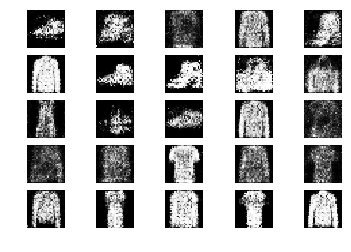

4751 [D loss: 0.667620, acc.: 62.50%] [G loss: 0.914204]
4752 [D loss: 0.666328, acc.: 64.06%] [G loss: 0.828286]
4753 [D loss: 0.568124, acc.: 68.75%] [G loss: 0.926763]
4754 [D loss: 0.577358, acc.: 70.31%] [G loss: 0.908695]
4755 [D loss: 0.637050, acc.: 65.62%] [G loss: 0.855791]
4756 [D loss: 0.564887, acc.: 68.75%] [G loss: 0.937495]
4757 [D loss: 0.650779, acc.: 62.50%] [G loss: 0.959873]
4758 [D loss: 0.639953, acc.: 65.62%] [G loss: 1.097638]
4759 [D loss: 0.713315, acc.: 57.81%] [G loss: 1.009518]
4760 [D loss: 0.656201, acc.: 57.81%] [G loss: 1.054073]
4761 [D loss: 0.638838, acc.: 71.88%] [G loss: 0.954870]
4762 [D loss: 0.680036, acc.: 53.12%] [G loss: 0.991958]
4763 [D loss: 0.698742, acc.: 48.44%] [G loss: 0.875571]
4764 [D loss: 0.646794, acc.: 60.94%] [G loss: 0.870135]
4765 [D loss: 0.708423, acc.: 51.56%] [G loss: 0.883447]
4766 [D loss: 0.657342, acc.: 54.69%] [G loss: 0.925708]
4767 [D loss: 0.670156, acc.: 64.06%] [G loss: 0.878803]
4768 [D loss: 0.653042, acc.: 6

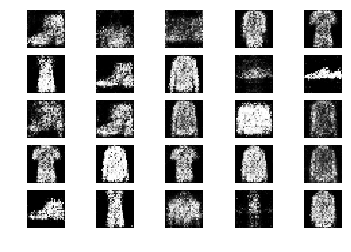

4801 [D loss: 0.644271, acc.: 59.38%] [G loss: 0.952949]
4802 [D loss: 0.665745, acc.: 64.06%] [G loss: 0.866992]
4803 [D loss: 0.589430, acc.: 73.44%] [G loss: 1.005868]
4804 [D loss: 0.690102, acc.: 57.81%] [G loss: 0.851894]
4805 [D loss: 0.688685, acc.: 64.06%] [G loss: 0.901713]
4806 [D loss: 0.639771, acc.: 64.06%] [G loss: 0.896554]
4807 [D loss: 0.677259, acc.: 48.44%] [G loss: 0.961108]
4808 [D loss: 0.611897, acc.: 67.19%] [G loss: 1.028430]
4809 [D loss: 0.572309, acc.: 71.88%] [G loss: 0.945551]
4810 [D loss: 0.579560, acc.: 73.44%] [G loss: 0.922968]
4811 [D loss: 0.619559, acc.: 56.25%] [G loss: 0.931145]
4812 [D loss: 0.606016, acc.: 62.50%] [G loss: 0.894496]
4813 [D loss: 0.596718, acc.: 76.56%] [G loss: 0.873459]
4814 [D loss: 0.642816, acc.: 60.94%] [G loss: 0.921828]
4815 [D loss: 0.676787, acc.: 57.81%] [G loss: 0.910767]
4816 [D loss: 0.585119, acc.: 70.31%] [G loss: 0.997513]
4817 [D loss: 0.599242, acc.: 71.88%] [G loss: 0.977958]
4818 [D loss: 0.658948, acc.: 5

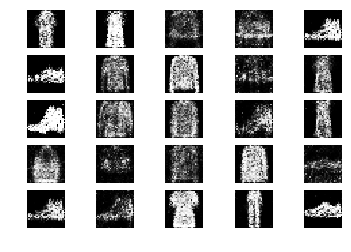

4851 [D loss: 0.700804, acc.: 59.38%] [G loss: 0.942655]
4852 [D loss: 0.613364, acc.: 65.62%] [G loss: 0.941940]
4853 [D loss: 0.641251, acc.: 68.75%] [G loss: 0.927890]
4854 [D loss: 0.601614, acc.: 60.94%] [G loss: 0.844984]
4855 [D loss: 0.659694, acc.: 54.69%] [G loss: 0.898197]
4856 [D loss: 0.592015, acc.: 70.31%] [G loss: 0.989739]
4857 [D loss: 0.636988, acc.: 62.50%] [G loss: 1.058886]
4858 [D loss: 0.643486, acc.: 65.62%] [G loss: 1.000824]
4859 [D loss: 0.630150, acc.: 64.06%] [G loss: 0.956679]
4860 [D loss: 0.684323, acc.: 64.06%] [G loss: 0.893400]
4861 [D loss: 0.653664, acc.: 65.62%] [G loss: 0.907564]
4862 [D loss: 0.640572, acc.: 60.94%] [G loss: 0.875819]
4863 [D loss: 0.595049, acc.: 71.88%] [G loss: 0.927657]
4864 [D loss: 0.662390, acc.: 64.06%] [G loss: 0.922137]
4865 [D loss: 0.631331, acc.: 64.06%] [G loss: 0.888633]
4866 [D loss: 0.582626, acc.: 73.44%] [G loss: 0.880367]
4867 [D loss: 0.685563, acc.: 59.38%] [G loss: 0.897102]
4868 [D loss: 0.621803, acc.: 6

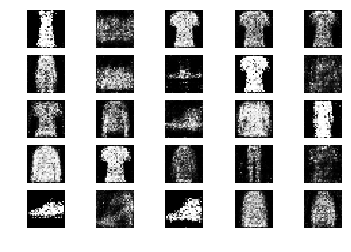

4901 [D loss: 0.655648, acc.: 59.38%] [G loss: 0.961004]
4902 [D loss: 0.647866, acc.: 64.06%] [G loss: 0.906583]
4903 [D loss: 0.543646, acc.: 76.56%] [G loss: 0.933934]
4904 [D loss: 0.637186, acc.: 65.62%] [G loss: 0.863000]
4905 [D loss: 0.602418, acc.: 68.75%] [G loss: 0.815441]
4906 [D loss: 0.578328, acc.: 73.44%] [G loss: 0.952789]
4907 [D loss: 0.564474, acc.: 76.56%] [G loss: 0.982287]
4908 [D loss: 0.682124, acc.: 59.38%] [G loss: 1.012002]
4909 [D loss: 0.618444, acc.: 68.75%] [G loss: 0.890266]
4910 [D loss: 0.617106, acc.: 67.19%] [G loss: 0.925450]
4911 [D loss: 0.687009, acc.: 57.81%] [G loss: 0.922504]
4912 [D loss: 0.588260, acc.: 68.75%] [G loss: 0.889851]
4913 [D loss: 0.613431, acc.: 64.06%] [G loss: 0.876161]
4914 [D loss: 0.581615, acc.: 71.88%] [G loss: 0.938580]
4915 [D loss: 0.669486, acc.: 50.00%] [G loss: 0.879880]
4916 [D loss: 0.590761, acc.: 68.75%] [G loss: 0.922216]
4917 [D loss: 0.677829, acc.: 57.81%] [G loss: 0.867689]
4918 [D loss: 0.683244, acc.: 5

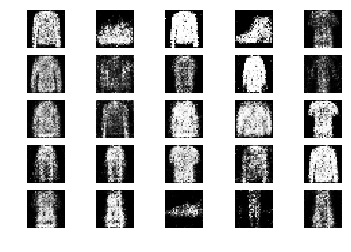

4951 [D loss: 0.650908, acc.: 64.06%] [G loss: 0.942563]
4952 [D loss: 0.628767, acc.: 60.94%] [G loss: 0.883628]
4953 [D loss: 0.610934, acc.: 71.88%] [G loss: 0.911143]
4954 [D loss: 0.610538, acc.: 67.19%] [G loss: 0.941323]
4955 [D loss: 0.587108, acc.: 71.88%] [G loss: 0.863030]
4956 [D loss: 0.679002, acc.: 62.50%] [G loss: 0.901264]
4957 [D loss: 0.657907, acc.: 53.12%] [G loss: 0.919095]
4958 [D loss: 0.647326, acc.: 60.94%] [G loss: 0.966828]
4959 [D loss: 0.636160, acc.: 62.50%] [G loss: 0.942792]
4960 [D loss: 0.624697, acc.: 62.50%] [G loss: 0.848134]
4961 [D loss: 0.680056, acc.: 59.38%] [G loss: 0.953038]
4962 [D loss: 0.613347, acc.: 64.06%] [G loss: 0.845506]
4963 [D loss: 0.691199, acc.: 64.06%] [G loss: 0.950251]
4964 [D loss: 0.612749, acc.: 68.75%] [G loss: 0.932077]
4965 [D loss: 0.623483, acc.: 64.06%] [G loss: 0.976396]
4966 [D loss: 0.609987, acc.: 62.50%] [G loss: 0.987283]
4967 [D loss: 0.614162, acc.: 65.62%] [G loss: 0.919083]
4968 [D loss: 0.676789, acc.: 5

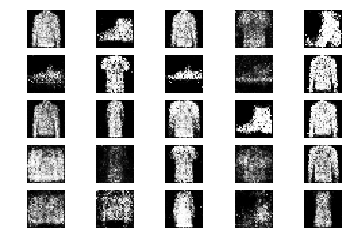

5001 [D loss: 0.687492, acc.: 53.12%] [G loss: 0.870192]
5002 [D loss: 0.602761, acc.: 60.94%] [G loss: 0.894727]
5003 [D loss: 0.598846, acc.: 68.75%] [G loss: 0.910137]
5004 [D loss: 0.673784, acc.: 59.38%] [G loss: 0.870817]
5005 [D loss: 0.685283, acc.: 54.69%] [G loss: 0.889710]
5006 [D loss: 0.653572, acc.: 57.81%] [G loss: 0.875067]
5007 [D loss: 0.600935, acc.: 71.88%] [G loss: 0.973451]
5008 [D loss: 0.672039, acc.: 54.69%] [G loss: 0.945733]
5009 [D loss: 0.691191, acc.: 57.81%] [G loss: 0.866686]
5010 [D loss: 0.615525, acc.: 65.62%] [G loss: 0.858609]
5011 [D loss: 0.694119, acc.: 56.25%] [G loss: 0.874685]
5012 [D loss: 0.594515, acc.: 70.31%] [G loss: 0.865151]
5013 [D loss: 0.653948, acc.: 60.94%] [G loss: 0.917312]
5014 [D loss: 0.543136, acc.: 76.56%] [G loss: 0.959967]
5015 [D loss: 0.590460, acc.: 65.62%] [G loss: 0.899006]
5016 [D loss: 0.632969, acc.: 64.06%] [G loss: 0.957877]
5017 [D loss: 0.648654, acc.: 57.81%] [G loss: 0.912665]
5018 [D loss: 0.625208, acc.: 6

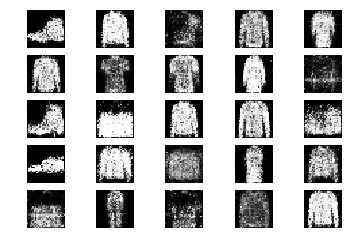

5051 [D loss: 0.639598, acc.: 62.50%] [G loss: 0.935428]
5052 [D loss: 0.589417, acc.: 68.75%] [G loss: 0.975799]
5053 [D loss: 0.651837, acc.: 59.38%] [G loss: 0.878435]
5054 [D loss: 0.629352, acc.: 68.75%] [G loss: 0.931118]
5055 [D loss: 0.643975, acc.: 65.62%] [G loss: 0.920450]
5056 [D loss: 0.587111, acc.: 70.31%] [G loss: 0.908000]
5057 [D loss: 0.591080, acc.: 71.88%] [G loss: 0.975376]
5058 [D loss: 0.622175, acc.: 71.88%] [G loss: 0.854855]
5059 [D loss: 0.675706, acc.: 60.94%] [G loss: 0.907090]
5060 [D loss: 0.642998, acc.: 60.94%] [G loss: 0.881738]
5061 [D loss: 0.638134, acc.: 67.19%] [G loss: 0.931765]
5062 [D loss: 0.605394, acc.: 67.19%] [G loss: 0.914685]
5063 [D loss: 0.692695, acc.: 54.69%] [G loss: 0.900812]
5064 [D loss: 0.637199, acc.: 64.06%] [G loss: 1.014695]
5065 [D loss: 0.668010, acc.: 54.69%] [G loss: 0.927242]
5066 [D loss: 0.637624, acc.: 65.62%] [G loss: 0.952765]
5067 [D loss: 0.583431, acc.: 70.31%] [G loss: 0.968549]
5068 [D loss: 0.695595, acc.: 6

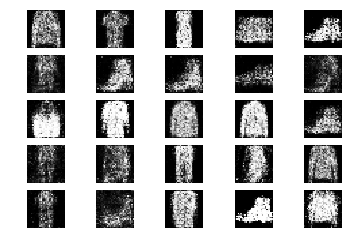

5101 [D loss: 0.602287, acc.: 70.31%] [G loss: 0.898968]
5102 [D loss: 0.597609, acc.: 62.50%] [G loss: 0.910322]
5103 [D loss: 0.706307, acc.: 48.44%] [G loss: 0.975017]
5104 [D loss: 0.667147, acc.: 59.38%] [G loss: 1.016109]
5105 [D loss: 0.628387, acc.: 60.94%] [G loss: 0.981702]
5106 [D loss: 0.552062, acc.: 76.56%] [G loss: 1.027520]
5107 [D loss: 0.706839, acc.: 51.56%] [G loss: 1.000800]
5108 [D loss: 0.670138, acc.: 57.81%] [G loss: 1.017005]
5109 [D loss: 0.545042, acc.: 75.00%] [G loss: 0.937349]
5110 [D loss: 0.613456, acc.: 76.56%] [G loss: 0.980398]
5111 [D loss: 0.653175, acc.: 62.50%] [G loss: 0.893774]
5112 [D loss: 0.587724, acc.: 76.56%] [G loss: 0.938876]
5113 [D loss: 0.660048, acc.: 56.25%] [G loss: 0.973089]
5114 [D loss: 0.654368, acc.: 59.38%] [G loss: 0.937533]
5115 [D loss: 0.606051, acc.: 70.31%] [G loss: 0.842688]
5116 [D loss: 0.667558, acc.: 59.38%] [G loss: 0.916107]
5117 [D loss: 0.563397, acc.: 76.56%] [G loss: 0.974305]
5118 [D loss: 0.596446, acc.: 6

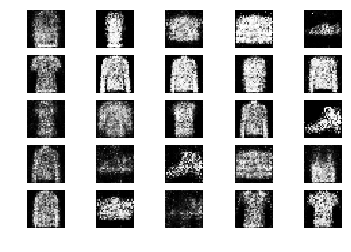

5151 [D loss: 0.613273, acc.: 70.31%] [G loss: 0.880879]
5152 [D loss: 0.703315, acc.: 53.12%] [G loss: 0.840570]
5153 [D loss: 0.539040, acc.: 73.44%] [G loss: 0.859834]
5154 [D loss: 0.610788, acc.: 64.06%] [G loss: 0.801480]
5155 [D loss: 0.674383, acc.: 54.69%] [G loss: 0.937769]
5156 [D loss: 0.607824, acc.: 68.75%] [G loss: 0.936710]
5157 [D loss: 0.693230, acc.: 56.25%] [G loss: 0.864841]
5158 [D loss: 0.562435, acc.: 71.88%] [G loss: 0.926371]
5159 [D loss: 0.637568, acc.: 70.31%] [G loss: 0.900565]
5160 [D loss: 0.590660, acc.: 71.88%] [G loss: 0.929996]
5161 [D loss: 0.622679, acc.: 67.19%] [G loss: 0.983999]
5162 [D loss: 0.600205, acc.: 71.88%] [G loss: 0.921800]
5163 [D loss: 0.592626, acc.: 67.19%] [G loss: 0.998123]
5164 [D loss: 0.650308, acc.: 67.19%] [G loss: 0.922083]
5165 [D loss: 0.602957, acc.: 75.00%] [G loss: 1.040259]
5166 [D loss: 0.591778, acc.: 70.31%] [G loss: 0.935392]
5167 [D loss: 0.610559, acc.: 67.19%] [G loss: 1.051144]
5168 [D loss: 0.626278, acc.: 6

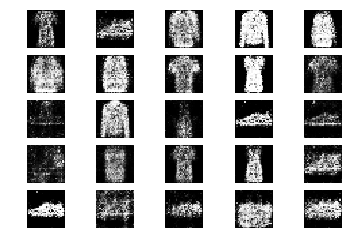

5201 [D loss: 0.544555, acc.: 70.31%] [G loss: 0.976833]
5202 [D loss: 0.625138, acc.: 65.62%] [G loss: 0.983949]
5203 [D loss: 0.639853, acc.: 60.94%] [G loss: 1.041683]
5204 [D loss: 0.592594, acc.: 70.31%] [G loss: 1.004448]
5205 [D loss: 0.613379, acc.: 70.31%] [G loss: 0.906197]
5206 [D loss: 0.574491, acc.: 67.19%] [G loss: 0.966183]
5207 [D loss: 0.671858, acc.: 64.06%] [G loss: 0.896626]
5208 [D loss: 0.710491, acc.: 54.69%] [G loss: 0.939992]
5209 [D loss: 0.601518, acc.: 60.94%] [G loss: 0.973776]
5210 [D loss: 0.600088, acc.: 70.31%] [G loss: 0.900726]
5211 [D loss: 0.612575, acc.: 68.75%] [G loss: 0.907617]
5212 [D loss: 0.669769, acc.: 50.00%] [G loss: 0.956280]
5213 [D loss: 0.629982, acc.: 60.94%] [G loss: 1.004465]
5214 [D loss: 0.612702, acc.: 60.94%] [G loss: 1.020470]
5215 [D loss: 0.574362, acc.: 73.44%] [G loss: 0.978946]
5216 [D loss: 0.637358, acc.: 62.50%] [G loss: 0.928520]
5217 [D loss: 0.670534, acc.: 60.94%] [G loss: 0.876982]
5218 [D loss: 0.639785, acc.: 6

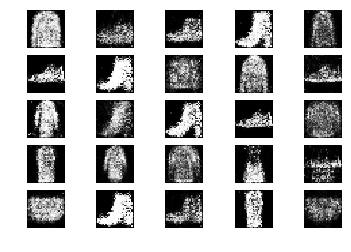

5251 [D loss: 0.629172, acc.: 67.19%] [G loss: 0.972286]
5252 [D loss: 0.642858, acc.: 65.62%] [G loss: 0.882319]
5253 [D loss: 0.627375, acc.: 68.75%] [G loss: 0.964791]
5254 [D loss: 0.629752, acc.: 65.62%] [G loss: 0.895014]
5255 [D loss: 0.595459, acc.: 70.31%] [G loss: 0.878492]
5256 [D loss: 0.679236, acc.: 57.81%] [G loss: 0.866415]
5257 [D loss: 0.625966, acc.: 67.19%] [G loss: 0.944778]
5258 [D loss: 0.629657, acc.: 62.50%] [G loss: 0.989475]
5259 [D loss: 0.622485, acc.: 65.62%] [G loss: 0.959488]
5260 [D loss: 0.610702, acc.: 68.75%] [G loss: 0.912368]
5261 [D loss: 0.722676, acc.: 56.25%] [G loss: 0.974752]
5262 [D loss: 0.606452, acc.: 70.31%] [G loss: 0.990036]
5263 [D loss: 0.641864, acc.: 62.50%] [G loss: 0.947880]
5264 [D loss: 0.659805, acc.: 59.38%] [G loss: 0.867066]
5265 [D loss: 0.639919, acc.: 59.38%] [G loss: 0.941659]
5266 [D loss: 0.644693, acc.: 62.50%] [G loss: 0.919867]
5267 [D loss: 0.607982, acc.: 65.62%] [G loss: 1.029290]
5268 [D loss: 0.673889, acc.: 6

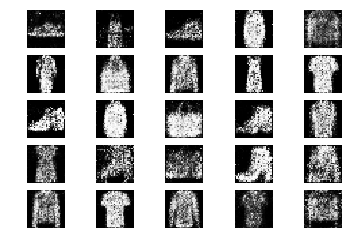

5301 [D loss: 0.612478, acc.: 67.19%] [G loss: 0.946836]
5302 [D loss: 0.648854, acc.: 56.25%] [G loss: 0.916662]
5303 [D loss: 0.647687, acc.: 62.50%] [G loss: 0.991772]
5304 [D loss: 0.564776, acc.: 68.75%] [G loss: 0.962832]
5305 [D loss: 0.659930, acc.: 62.50%] [G loss: 0.862628]
5306 [D loss: 0.662267, acc.: 62.50%] [G loss: 0.905882]
5307 [D loss: 0.699429, acc.: 50.00%] [G loss: 1.035230]
5308 [D loss: 0.606712, acc.: 67.19%] [G loss: 0.935400]
5309 [D loss: 0.556529, acc.: 70.31%] [G loss: 0.953711]
5310 [D loss: 0.707594, acc.: 59.38%] [G loss: 0.968905]
5311 [D loss: 0.668314, acc.: 60.94%] [G loss: 1.016423]
5312 [D loss: 0.636396, acc.: 65.62%] [G loss: 0.992926]
5313 [D loss: 0.668894, acc.: 60.94%] [G loss: 1.059080]
5314 [D loss: 0.622839, acc.: 65.62%] [G loss: 1.039367]
5315 [D loss: 0.612449, acc.: 68.75%] [G loss: 0.948867]
5316 [D loss: 0.665486, acc.: 64.06%] [G loss: 0.882433]
5317 [D loss: 0.649222, acc.: 60.94%] [G loss: 0.972066]
5318 [D loss: 0.639973, acc.: 5

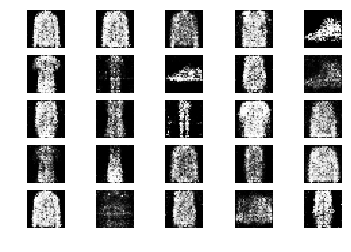

5351 [D loss: 0.662377, acc.: 56.25%] [G loss: 0.962088]
5352 [D loss: 0.635464, acc.: 65.62%] [G loss: 1.003007]
5353 [D loss: 0.694213, acc.: 48.44%] [G loss: 0.973596]
5354 [D loss: 0.632024, acc.: 60.94%] [G loss: 0.876127]
5355 [D loss: 0.638241, acc.: 62.50%] [G loss: 0.902881]
5356 [D loss: 0.574022, acc.: 68.75%] [G loss: 0.956123]
5357 [D loss: 0.545870, acc.: 81.25%] [G loss: 0.921183]
5358 [D loss: 0.696983, acc.: 50.00%] [G loss: 0.875511]
5359 [D loss: 0.730548, acc.: 51.56%] [G loss: 0.857935]
5360 [D loss: 0.604775, acc.: 71.88%] [G loss: 0.880236]
5361 [D loss: 0.628735, acc.: 62.50%] [G loss: 0.948278]
5362 [D loss: 0.599422, acc.: 71.88%] [G loss: 0.952435]
5363 [D loss: 0.600918, acc.: 65.62%] [G loss: 1.011682]
5364 [D loss: 0.607753, acc.: 70.31%] [G loss: 0.981119]
5365 [D loss: 0.664380, acc.: 59.38%] [G loss: 0.935201]
5366 [D loss: 0.616077, acc.: 67.19%] [G loss: 1.039648]
5367 [D loss: 0.597719, acc.: 70.31%] [G loss: 0.947103]
5368 [D loss: 0.612851, acc.: 6

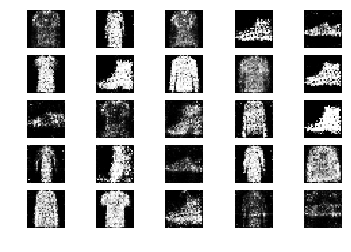

5401 [D loss: 0.653306, acc.: 64.06%] [G loss: 0.960266]
5402 [D loss: 0.624333, acc.: 64.06%] [G loss: 0.964458]
5403 [D loss: 0.651123, acc.: 56.25%] [G loss: 0.958230]
5404 [D loss: 0.591006, acc.: 70.31%] [G loss: 0.933254]
5405 [D loss: 0.639704, acc.: 65.62%] [G loss: 0.904994]
5406 [D loss: 0.660411, acc.: 56.25%] [G loss: 0.946721]
5407 [D loss: 0.668668, acc.: 57.81%] [G loss: 0.890067]
5408 [D loss: 0.639974, acc.: 59.38%] [G loss: 0.931396]
5409 [D loss: 0.655476, acc.: 59.38%] [G loss: 0.958156]
5410 [D loss: 0.622536, acc.: 68.75%] [G loss: 0.886066]
5411 [D loss: 0.670856, acc.: 56.25%] [G loss: 0.879519]
5412 [D loss: 0.614386, acc.: 73.44%] [G loss: 0.912594]
5413 [D loss: 0.605370, acc.: 67.19%] [G loss: 0.906896]
5414 [D loss: 0.644702, acc.: 60.94%] [G loss: 0.917447]
5415 [D loss: 0.623207, acc.: 60.94%] [G loss: 0.902083]
5416 [D loss: 0.685451, acc.: 59.38%] [G loss: 0.927806]
5417 [D loss: 0.609509, acc.: 68.75%] [G loss: 0.826637]
5418 [D loss: 0.675938, acc.: 6

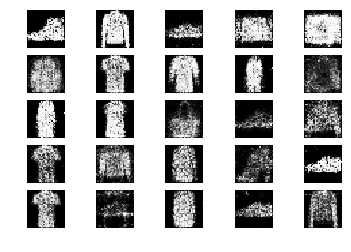

5451 [D loss: 0.671724, acc.: 54.69%] [G loss: 0.952232]
5452 [D loss: 0.689246, acc.: 57.81%] [G loss: 0.927422]
5453 [D loss: 0.632355, acc.: 65.62%] [G loss: 0.887985]
5454 [D loss: 0.728107, acc.: 53.12%] [G loss: 1.020402]
5455 [D loss: 0.652672, acc.: 56.25%] [G loss: 0.931786]
5456 [D loss: 0.646200, acc.: 62.50%] [G loss: 0.865613]
5457 [D loss: 0.691964, acc.: 59.38%] [G loss: 0.881791]
5458 [D loss: 0.629683, acc.: 60.94%] [G loss: 0.960462]
5459 [D loss: 0.654654, acc.: 57.81%] [G loss: 0.877799]
5460 [D loss: 0.668907, acc.: 62.50%] [G loss: 0.926244]
5461 [D loss: 0.638661, acc.: 64.06%] [G loss: 0.992965]
5462 [D loss: 0.645626, acc.: 56.25%] [G loss: 0.972479]
5463 [D loss: 0.656448, acc.: 59.38%] [G loss: 0.953587]
5464 [D loss: 0.667926, acc.: 54.69%] [G loss: 0.861762]
5465 [D loss: 0.705735, acc.: 60.94%] [G loss: 0.888527]
5466 [D loss: 0.630928, acc.: 71.88%] [G loss: 0.978620]
5467 [D loss: 0.630835, acc.: 62.50%] [G loss: 1.007967]
5468 [D loss: 0.659344, acc.: 6

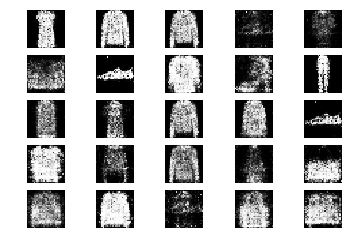

5501 [D loss: 0.620555, acc.: 62.50%] [G loss: 0.876849]
5502 [D loss: 0.643036, acc.: 54.69%] [G loss: 0.842955]
5503 [D loss: 0.652266, acc.: 60.94%] [G loss: 0.888118]
5504 [D loss: 0.651101, acc.: 56.25%] [G loss: 0.886801]
5505 [D loss: 0.683065, acc.: 56.25%] [G loss: 0.968411]
5506 [D loss: 0.649725, acc.: 60.94%] [G loss: 0.929541]
5507 [D loss: 0.690516, acc.: 57.81%] [G loss: 0.966133]
5508 [D loss: 0.663508, acc.: 57.81%] [G loss: 0.927379]
5509 [D loss: 0.647423, acc.: 59.38%] [G loss: 0.936146]
5510 [D loss: 0.638714, acc.: 62.50%] [G loss: 0.924891]
5511 [D loss: 0.606931, acc.: 70.31%] [G loss: 0.911263]
5512 [D loss: 0.656171, acc.: 57.81%] [G loss: 0.896293]
5513 [D loss: 0.682349, acc.: 65.62%] [G loss: 0.915748]
5514 [D loss: 0.592896, acc.: 68.75%] [G loss: 0.927435]
5515 [D loss: 0.640747, acc.: 56.25%] [G loss: 0.840730]
5516 [D loss: 0.600553, acc.: 67.19%] [G loss: 0.884202]
5517 [D loss: 0.645946, acc.: 65.62%] [G loss: 0.887658]
5518 [D loss: 0.629997, acc.: 5

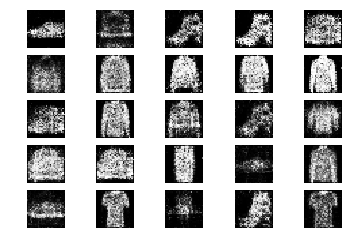

5551 [D loss: 0.623171, acc.: 64.06%] [G loss: 0.921407]
5552 [D loss: 0.634263, acc.: 68.75%] [G loss: 0.926471]
5553 [D loss: 0.669525, acc.: 64.06%] [G loss: 0.990168]
5554 [D loss: 0.620474, acc.: 68.75%] [G loss: 0.906850]
5555 [D loss: 0.687450, acc.: 57.81%] [G loss: 0.881925]
5556 [D loss: 0.654545, acc.: 62.50%] [G loss: 0.893775]
5557 [D loss: 0.635063, acc.: 62.50%] [G loss: 0.842598]
5558 [D loss: 0.622443, acc.: 68.75%] [G loss: 0.877941]
5559 [D loss: 0.697045, acc.: 59.38%] [G loss: 0.867236]
5560 [D loss: 0.606958, acc.: 68.75%] [G loss: 0.945244]
5561 [D loss: 0.664027, acc.: 53.12%] [G loss: 0.830272]
5562 [D loss: 0.609244, acc.: 62.50%] [G loss: 0.926212]
5563 [D loss: 0.652095, acc.: 64.06%] [G loss: 0.876389]
5564 [D loss: 0.638898, acc.: 59.38%] [G loss: 0.905855]
5565 [D loss: 0.682715, acc.: 48.44%] [G loss: 0.842317]
5566 [D loss: 0.658762, acc.: 57.81%] [G loss: 0.910469]
5567 [D loss: 0.618046, acc.: 65.62%] [G loss: 0.902319]
5568 [D loss: 0.630184, acc.: 6

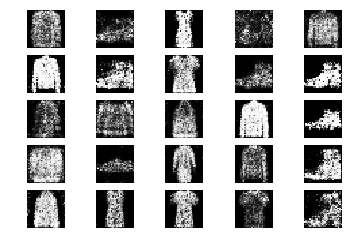

5601 [D loss: 0.637578, acc.: 64.06%] [G loss: 0.972976]
5602 [D loss: 0.647446, acc.: 59.38%] [G loss: 0.930544]
5603 [D loss: 0.609960, acc.: 62.50%] [G loss: 0.960270]
5604 [D loss: 0.619385, acc.: 65.62%] [G loss: 0.963986]
5605 [D loss: 0.654732, acc.: 64.06%] [G loss: 0.986342]
5606 [D loss: 0.646979, acc.: 62.50%] [G loss: 0.847443]
5607 [D loss: 0.692883, acc.: 57.81%] [G loss: 0.881578]
5608 [D loss: 0.690193, acc.: 56.25%] [G loss: 0.982857]
5609 [D loss: 0.645402, acc.: 62.50%] [G loss: 0.832957]
5610 [D loss: 0.627596, acc.: 64.06%] [G loss: 0.961553]
5611 [D loss: 0.657925, acc.: 59.38%] [G loss: 0.881254]
5612 [D loss: 0.633071, acc.: 67.19%] [G loss: 0.934812]
5613 [D loss: 0.540786, acc.: 75.00%] [G loss: 0.946728]
5614 [D loss: 0.731162, acc.: 53.12%] [G loss: 0.915237]
5615 [D loss: 0.704686, acc.: 51.56%] [G loss: 0.906187]
5616 [D loss: 0.566031, acc.: 70.31%] [G loss: 0.972331]
5617 [D loss: 0.657722, acc.: 59.38%] [G loss: 0.942515]
5618 [D loss: 0.581120, acc.: 7

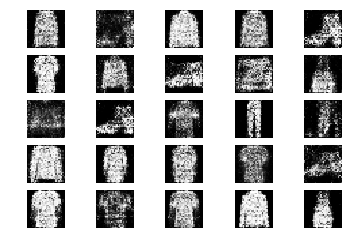

5651 [D loss: 0.671006, acc.: 59.38%] [G loss: 0.915408]
5652 [D loss: 0.650664, acc.: 56.25%] [G loss: 0.936902]
5653 [D loss: 0.566808, acc.: 76.56%] [G loss: 0.907604]
5654 [D loss: 0.636500, acc.: 65.62%] [G loss: 0.893819]
5655 [D loss: 0.618156, acc.: 64.06%] [G loss: 0.973057]
5656 [D loss: 0.645578, acc.: 67.19%] [G loss: 0.905454]
5657 [D loss: 0.592148, acc.: 71.88%] [G loss: 0.909362]
5658 [D loss: 0.637667, acc.: 53.12%] [G loss: 0.882700]
5659 [D loss: 0.710176, acc.: 60.94%] [G loss: 0.872818]
5660 [D loss: 0.574178, acc.: 70.31%] [G loss: 0.997032]
5661 [D loss: 0.556091, acc.: 71.88%] [G loss: 0.997881]
5662 [D loss: 0.664443, acc.: 60.94%] [G loss: 1.000318]
5663 [D loss: 0.680394, acc.: 60.94%] [G loss: 0.924477]
5664 [D loss: 0.608531, acc.: 65.62%] [G loss: 1.055669]
5665 [D loss: 0.659484, acc.: 60.94%] [G loss: 0.947026]
5666 [D loss: 0.645869, acc.: 64.06%] [G loss: 0.991046]
5667 [D loss: 0.705785, acc.: 46.88%] [G loss: 0.891911]
5668 [D loss: 0.605242, acc.: 6

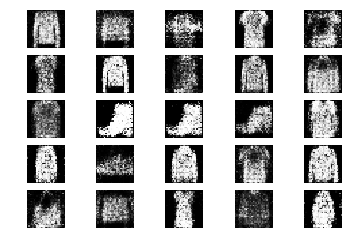

5701 [D loss: 0.661481, acc.: 64.06%] [G loss: 0.874235]
5702 [D loss: 0.685841, acc.: 56.25%] [G loss: 0.928264]
5703 [D loss: 0.659147, acc.: 59.38%] [G loss: 0.911792]
5704 [D loss: 0.647278, acc.: 60.94%] [G loss: 0.944159]
5705 [D loss: 0.665181, acc.: 60.94%] [G loss: 0.999523]
5706 [D loss: 0.643633, acc.: 56.25%] [G loss: 0.943722]
5707 [D loss: 0.723410, acc.: 43.75%] [G loss: 0.827351]
5708 [D loss: 0.605479, acc.: 67.19%] [G loss: 0.836029]
5709 [D loss: 0.562964, acc.: 75.00%] [G loss: 0.855245]
5710 [D loss: 0.672062, acc.: 57.81%] [G loss: 0.905221]
5711 [D loss: 0.611720, acc.: 59.38%] [G loss: 0.907205]
5712 [D loss: 0.673074, acc.: 53.12%] [G loss: 0.925852]
5713 [D loss: 0.640001, acc.: 62.50%] [G loss: 0.978859]
5714 [D loss: 0.665932, acc.: 64.06%] [G loss: 0.919546]
5715 [D loss: 0.645617, acc.: 62.50%] [G loss: 0.949530]
5716 [D loss: 0.558666, acc.: 73.44%] [G loss: 0.918270]
5717 [D loss: 0.668496, acc.: 59.38%] [G loss: 0.919242]
5718 [D loss: 0.701805, acc.: 6

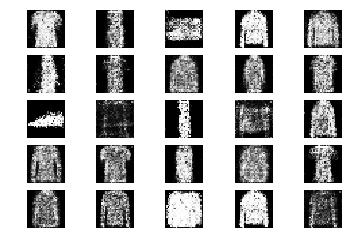

5751 [D loss: 0.607667, acc.: 64.06%] [G loss: 0.963802]
5752 [D loss: 0.631863, acc.: 73.44%] [G loss: 1.031875]
5753 [D loss: 0.680834, acc.: 68.75%] [G loss: 1.021162]
5754 [D loss: 0.539884, acc.: 75.00%] [G loss: 0.922446]
5755 [D loss: 0.661745, acc.: 54.69%] [G loss: 0.892056]
5756 [D loss: 0.647606, acc.: 57.81%] [G loss: 0.819655]
5757 [D loss: 0.670361, acc.: 53.12%] [G loss: 0.865460]
5758 [D loss: 0.611876, acc.: 68.75%] [G loss: 0.951576]
5759 [D loss: 0.576692, acc.: 75.00%] [G loss: 0.886453]
5760 [D loss: 0.641661, acc.: 60.94%] [G loss: 0.896677]
5761 [D loss: 0.683898, acc.: 54.69%] [G loss: 0.841762]
5762 [D loss: 0.613351, acc.: 65.62%] [G loss: 0.952029]
5763 [D loss: 0.594194, acc.: 67.19%] [G loss: 0.962486]
5764 [D loss: 0.662583, acc.: 64.06%] [G loss: 0.942684]
5765 [D loss: 0.669324, acc.: 51.56%] [G loss: 0.863308]
5766 [D loss: 0.688971, acc.: 59.38%] [G loss: 0.892841]
5767 [D loss: 0.594604, acc.: 70.31%] [G loss: 0.932084]
5768 [D loss: 0.654036, acc.: 6

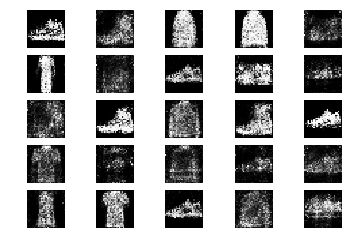

5801 [D loss: 0.646972, acc.: 64.06%] [G loss: 0.943555]
5802 [D loss: 0.586496, acc.: 70.31%] [G loss: 0.874332]
5803 [D loss: 0.654784, acc.: 59.38%] [G loss: 0.981463]
5804 [D loss: 0.613645, acc.: 62.50%] [G loss: 1.032634]
5805 [D loss: 0.754758, acc.: 46.88%] [G loss: 0.916288]
5806 [D loss: 0.624602, acc.: 65.62%] [G loss: 0.922987]
5807 [D loss: 0.657052, acc.: 59.38%] [G loss: 0.897766]
5808 [D loss: 0.680387, acc.: 59.38%] [G loss: 0.850722]
5809 [D loss: 0.530152, acc.: 76.56%] [G loss: 0.922837]
5810 [D loss: 0.665207, acc.: 53.12%] [G loss: 0.858417]
5811 [D loss: 0.642360, acc.: 64.06%] [G loss: 1.023064]
5812 [D loss: 0.691773, acc.: 56.25%] [G loss: 0.895853]
5813 [D loss: 0.609361, acc.: 67.19%] [G loss: 0.975519]
5814 [D loss: 0.657226, acc.: 56.25%] [G loss: 0.932471]
5815 [D loss: 0.647756, acc.: 60.94%] [G loss: 1.065994]
5816 [D loss: 0.682559, acc.: 57.81%] [G loss: 0.934048]
5817 [D loss: 0.596213, acc.: 62.50%] [G loss: 0.980365]
5818 [D loss: 0.718825, acc.: 5

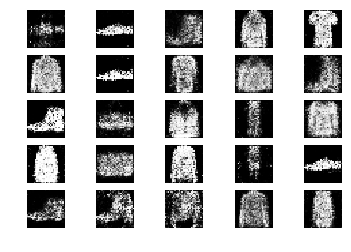

5851 [D loss: 0.675432, acc.: 57.81%] [G loss: 0.973248]
5852 [D loss: 0.620644, acc.: 65.62%] [G loss: 0.957919]
5853 [D loss: 0.673479, acc.: 57.81%] [G loss: 1.025486]
5854 [D loss: 0.644030, acc.: 60.94%] [G loss: 0.938435]
5855 [D loss: 0.601810, acc.: 65.62%] [G loss: 0.892757]
5856 [D loss: 0.641126, acc.: 67.19%] [G loss: 0.895371]
5857 [D loss: 0.612915, acc.: 65.62%] [G loss: 0.973159]
5858 [D loss: 0.627161, acc.: 59.38%] [G loss: 0.991745]
5859 [D loss: 0.606645, acc.: 57.81%] [G loss: 0.962064]
5860 [D loss: 0.622838, acc.: 62.50%] [G loss: 0.871700]
5861 [D loss: 0.609175, acc.: 59.38%] [G loss: 1.015524]
5862 [D loss: 0.568809, acc.: 70.31%] [G loss: 1.013517]
5863 [D loss: 0.618226, acc.: 68.75%] [G loss: 1.003785]
5864 [D loss: 0.696268, acc.: 62.50%] [G loss: 0.967182]
5865 [D loss: 0.547746, acc.: 71.88%] [G loss: 0.954413]
5866 [D loss: 0.707593, acc.: 48.44%] [G loss: 0.897278]
5867 [D loss: 0.636112, acc.: 62.50%] [G loss: 1.071337]
5868 [D loss: 0.622917, acc.: 6

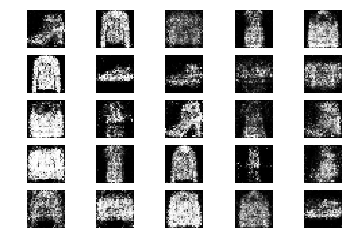

5901 [D loss: 0.695613, acc.: 62.50%] [G loss: 0.925351]
5902 [D loss: 0.630051, acc.: 64.06%] [G loss: 0.893877]
5903 [D loss: 0.696736, acc.: 59.38%] [G loss: 0.933017]
5904 [D loss: 0.598804, acc.: 62.50%] [G loss: 0.952043]
5905 [D loss: 0.614896, acc.: 68.75%] [G loss: 0.924445]
5906 [D loss: 0.598002, acc.: 65.62%] [G loss: 0.972746]
5907 [D loss: 0.633780, acc.: 67.19%] [G loss: 0.956384]
5908 [D loss: 0.612013, acc.: 68.75%] [G loss: 0.988810]
5909 [D loss: 0.612345, acc.: 68.75%] [G loss: 0.964913]
5910 [D loss: 0.676351, acc.: 56.25%] [G loss: 0.984786]
5911 [D loss: 0.643525, acc.: 65.62%] [G loss: 0.936114]
5912 [D loss: 0.645915, acc.: 51.56%] [G loss: 0.938788]
5913 [D loss: 0.697936, acc.: 46.88%] [G loss: 0.948867]
5914 [D loss: 0.723575, acc.: 48.44%] [G loss: 0.869962]
5915 [D loss: 0.566037, acc.: 73.44%] [G loss: 0.923112]
5916 [D loss: 0.653003, acc.: 64.06%] [G loss: 0.868589]
5917 [D loss: 0.658355, acc.: 56.25%] [G loss: 0.908458]
5918 [D loss: 0.642253, acc.: 6

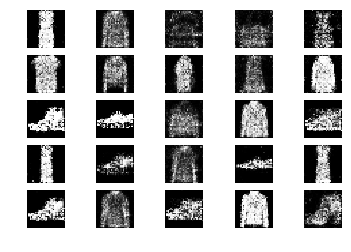

5951 [D loss: 0.729493, acc.: 42.19%] [G loss: 1.021640]
5952 [D loss: 0.654050, acc.: 65.62%] [G loss: 0.881135]
5953 [D loss: 0.665307, acc.: 59.38%] [G loss: 0.936506]
5954 [D loss: 0.582060, acc.: 67.19%] [G loss: 0.962054]
5955 [D loss: 0.614703, acc.: 65.62%] [G loss: 0.919540]
5956 [D loss: 0.572680, acc.: 71.88%] [G loss: 0.930709]
5957 [D loss: 0.666442, acc.: 59.38%] [G loss: 0.910731]
5958 [D loss: 0.710721, acc.: 56.25%] [G loss: 0.872178]
5959 [D loss: 0.595557, acc.: 68.75%] [G loss: 0.853278]
5960 [D loss: 0.653908, acc.: 59.38%] [G loss: 0.968842]
5961 [D loss: 0.598494, acc.: 60.94%] [G loss: 0.949059]
5962 [D loss: 0.639553, acc.: 70.31%] [G loss: 0.939660]
5963 [D loss: 0.631518, acc.: 62.50%] [G loss: 0.855024]
5964 [D loss: 0.696491, acc.: 56.25%] [G loss: 0.863546]
5965 [D loss: 0.574171, acc.: 67.19%] [G loss: 0.966950]
5966 [D loss: 0.574842, acc.: 70.31%] [G loss: 0.964590]
5967 [D loss: 0.675295, acc.: 57.81%] [G loss: 0.973726]
5968 [D loss: 0.614437, acc.: 7

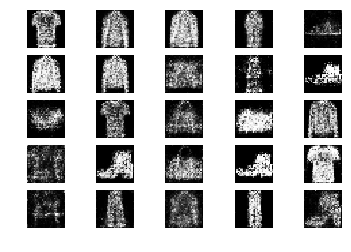

6001 [D loss: 0.605426, acc.: 78.12%] [G loss: 1.005338]
6002 [D loss: 0.640360, acc.: 70.31%] [G loss: 0.997133]
6003 [D loss: 0.619358, acc.: 65.62%] [G loss: 0.970303]
6004 [D loss: 0.663866, acc.: 59.38%] [G loss: 0.885688]
6005 [D loss: 0.629773, acc.: 67.19%] [G loss: 0.940124]
6006 [D loss: 0.656619, acc.: 56.25%] [G loss: 0.917133]
6007 [D loss: 0.598651, acc.: 75.00%] [G loss: 0.962161]
6008 [D loss: 0.640453, acc.: 57.81%] [G loss: 0.990155]
6009 [D loss: 0.610455, acc.: 65.62%] [G loss: 0.819922]
6010 [D loss: 0.743295, acc.: 40.62%] [G loss: 0.916237]
6011 [D loss: 0.679400, acc.: 56.25%] [G loss: 0.942078]
6012 [D loss: 0.603536, acc.: 65.62%] [G loss: 0.917560]
6013 [D loss: 0.616535, acc.: 70.31%] [G loss: 0.996350]
6014 [D loss: 0.640520, acc.: 60.94%] [G loss: 0.979269]
6015 [D loss: 0.614512, acc.: 71.88%] [G loss: 0.934192]
6016 [D loss: 0.650523, acc.: 64.06%] [G loss: 0.897030]
6017 [D loss: 0.707379, acc.: 50.00%] [G loss: 0.889215]
6018 [D loss: 0.612432, acc.: 6

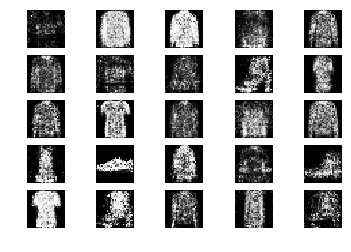

6051 [D loss: 0.617701, acc.: 67.19%] [G loss: 1.024307]
6052 [D loss: 0.543194, acc.: 75.00%] [G loss: 0.982022]
6053 [D loss: 0.688763, acc.: 51.56%] [G loss: 1.011297]
6054 [D loss: 0.704015, acc.: 51.56%] [G loss: 0.901537]
6055 [D loss: 0.692674, acc.: 53.12%] [G loss: 0.908663]
6056 [D loss: 0.651882, acc.: 56.25%] [G loss: 0.936378]
6057 [D loss: 0.619065, acc.: 70.31%] [G loss: 0.935401]
6058 [D loss: 0.670367, acc.: 64.06%] [G loss: 0.927778]
6059 [D loss: 0.653007, acc.: 60.94%] [G loss: 0.993287]
6060 [D loss: 0.664828, acc.: 50.00%] [G loss: 0.957997]
6061 [D loss: 0.678269, acc.: 60.94%] [G loss: 1.026137]
6062 [D loss: 0.574747, acc.: 67.19%] [G loss: 0.982977]
6063 [D loss: 0.615853, acc.: 62.50%] [G loss: 0.934114]
6064 [D loss: 0.588852, acc.: 70.31%] [G loss: 0.979962]
6065 [D loss: 0.556952, acc.: 75.00%] [G loss: 0.947729]
6066 [D loss: 0.659503, acc.: 60.94%] [G loss: 0.911689]
6067 [D loss: 0.632448, acc.: 59.38%] [G loss: 0.922976]
6068 [D loss: 0.666173, acc.: 6

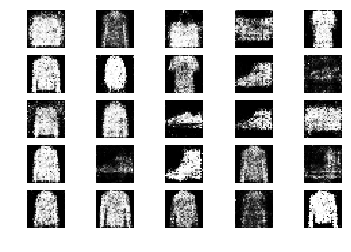

6101 [D loss: 0.629952, acc.: 62.50%] [G loss: 0.872443]
6102 [D loss: 0.592221, acc.: 68.75%] [G loss: 0.918353]
6103 [D loss: 0.573837, acc.: 68.75%] [G loss: 0.952954]
6104 [D loss: 0.658471, acc.: 68.75%] [G loss: 0.910365]
6105 [D loss: 0.632840, acc.: 62.50%] [G loss: 0.910139]
6106 [D loss: 0.648401, acc.: 57.81%] [G loss: 0.897746]
6107 [D loss: 0.698766, acc.: 54.69%] [G loss: 0.946585]
6108 [D loss: 0.568973, acc.: 67.19%] [G loss: 0.889065]
6109 [D loss: 0.633804, acc.: 65.62%] [G loss: 0.888885]
6110 [D loss: 0.614940, acc.: 64.06%] [G loss: 1.065965]
6111 [D loss: 0.698627, acc.: 53.12%] [G loss: 0.947442]
6112 [D loss: 0.637026, acc.: 64.06%] [G loss: 0.922367]
6113 [D loss: 0.662385, acc.: 68.75%] [G loss: 1.007553]
6114 [D loss: 0.622954, acc.: 64.06%] [G loss: 1.049449]
6115 [D loss: 0.663486, acc.: 60.94%] [G loss: 0.935790]
6116 [D loss: 0.624148, acc.: 51.56%] [G loss: 0.998144]
6117 [D loss: 0.646711, acc.: 57.81%] [G loss: 0.921834]
6118 [D loss: 0.579638, acc.: 7

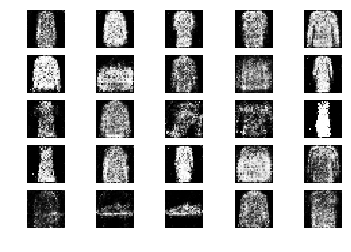

6151 [D loss: 0.628371, acc.: 64.06%] [G loss: 0.874270]
6152 [D loss: 0.662605, acc.: 67.19%] [G loss: 0.935035]
6153 [D loss: 0.626307, acc.: 64.06%] [G loss: 0.935659]
6154 [D loss: 0.636918, acc.: 62.50%] [G loss: 0.894863]
6155 [D loss: 0.603500, acc.: 64.06%] [G loss: 0.928671]
6156 [D loss: 0.681621, acc.: 51.56%] [G loss: 0.966929]
6157 [D loss: 0.631446, acc.: 64.06%] [G loss: 0.948057]
6158 [D loss: 0.646549, acc.: 57.81%] [G loss: 0.993497]
6159 [D loss: 0.678054, acc.: 60.94%] [G loss: 0.952873]
6160 [D loss: 0.631882, acc.: 62.50%] [G loss: 0.958407]
6161 [D loss: 0.628290, acc.: 68.75%] [G loss: 0.951461]
6162 [D loss: 0.571121, acc.: 75.00%] [G loss: 0.874521]
6163 [D loss: 0.590457, acc.: 75.00%] [G loss: 0.917068]
6164 [D loss: 0.632640, acc.: 56.25%] [G loss: 0.923237]
6165 [D loss: 0.652159, acc.: 53.12%] [G loss: 0.872466]
6166 [D loss: 0.696226, acc.: 60.94%] [G loss: 0.860864]
6167 [D loss: 0.621786, acc.: 64.06%] [G loss: 0.797174]
6168 [D loss: 0.652753, acc.: 6

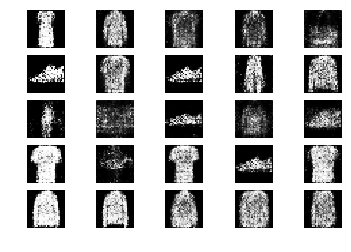

6201 [D loss: 0.687847, acc.: 57.81%] [G loss: 0.942676]
6202 [D loss: 0.651237, acc.: 70.31%] [G loss: 1.061181]
6203 [D loss: 0.676743, acc.: 56.25%] [G loss: 0.952649]
6204 [D loss: 0.663712, acc.: 60.94%] [G loss: 0.893442]
6205 [D loss: 0.625464, acc.: 64.06%] [G loss: 0.868514]
6206 [D loss: 0.663203, acc.: 51.56%] [G loss: 0.927610]
6207 [D loss: 0.607033, acc.: 70.31%] [G loss: 0.878140]
6208 [D loss: 0.601547, acc.: 64.06%] [G loss: 0.965274]
6209 [D loss: 0.654083, acc.: 60.94%] [G loss: 0.788705]
6210 [D loss: 0.688240, acc.: 56.25%] [G loss: 0.910925]
6211 [D loss: 0.639302, acc.: 54.69%] [G loss: 0.835474]
6212 [D loss: 0.668771, acc.: 54.69%] [G loss: 0.955203]
6213 [D loss: 0.616720, acc.: 70.31%] [G loss: 0.858793]
6214 [D loss: 0.609703, acc.: 68.75%] [G loss: 0.942468]
6215 [D loss: 0.663601, acc.: 56.25%] [G loss: 0.865664]
6216 [D loss: 0.733867, acc.: 51.56%] [G loss: 0.874582]
6217 [D loss: 0.700870, acc.: 65.62%] [G loss: 0.883116]
6218 [D loss: 0.614780, acc.: 6

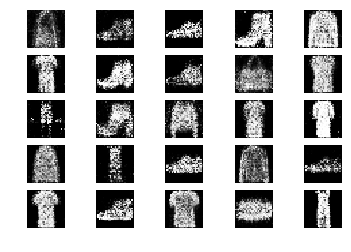

6251 [D loss: 0.775817, acc.: 48.44%] [G loss: 0.868656]
6252 [D loss: 0.624689, acc.: 64.06%] [G loss: 0.953641]
6253 [D loss: 0.674062, acc.: 57.81%] [G loss: 0.876671]
6254 [D loss: 0.701562, acc.: 53.12%] [G loss: 0.922585]
6255 [D loss: 0.713956, acc.: 46.88%] [G loss: 0.908582]
6256 [D loss: 0.636579, acc.: 62.50%] [G loss: 0.872158]
6257 [D loss: 0.683563, acc.: 57.81%] [G loss: 0.838009]
6258 [D loss: 0.649704, acc.: 57.81%] [G loss: 0.953219]
6259 [D loss: 0.657696, acc.: 57.81%] [G loss: 0.847919]
6260 [D loss: 0.637534, acc.: 57.81%] [G loss: 0.904416]
6261 [D loss: 0.640461, acc.: 59.38%] [G loss: 0.958872]
6262 [D loss: 0.617990, acc.: 70.31%] [G loss: 0.970728]
6263 [D loss: 0.642540, acc.: 60.94%] [G loss: 0.990596]
6264 [D loss: 0.641566, acc.: 65.62%] [G loss: 0.973218]
6265 [D loss: 0.622669, acc.: 65.62%] [G loss: 1.039488]
6266 [D loss: 0.647386, acc.: 59.38%] [G loss: 0.998307]
6267 [D loss: 0.585837, acc.: 70.31%] [G loss: 1.018734]
6268 [D loss: 0.576985, acc.: 7

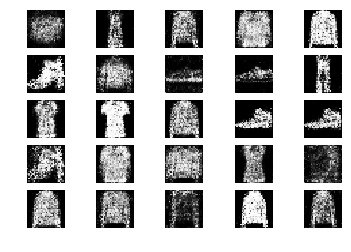

6301 [D loss: 0.656893, acc.: 68.75%] [G loss: 0.888958]
6302 [D loss: 0.624238, acc.: 64.06%] [G loss: 0.922478]
6303 [D loss: 0.657632, acc.: 64.06%] [G loss: 0.963153]
6304 [D loss: 0.652326, acc.: 62.50%] [G loss: 0.971220]
6305 [D loss: 0.657006, acc.: 60.94%] [G loss: 0.914388]
6306 [D loss: 0.670109, acc.: 53.12%] [G loss: 0.894114]
6307 [D loss: 0.582945, acc.: 67.19%] [G loss: 0.894041]
6308 [D loss: 0.643122, acc.: 57.81%] [G loss: 0.886035]
6309 [D loss: 0.672545, acc.: 54.69%] [G loss: 0.902975]
6310 [D loss: 0.649942, acc.: 54.69%] [G loss: 0.910065]
6311 [D loss: 0.625857, acc.: 50.00%] [G loss: 0.901841]
6312 [D loss: 0.619388, acc.: 68.75%] [G loss: 0.927347]
6313 [D loss: 0.680186, acc.: 53.12%] [G loss: 0.913251]
6314 [D loss: 0.684546, acc.: 59.38%] [G loss: 0.923211]
6315 [D loss: 0.629810, acc.: 67.19%] [G loss: 0.913429]
6316 [D loss: 0.670888, acc.: 56.25%] [G loss: 0.979104]
6317 [D loss: 0.670578, acc.: 53.12%] [G loss: 0.969214]
6318 [D loss: 0.637445, acc.: 6

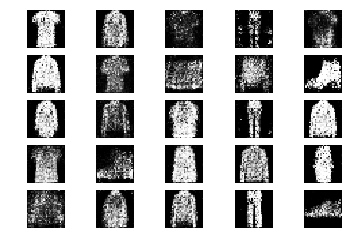

6351 [D loss: 0.604717, acc.: 67.19%] [G loss: 0.922076]
6352 [D loss: 0.686815, acc.: 54.69%] [G loss: 0.977847]
6353 [D loss: 0.637715, acc.: 60.94%] [G loss: 0.967426]
6354 [D loss: 0.676278, acc.: 54.69%] [G loss: 0.902798]
6355 [D loss: 0.667373, acc.: 54.69%] [G loss: 0.976302]
6356 [D loss: 0.672787, acc.: 54.69%] [G loss: 0.954180]
6357 [D loss: 0.682914, acc.: 57.81%] [G loss: 0.897150]
6358 [D loss: 0.622514, acc.: 65.62%] [G loss: 0.981434]
6359 [D loss: 0.614326, acc.: 64.06%] [G loss: 1.020978]
6360 [D loss: 0.690862, acc.: 54.69%] [G loss: 0.931994]
6361 [D loss: 0.635617, acc.: 59.38%] [G loss: 0.938831]
6362 [D loss: 0.649050, acc.: 64.06%] [G loss: 0.859627]
6363 [D loss: 0.590236, acc.: 65.62%] [G loss: 0.975317]
6364 [D loss: 0.650879, acc.: 62.50%] [G loss: 0.893189]
6365 [D loss: 0.611446, acc.: 68.75%] [G loss: 0.933285]
6366 [D loss: 0.614211, acc.: 62.50%] [G loss: 0.974019]
6367 [D loss: 0.662964, acc.: 60.94%] [G loss: 0.868347]
6368 [D loss: 0.661795, acc.: 5

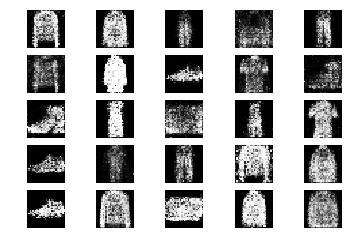

6401 [D loss: 0.648725, acc.: 57.81%] [G loss: 1.022133]
6402 [D loss: 0.577666, acc.: 75.00%] [G loss: 0.948291]
6403 [D loss: 0.645796, acc.: 67.19%] [G loss: 1.097642]
6404 [D loss: 0.664703, acc.: 62.50%] [G loss: 0.924407]
6405 [D loss: 0.587858, acc.: 67.19%] [G loss: 0.919052]
6406 [D loss: 0.599651, acc.: 70.31%] [G loss: 0.867799]
6407 [D loss: 0.610456, acc.: 65.62%] [G loss: 0.839131]
6408 [D loss: 0.658798, acc.: 62.50%] [G loss: 0.900257]
6409 [D loss: 0.664946, acc.: 54.69%] [G loss: 0.968839]
6410 [D loss: 0.663593, acc.: 60.94%] [G loss: 0.937469]
6411 [D loss: 0.672258, acc.: 60.94%] [G loss: 0.922704]
6412 [D loss: 0.581495, acc.: 75.00%] [G loss: 0.980574]
6413 [D loss: 0.613157, acc.: 60.94%] [G loss: 0.984564]
6414 [D loss: 0.592434, acc.: 57.81%] [G loss: 0.951468]
6415 [D loss: 0.599946, acc.: 65.62%] [G loss: 0.893767]
6416 [D loss: 0.648514, acc.: 65.62%] [G loss: 0.940953]
6417 [D loss: 0.605546, acc.: 67.19%] [G loss: 0.835324]
6418 [D loss: 0.621414, acc.: 6

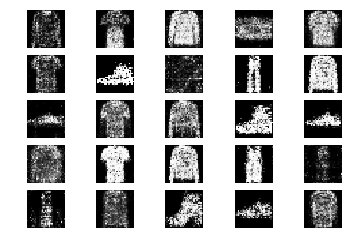

6451 [D loss: 0.643000, acc.: 65.62%] [G loss: 0.879973]
6452 [D loss: 0.716284, acc.: 50.00%] [G loss: 0.909156]
6453 [D loss: 0.685497, acc.: 51.56%] [G loss: 0.843179]
6454 [D loss: 0.676577, acc.: 65.62%] [G loss: 0.928362]
6455 [D loss: 0.672797, acc.: 56.25%] [G loss: 0.895472]
6456 [D loss: 0.718398, acc.: 54.69%] [G loss: 0.911612]
6457 [D loss: 0.670862, acc.: 59.38%] [G loss: 0.947726]
6458 [D loss: 0.634044, acc.: 67.19%] [G loss: 0.915326]
6459 [D loss: 0.659846, acc.: 50.00%] [G loss: 0.911145]
6460 [D loss: 0.700794, acc.: 54.69%] [G loss: 0.917740]
6461 [D loss: 0.660826, acc.: 67.19%] [G loss: 0.831357]
6462 [D loss: 0.673885, acc.: 67.19%] [G loss: 0.941603]
6463 [D loss: 0.647418, acc.: 56.25%] [G loss: 0.915024]
6464 [D loss: 0.564163, acc.: 75.00%] [G loss: 0.959347]
6465 [D loss: 0.681359, acc.: 54.69%] [G loss: 0.968816]
6466 [D loss: 0.581922, acc.: 68.75%] [G loss: 0.943287]
6467 [D loss: 0.666862, acc.: 50.00%] [G loss: 0.951861]
6468 [D loss: 0.671434, acc.: 5

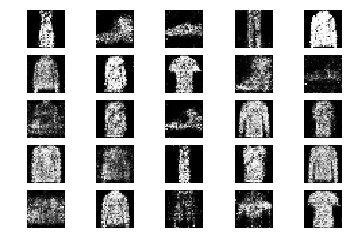

6501 [D loss: 0.675019, acc.: 50.00%] [G loss: 0.906564]
6502 [D loss: 0.658400, acc.: 68.75%] [G loss: 1.004244]
6503 [D loss: 0.631582, acc.: 67.19%] [G loss: 0.953910]
6504 [D loss: 0.691988, acc.: 59.38%] [G loss: 0.920988]
6505 [D loss: 0.555396, acc.: 82.81%] [G loss: 0.891116]
6506 [D loss: 0.596506, acc.: 67.19%] [G loss: 0.901098]
6507 [D loss: 0.635462, acc.: 60.94%] [G loss: 0.960650]
6508 [D loss: 0.619200, acc.: 62.50%] [G loss: 0.925415]
6509 [D loss: 0.605499, acc.: 71.88%] [G loss: 0.938203]
6510 [D loss: 0.647414, acc.: 67.19%] [G loss: 0.917300]
6511 [D loss: 0.598391, acc.: 68.75%] [G loss: 0.976792]
6512 [D loss: 0.633379, acc.: 60.94%] [G loss: 0.879349]
6513 [D loss: 0.668169, acc.: 54.69%] [G loss: 0.840851]
6514 [D loss: 0.628523, acc.: 57.81%] [G loss: 0.919649]
6515 [D loss: 0.644139, acc.: 62.50%] [G loss: 0.833404]
6516 [D loss: 0.656793, acc.: 64.06%] [G loss: 0.897354]
6517 [D loss: 0.662271, acc.: 60.94%] [G loss: 0.998773]
6518 [D loss: 0.659245, acc.: 5

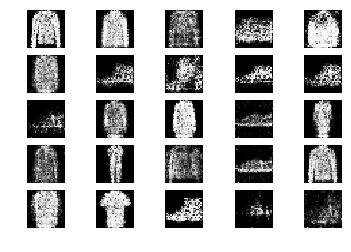

6551 [D loss: 0.665844, acc.: 57.81%] [G loss: 0.885198]
6552 [D loss: 0.654861, acc.: 62.50%] [G loss: 0.952498]
6553 [D loss: 0.666937, acc.: 60.94%] [G loss: 0.968023]
6554 [D loss: 0.630335, acc.: 60.94%] [G loss: 0.939619]
6555 [D loss: 0.672738, acc.: 59.38%] [G loss: 0.988560]
6556 [D loss: 0.666945, acc.: 53.12%] [G loss: 0.982087]
6557 [D loss: 0.673451, acc.: 60.94%] [G loss: 0.960141]
6558 [D loss: 0.647425, acc.: 60.94%] [G loss: 0.933739]
6559 [D loss: 0.677535, acc.: 59.38%] [G loss: 0.918980]
6560 [D loss: 0.660705, acc.: 59.38%] [G loss: 0.868312]
6561 [D loss: 0.593078, acc.: 70.31%] [G loss: 0.953691]
6562 [D loss: 0.596409, acc.: 62.50%] [G loss: 0.900593]
6563 [D loss: 0.612378, acc.: 67.19%] [G loss: 0.944809]
6564 [D loss: 0.623074, acc.: 64.06%] [G loss: 0.971245]
6565 [D loss: 0.589360, acc.: 71.88%] [G loss: 0.959696]
6566 [D loss: 0.658978, acc.: 60.94%] [G loss: 0.919527]
6567 [D loss: 0.678421, acc.: 56.25%] [G loss: 0.953282]
6568 [D loss: 0.565287, acc.: 7

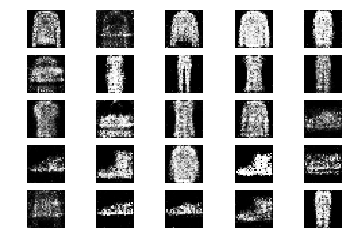

6601 [D loss: 0.626666, acc.: 62.50%] [G loss: 0.829164]
6602 [D loss: 0.637669, acc.: 60.94%] [G loss: 0.879418]
6603 [D loss: 0.687115, acc.: 60.94%] [G loss: 0.902153]
6604 [D loss: 0.625304, acc.: 65.62%] [G loss: 0.859118]
6605 [D loss: 0.641258, acc.: 57.81%] [G loss: 0.954170]
6606 [D loss: 0.574962, acc.: 62.50%] [G loss: 0.968317]
6607 [D loss: 0.697149, acc.: 50.00%] [G loss: 0.957101]
6608 [D loss: 0.588049, acc.: 62.50%] [G loss: 1.045513]
6609 [D loss: 0.646834, acc.: 60.94%] [G loss: 1.007805]
6610 [D loss: 0.589717, acc.: 71.88%] [G loss: 0.947470]
6611 [D loss: 0.663370, acc.: 57.81%] [G loss: 0.912758]
6612 [D loss: 0.652357, acc.: 56.25%] [G loss: 0.970121]
6613 [D loss: 0.679924, acc.: 57.81%] [G loss: 0.983155]
6614 [D loss: 0.648249, acc.: 68.75%] [G loss: 0.860109]
6615 [D loss: 0.774190, acc.: 43.75%] [G loss: 0.944855]
6616 [D loss: 0.593057, acc.: 67.19%] [G loss: 0.921525]
6617 [D loss: 0.630893, acc.: 70.31%] [G loss: 0.947427]
6618 [D loss: 0.675650, acc.: 5

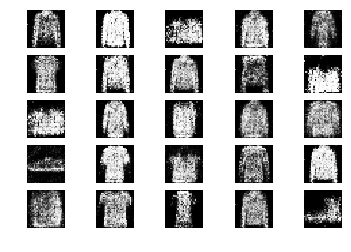

6651 [D loss: 0.626866, acc.: 65.62%] [G loss: 0.894943]
6652 [D loss: 0.559426, acc.: 75.00%] [G loss: 1.014736]
6653 [D loss: 0.591741, acc.: 67.19%] [G loss: 0.882349]
6654 [D loss: 0.578260, acc.: 67.19%] [G loss: 0.946405]
6655 [D loss: 0.653538, acc.: 64.06%] [G loss: 0.892941]
6656 [D loss: 0.609071, acc.: 71.88%] [G loss: 0.879532]
6657 [D loss: 0.604045, acc.: 65.62%] [G loss: 0.906345]
6658 [D loss: 0.651700, acc.: 65.62%] [G loss: 0.831775]
6659 [D loss: 0.638909, acc.: 59.38%] [G loss: 0.903698]
6660 [D loss: 0.638230, acc.: 62.50%] [G loss: 0.963354]
6661 [D loss: 0.627753, acc.: 59.38%] [G loss: 0.909347]
6662 [D loss: 0.701169, acc.: 54.69%] [G loss: 0.920511]
6663 [D loss: 0.619859, acc.: 67.19%] [G loss: 0.894032]
6664 [D loss: 0.658298, acc.: 60.94%] [G loss: 0.992793]
6665 [D loss: 0.677543, acc.: 60.94%] [G loss: 0.975763]
6666 [D loss: 0.736597, acc.: 48.44%] [G loss: 0.966016]
6667 [D loss: 0.572759, acc.: 73.44%] [G loss: 0.902689]
6668 [D loss: 0.631438, acc.: 6

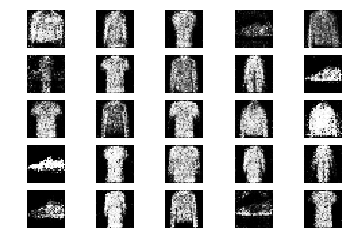

6701 [D loss: 0.713748, acc.: 59.38%] [G loss: 0.925258]
6702 [D loss: 0.644243, acc.: 64.06%] [G loss: 0.972815]
6703 [D loss: 0.638314, acc.: 67.19%] [G loss: 0.913671]
6704 [D loss: 0.615676, acc.: 67.19%] [G loss: 1.014863]
6705 [D loss: 0.629000, acc.: 62.50%] [G loss: 0.942180]
6706 [D loss: 0.714654, acc.: 45.31%] [G loss: 0.886107]
6707 [D loss: 0.622256, acc.: 64.06%] [G loss: 0.956164]
6708 [D loss: 0.622859, acc.: 68.75%] [G loss: 0.968406]
6709 [D loss: 0.642083, acc.: 68.75%] [G loss: 0.829414]
6710 [D loss: 0.592283, acc.: 75.00%] [G loss: 0.823842]
6711 [D loss: 0.713640, acc.: 54.69%] [G loss: 0.905730]
6712 [D loss: 0.684440, acc.: 54.69%] [G loss: 0.931703]
6713 [D loss: 0.643483, acc.: 54.69%] [G loss: 0.900044]
6714 [D loss: 0.649873, acc.: 60.94%] [G loss: 0.911855]
6715 [D loss: 0.638470, acc.: 67.19%] [G loss: 1.005544]
6716 [D loss: 0.673838, acc.: 59.38%] [G loss: 0.965132]
6717 [D loss: 0.712562, acc.: 43.75%] [G loss: 0.925069]
6718 [D loss: 0.711588, acc.: 5

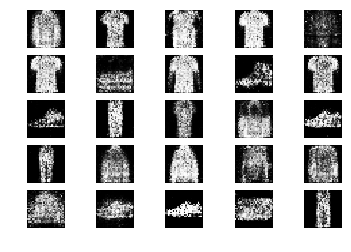

6751 [D loss: 0.625458, acc.: 65.62%] [G loss: 0.942286]
6752 [D loss: 0.637088, acc.: 67.19%] [G loss: 0.937013]
6753 [D loss: 0.607364, acc.: 67.19%] [G loss: 0.890553]
6754 [D loss: 0.646800, acc.: 65.62%] [G loss: 0.951538]
6755 [D loss: 0.612517, acc.: 65.62%] [G loss: 0.929557]
6756 [D loss: 0.628200, acc.: 60.94%] [G loss: 0.957485]
6757 [D loss: 0.648594, acc.: 59.38%] [G loss: 0.908485]
6758 [D loss: 0.667481, acc.: 57.81%] [G loss: 0.904342]
6759 [D loss: 0.666779, acc.: 64.06%] [G loss: 0.958243]
6760 [D loss: 0.612456, acc.: 64.06%] [G loss: 1.067191]
6761 [D loss: 0.623710, acc.: 70.31%] [G loss: 0.885026]
6762 [D loss: 0.650336, acc.: 57.81%] [G loss: 0.857097]
6763 [D loss: 0.641570, acc.: 59.38%] [G loss: 0.882142]
6764 [D loss: 0.593958, acc.: 68.75%] [G loss: 0.863888]
6765 [D loss: 0.639421, acc.: 64.06%] [G loss: 0.861277]
6766 [D loss: 0.673099, acc.: 54.69%] [G loss: 0.849257]
6767 [D loss: 0.683004, acc.: 53.12%] [G loss: 0.873297]
6768 [D loss: 0.645453, acc.: 5

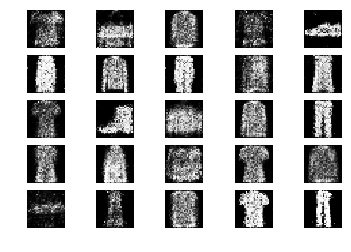

6801 [D loss: 0.637820, acc.: 67.19%] [G loss: 0.929109]
6802 [D loss: 0.677982, acc.: 56.25%] [G loss: 0.867815]
6803 [D loss: 0.648954, acc.: 62.50%] [G loss: 0.886010]
6804 [D loss: 0.671286, acc.: 54.69%] [G loss: 0.833171]
6805 [D loss: 0.668535, acc.: 62.50%] [G loss: 0.988140]
6806 [D loss: 0.647229, acc.: 64.06%] [G loss: 0.843137]
6807 [D loss: 0.648012, acc.: 67.19%] [G loss: 0.906286]
6808 [D loss: 0.700935, acc.: 43.75%] [G loss: 0.908800]
6809 [D loss: 0.630099, acc.: 71.88%] [G loss: 0.855348]
6810 [D loss: 0.662733, acc.: 64.06%] [G loss: 0.914935]
6811 [D loss: 0.604828, acc.: 71.88%] [G loss: 0.948413]
6812 [D loss: 0.681011, acc.: 64.06%] [G loss: 0.936728]
6813 [D loss: 0.642615, acc.: 71.88%] [G loss: 0.890473]
6814 [D loss: 0.627225, acc.: 70.31%] [G loss: 0.950514]
6815 [D loss: 0.628064, acc.: 68.75%] [G loss: 0.994551]
6816 [D loss: 0.631296, acc.: 60.94%] [G loss: 0.894982]
6817 [D loss: 0.677254, acc.: 51.56%] [G loss: 0.929211]
6818 [D loss: 0.663835, acc.: 5

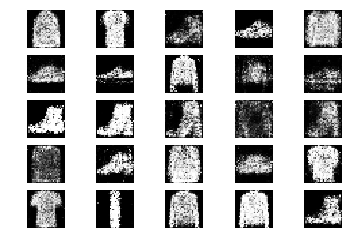

6851 [D loss: 0.665564, acc.: 62.50%] [G loss: 0.845306]
6852 [D loss: 0.630415, acc.: 65.62%] [G loss: 0.874507]
6853 [D loss: 0.709147, acc.: 50.00%] [G loss: 0.913440]
6854 [D loss: 0.614343, acc.: 65.62%] [G loss: 0.974086]
6855 [D loss: 0.677920, acc.: 57.81%] [G loss: 0.883515]
6856 [D loss: 0.707948, acc.: 59.38%] [G loss: 0.885026]
6857 [D loss: 0.665421, acc.: 59.38%] [G loss: 0.829282]
6858 [D loss: 0.619278, acc.: 75.00%] [G loss: 0.850923]
6859 [D loss: 0.680334, acc.: 50.00%] [G loss: 0.914890]
6860 [D loss: 0.613816, acc.: 67.19%] [G loss: 0.852703]
6861 [D loss: 0.673797, acc.: 60.94%] [G loss: 0.813316]
6862 [D loss: 0.575245, acc.: 70.31%] [G loss: 0.869769]
6863 [D loss: 0.669346, acc.: 51.56%] [G loss: 0.913858]
6864 [D loss: 0.580381, acc.: 75.00%] [G loss: 0.900514]
6865 [D loss: 0.641020, acc.: 60.94%] [G loss: 0.959965]
6866 [D loss: 0.645731, acc.: 67.19%] [G loss: 0.910783]
6867 [D loss: 0.665177, acc.: 62.50%] [G loss: 0.989387]
6868 [D loss: 0.683326, acc.: 5

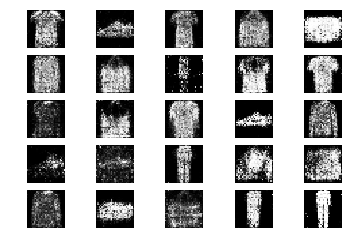

6901 [D loss: 0.591280, acc.: 67.19%] [G loss: 0.915081]
6902 [D loss: 0.604435, acc.: 71.88%] [G loss: 0.935259]
6903 [D loss: 0.620483, acc.: 68.75%] [G loss: 0.960072]
6904 [D loss: 0.634758, acc.: 64.06%] [G loss: 0.955019]
6905 [D loss: 0.648063, acc.: 53.12%] [G loss: 0.882283]
6906 [D loss: 0.697889, acc.: 53.12%] [G loss: 0.844118]
6907 [D loss: 0.644917, acc.: 65.62%] [G loss: 0.865529]
6908 [D loss: 0.704887, acc.: 54.69%] [G loss: 0.899975]
6909 [D loss: 0.712681, acc.: 57.81%] [G loss: 0.942920]
6910 [D loss: 0.615516, acc.: 71.88%] [G loss: 0.959639]
6911 [D loss: 0.695265, acc.: 53.12%] [G loss: 0.855111]
6912 [D loss: 0.643544, acc.: 64.06%] [G loss: 0.901158]
6913 [D loss: 0.641060, acc.: 60.94%] [G loss: 0.903656]
6914 [D loss: 0.753122, acc.: 46.88%] [G loss: 0.912537]
6915 [D loss: 0.662718, acc.: 67.19%] [G loss: 0.861411]
6916 [D loss: 0.616907, acc.: 70.31%] [G loss: 0.904957]
6917 [D loss: 0.679400, acc.: 54.69%] [G loss: 0.874616]
6918 [D loss: 0.649017, acc.: 5

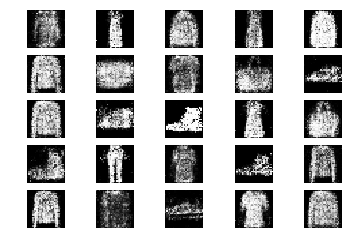

6951 [D loss: 0.607898, acc.: 64.06%] [G loss: 0.931772]
6952 [D loss: 0.675848, acc.: 59.38%] [G loss: 0.952912]
6953 [D loss: 0.614017, acc.: 64.06%] [G loss: 0.985422]
6954 [D loss: 0.625011, acc.: 59.38%] [G loss: 0.942083]
6955 [D loss: 0.644147, acc.: 64.06%] [G loss: 0.889565]
6956 [D loss: 0.618698, acc.: 70.31%] [G loss: 0.820294]
6957 [D loss: 0.572857, acc.: 73.44%] [G loss: 0.820361]
6958 [D loss: 0.624908, acc.: 64.06%] [G loss: 0.858206]
6959 [D loss: 0.620794, acc.: 68.75%] [G loss: 0.913755]
6960 [D loss: 0.603505, acc.: 68.75%] [G loss: 0.844948]
6961 [D loss: 0.743186, acc.: 51.56%] [G loss: 0.825811]
6962 [D loss: 0.630559, acc.: 65.62%] [G loss: 0.823283]
6963 [D loss: 0.629073, acc.: 67.19%] [G loss: 0.895609]
6964 [D loss: 0.624538, acc.: 62.50%] [G loss: 0.862005]
6965 [D loss: 0.620572, acc.: 71.88%] [G loss: 0.959570]
6966 [D loss: 0.624783, acc.: 64.06%] [G loss: 0.948301]
6967 [D loss: 0.637757, acc.: 60.94%] [G loss: 1.008051]
6968 [D loss: 0.644271, acc.: 6

In [0]:
epochs = 7000

batch_size = 32
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

for epoch in range(epochs):
  # Train discriminator
  idx = np.random.randint(0, x_train.shape[0], batch_size)
  imgs = x_train[idx]

  noise = np.random.normal(0, 1, (batch_size, 100))

  gen_imgs = generator.predict(noise)

  d_loss_real = discriminator.train_on_batch(imgs, valid)
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  d_loss = 0.5*np.add(d_loss_real, d_loss_fake)

  # Train generator
  noise = np.random.normal(0, 1, (batch_size, 100))

  g_loss = combined.train_on_batch(noise, valid)

  print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

  if epoch % 50 == 0:
    sample_images(epoch)

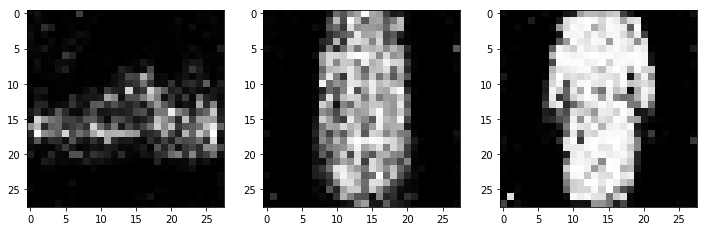

In [0]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r*c, 100))
gen_imgs = generator.predict(noise)

gen_imgs = 0.5*gen_imgs+0.5

plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
plt.subplot(132)
plt.imshow(gen_imgs[1, :, :, 0], cmap='gray')
plt.subplot(133)
plt.imshow(gen_imgs[2, :, :, 0], cmap='gray')
plt.show()
plt.close()